In [1]:
import pandas as pd
import numpy as np
import os
import warnings
import datetime
import ast
import statistics
import sys
from matplotlib.patches import Ellipse
import random
from timeit import default_timer as timer
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.interpolate import griddata
from scipy.stats import mannwhitneyu
from scipy.stats import skew
import scipy.cluster.hierarchy as sch
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist
from scipy.cluster.hierarchy import linkage, cophenet
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.cluster import KMeans

## Merging all data into one dataframe

In [2]:
# Reading all the files and concatenating
csv_file_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Data\CAHR Data\CAHR Combined - Physiology Data"
files = os.listdir(csv_file_directory)

df_all = pd.DataFrame()

parameter_list = ['RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'RSO2_L', 'RSO2_R', 'PbtO2', 'PRx', \
                      'PAx', 'RAC', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']

for file in files:
    df_individual= pd.read_csv(os.path.join(csv_file_directory, file))
    df_individual_cleaned = df_individual.reindex(columns = parameter_list)
    
    filter_condition = (df_individual_cleaned['ICP'] > 100) | (df_individual_cleaned['ICP'] < 0) | \
                       (df_individual_cleaned['MAP'] > 200) | (df_individual_cleaned['MAP'] < 0) | \
                       (df_individual_cleaned['AMP'] > 40)
    df_individual_cleaned = df_individual_cleaned[~filter_condition] 
    
    df_all = pd.concat([df_all, df_individual_cleaned], axis=0, ignore_index=True)

In [3]:
df_all.shape

(3621537, 15)

In [22]:
df_all.head()

,RAP,ICP,AMP,MAP,CPP,RSO2_L,RSO2_R,PbtO2,PRx,PAx,RAC,COx_L,COx_R,COxA_L,COxA_R
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,13.48,1.230,69.96,56.48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,13.83,1.297,69.01,55.18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.5335,13.60,1.223,68.49,54.89,NaN,NaN,NaN,0.0787,-0.0385,-0.1759,NaN,NaN,NaN,NaN
4,0.5667,13.49,1.252,69.12,55.64,NaN,NaN,NaN,0.1505,0.0282,-0.1176,NaN,NaN,NaN,NaN


In [3]:
# Splitting the files according to measurement methods

tic = timer()

csv_file_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Data\CAHR Data\CAHR Combined - Physiology Data"
files = os.listdir(csv_file_directory)

parameter_list_ICP_ABP_measures = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC']
parameter_list_NIRS_measures = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'RSO2_L', 'RSO2_R', 'PRx', 'PAx', \
                      'RAC', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']
parameter_list_PbtO2_measures = ['DateTime', 'RAP', 'ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', 'PbtO2']
                      
files_ICP_ABP_measures = []
files_NIRS_measures = []
files_PbtO2_measures = []

for file in files:
    df_individual = pd.read_csv(os.path.join(csv_file_directory, file))
    df_individual = df_individual.dropna(axis=1, how='all')
    if all(col in df_individual.columns for col in parameter_list_ICP_ABP_measures):
        files_ICP_ABP_measures.append(file)
    if all(col in df_individual.columns for col in parameter_list_NIRS_measures):
        files_NIRS_measures.append(file)
    if all(col in df_individual.columns for col in parameter_list_PbtO2_measures):
        files_PbtO2_measures.append(file)
        
tac = timer()
print("Execution time: ",round(tac-tic, 3), "seconds")

Execution time:  16.245 seconds


In [4]:
print(len(files_ICP_ABP_measures))
print(len(files_NIRS_measures))
print(len(files_PbtO2_measures))

379
133
116


In [5]:
# Reading all the files and concatenating
def concatenating_files(file_segments, parameter_list_segments):
    
    df_all = []
    
    for index, file_segment in enumerate(file_segments):
        df_all_segment = pd.DataFrame()

        for file in file_segment:
            df_individual= pd.read_csv(os.path.join(csv_file_directory, file))
            df_individual_cleaned = df_individual.reindex(columns = parameter_list_segments[index])

            filter_condition = (df_individual_cleaned['ICP'] > 100) | (df_individual_cleaned['ICP'] < 0) | \
                               (df_individual_cleaned['MAP'] > 200) | (df_individual_cleaned['MAP'] < 0) | \
                               (df_individual_cleaned['AMP'] > 40)
            df_individual_cleaned = df_individual_cleaned[~filter_condition] 
            #df_individual_cleaned = df_individual_cleaned.dropna(axis=1, how='all')
            df_all_segment = pd.concat([df_all_segment, df_individual_cleaned], axis=0, ignore_index=True)

        df_all.append(df_all_segment)
        
    return df_all

In [6]:
tic = timer()
file_segments = [files_ICP_ABP_measures, files_NIRS_measures, files_PbtO2_measures]
parameter_list_segments = [parameter_list_ICP_ABP_measures, parameter_list_NIRS_measures, parameter_list_PbtO2_measures]

df_all = concatenating_files(file_segments, parameter_list_segments)

tac = timer()
print("Execution time: ",round((tac-tic)/60, 2), "minutes")

Execution time:  1.02 minutes


In [8]:
df_all[1].head()

,DateTime,RAP,ICP,AMP,MAP,CPP,RSO2_L,RSO2_R,PRx,PAx,RAC,COx_L,COx_R,COxA_L,COxA_R
0,44007.685919,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,44007.686613,NaN,7.100,0.4923,NaN,NaN,75.99,76.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,44007.687308,NaN,7.543,0.5401,NaN,NaN,76.51,77.54,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,44007.688002,0.7833,7.789,0.5510,NaN,NaN,76.18,77.31,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,44007.688696,0.7769,7.739,0.5480,NaN,NaN,75.99,76.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
def cleaning_NIRS_measures_parameters(df_nirs_measures):
    
    filter_condition = (df_nirs_measures['RSO2_L'] < 20) | (df_nirs_measures['RSO2_R'] < 20)
    df_nirs_measures = df_nirs_measures[~filter_condition]
    NIRS_measures_list = ['RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R']
#     df_nirs_measures = df_nirs_measures[~df_nirs_measures['DateTime'].isin(filtered_timestamps)]

    for param in NIRS_measures_list:
        df_nirs_measures = df_nirs_measures.loc[df_nirs_measures[param] != 0]

    return df_nirs_measures

In [8]:
def excel_serial_to_datetime(serial):
    
    return datetime.datetime(1899, 12, 30) + datetime.timedelta(days=serial)

In [9]:
def convert_parameter_resolution(df_main, resolution):
    
    df_all_process = df_main.copy()
    
    df_all_process['datetime'] = df_all_process['DateTime'].apply(excel_serial_to_datetime)
    data_resampled = df_all_process.set_index('datetime')
    data_resampled = data_resampled.resample(resolution).mean()
    
    return data_resampled

## Agglomerative Hierarchical Clustering

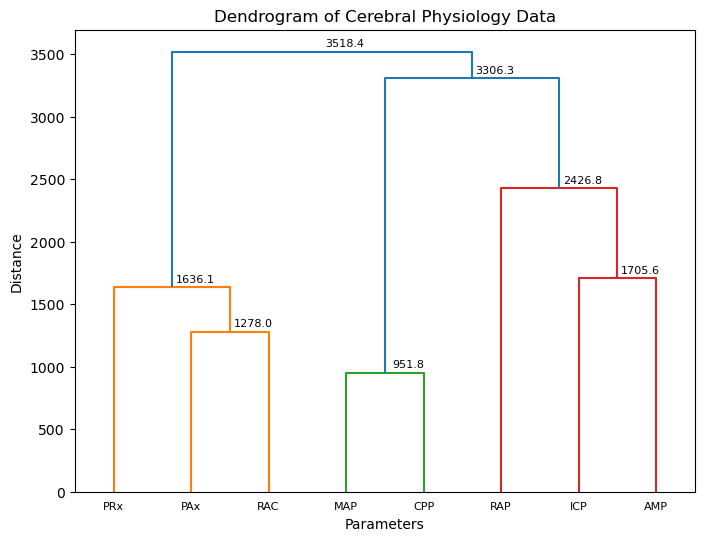

Cophenetic Correlation Coefficient: 0.89


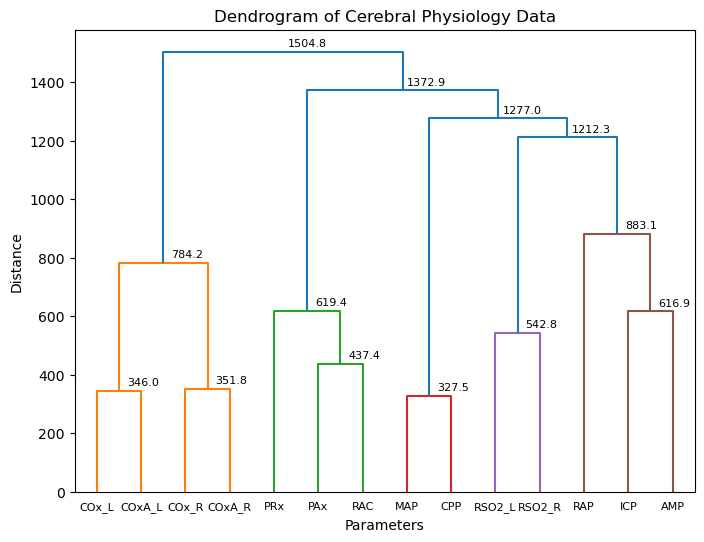

Cophenetic Correlation Coefficient: 0.9


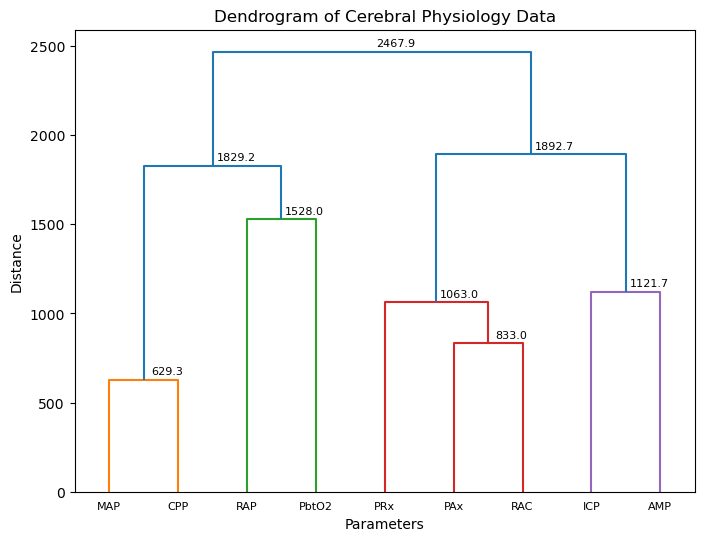

Cophenetic Correlation Coefficient: 0.9


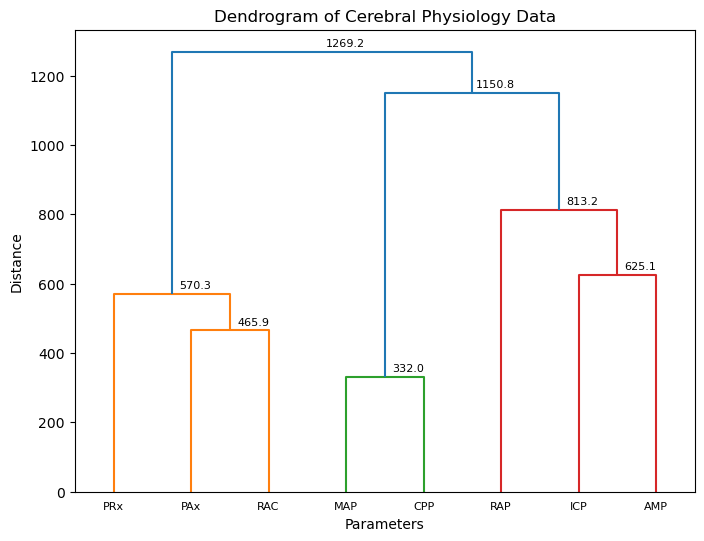

Cophenetic Correlation Coefficient: 0.89


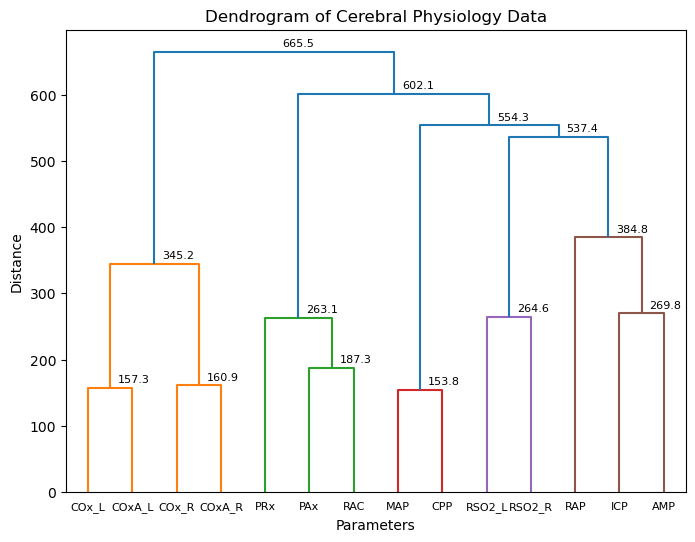

Cophenetic Correlation Coefficient: 0.89


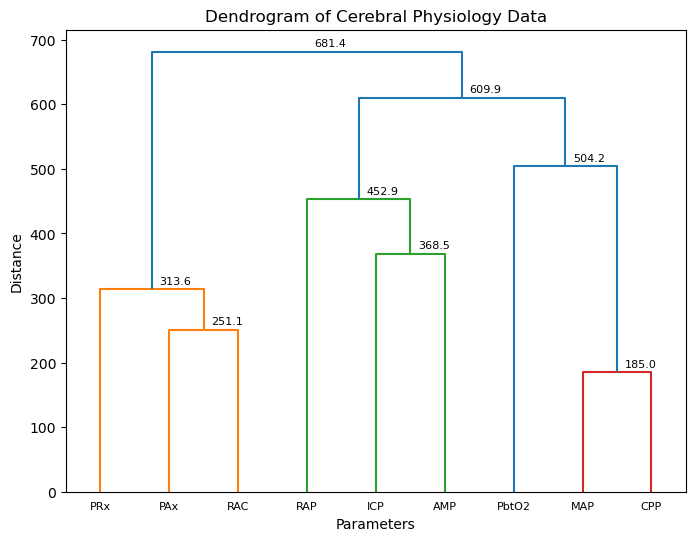

Cophenetic Correlation Coefficient: 0.86


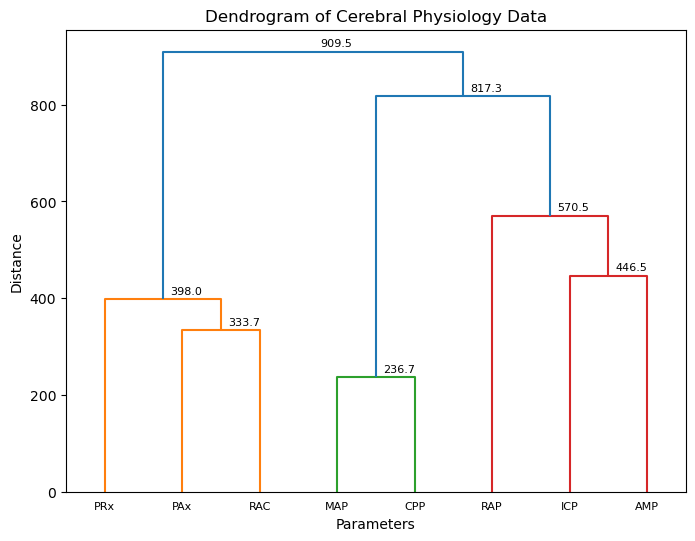

Cophenetic Correlation Coefficient: 0.89


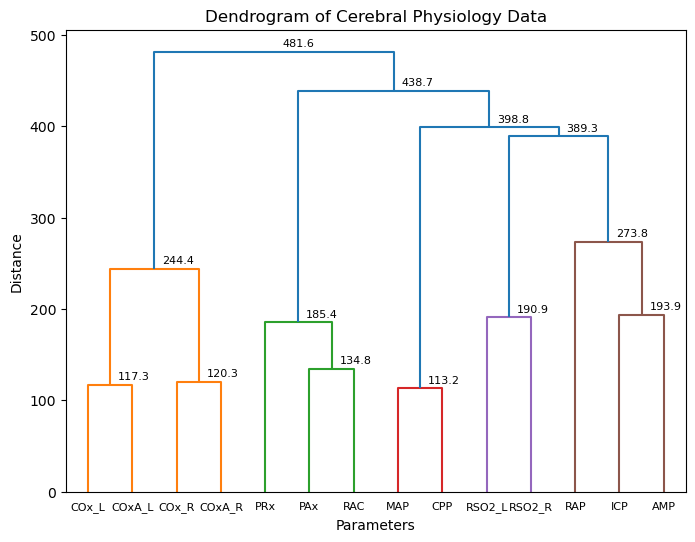

Cophenetic Correlation Coefficient: 0.89


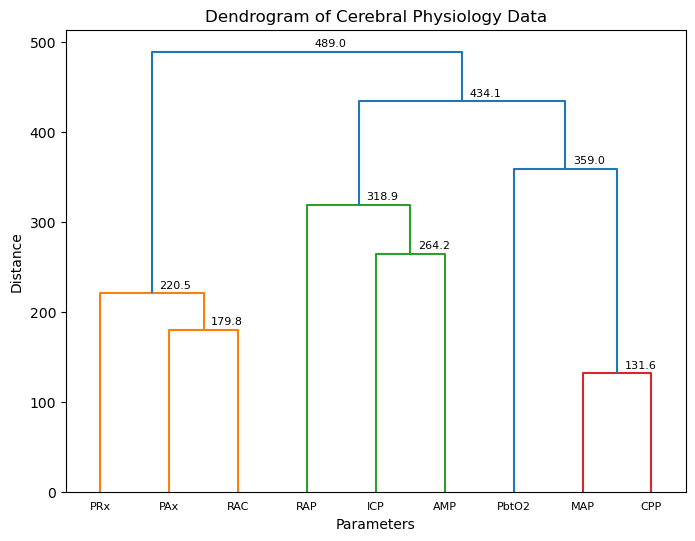

Cophenetic Correlation Coefficient: 0.85


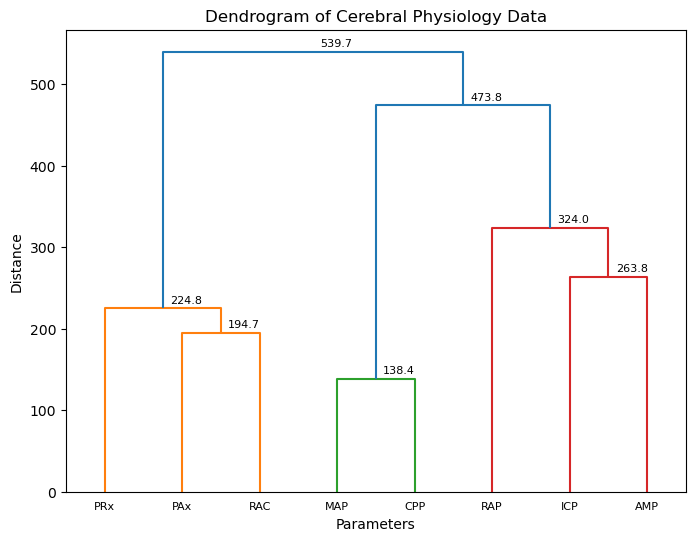

Cophenetic Correlation Coefficient: 0.89


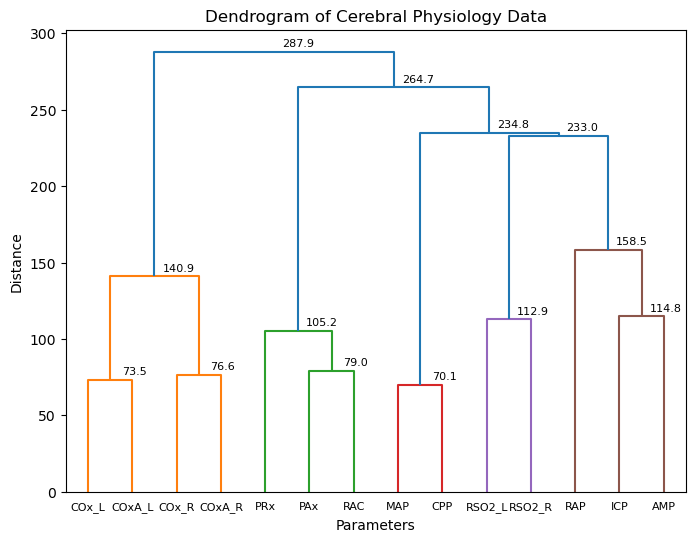

Cophenetic Correlation Coefficient: 0.89


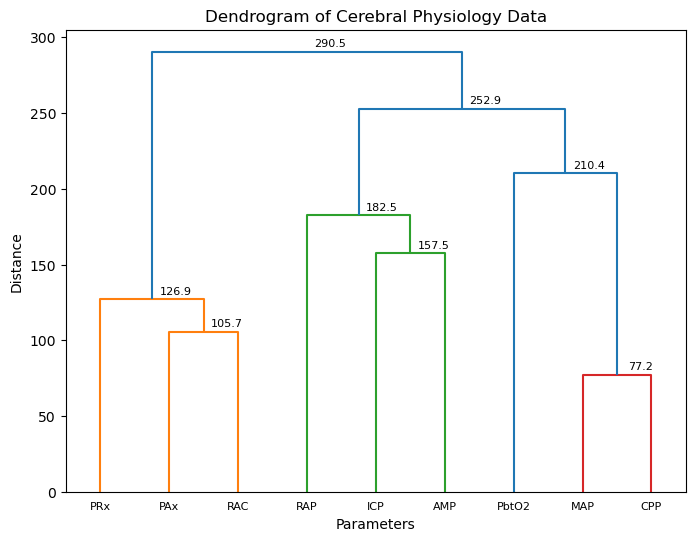

Cophenetic Correlation Coefficient: 0.84


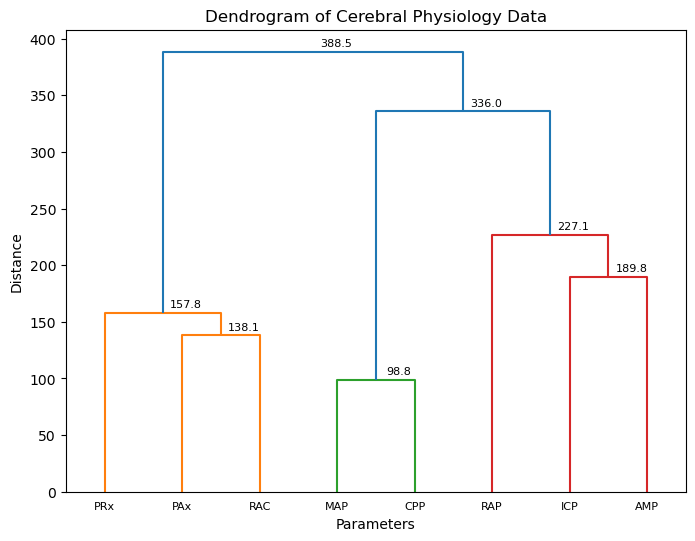

Cophenetic Correlation Coefficient: 0.89


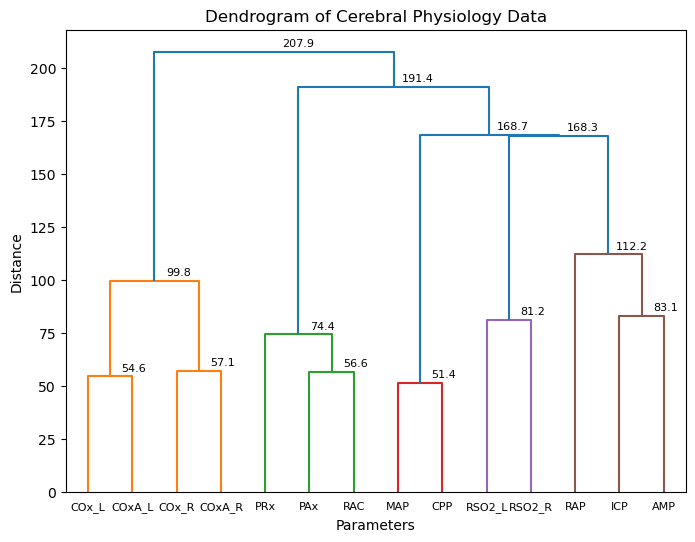

Cophenetic Correlation Coefficient: 0.88


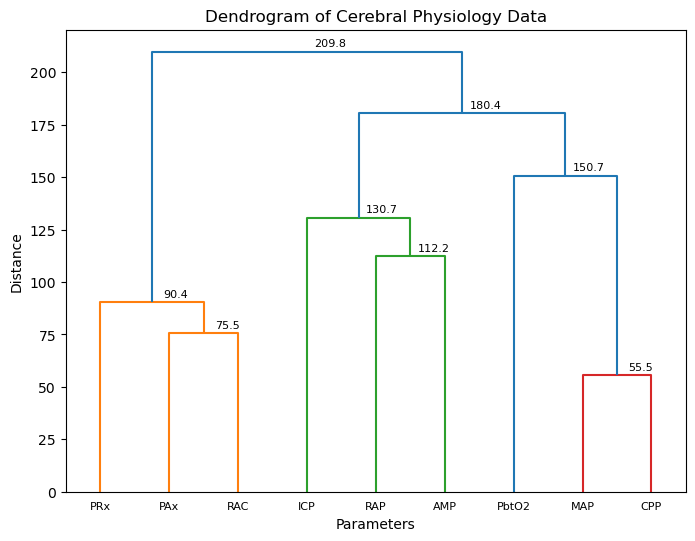

Cophenetic Correlation Coefficient: 0.84
Execution time:  77.98 seconds


In [192]:
tic = timer()

resolutions = ['M', '5T', '10T', '30T', 'H']
column_list = ['File labels', 'One-minute', '5-minute', '10--minute', '30-minute', '1-hour']
               
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

df_cophenetic_corr = pd.DataFrame(index=range(len(file_labels)), columns=column_list)

for resolution_index, resolution in enumerate(resolutions):
    
    for index, file_segment in enumerate(df_all):

        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)
            
        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])

        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(file_segment_edited).T 

        # Performing hierarchical clustering
        linkage_matrix = sch.linkage(data_scaled, method='ward')  # Ward’s method minimizes variance

        # Ploting dendrogram
        plt.figure(figsize=(8, 6))
        dendro = sch.dendrogram(linkage_matrix, labels=file_segment_edited.columns)

        # Annotating the merging points with height values
        for i, d in enumerate(linkage_matrix):
            x = (dendro['icoord'][i][1] + dendro['icoord'][i][2]) / 2  # X-coordinate of merging point
            y = dendro['dcoord'][i][1]  # Height (distance) of merging point
            y_add = 5*np.max(linkage_matrix[:, 2])/701
            x_add = 3*(max(max(icoord) for icoord in dendro['icoord']))/75
            plt.text(x+x_add, y+y_add, f'{y:.1f}', ha='center', va='bottom', fontsize=8, color='black')  # Annotate height

        plt.title('Dendrogram of Cerebral Physiology Data')
        plt.xlabel('Parameters')
        plt.ylabel('Distance')
        plt.xticks(fontsize=8)

        save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\AHC"
        save_image_name = resolution + '_Dendogram_' + file_labels[index]
        plt.savefig(os.path.join(save_image_directory, save_image_name))

        plt.show()

        pairwise_distances = pdist(data_scaled)  # This calculates the Euclidean distance by default

        cophenetic_corr, cophenetic_distances = cophenet(linkage_matrix, pairwise_distances)
        print("Cophenetic Correlation Coefficient:", round(cophenetic_corr, 2))

        df_cophenetic_corr.at[index, 'File labels'] = file_labels[index]
        df_cophenetic_corr.at[index, column_list[resolution_index+1]] = round(cophenetic_corr, 2)
        
tac = timer()
print("Execution time: ",round(tac-tic, 2), "seconds")

In [193]:
df_cophenetic_corr

,File labels,One-minute,5-minute,10--minute,30-minute,1-hour
0,ICP_ABP_measures,0.89,0.89,0.89,0.89,0.89
1,NIRS_measures,0.9,0.89,0.89,0.89,0.88
2,PbtO2_measures,0.9,0.86,0.85,0.84,0.84


# Sub-group analysis

## Visualizing dendogram

In [198]:
def visualizing_dendogram_using_AHC(segment, segment_no, resolution, file_label, labels):
    
    # Scaling the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment).T       # returns numpy array

    # Performing hierarchical clustering
    linkage_matrix = sch.linkage(data_scaled, method='ward')  # Ward’s method minimizes variance

    # Ploting dendrogram
    plt.figure(figsize=(8, 6))
    dendro = sch.dendrogram(linkage_matrix, labels=segment.columns)

    # Annotating the merging points with height values
    for i, d in enumerate(linkage_matrix):
        x = (dendro['icoord'][i][1] + dendro['icoord'][i][2]) / 2  # X-coordinate of merging point
        y = dendro['dcoord'][i][1]  # Height (distance) of merging point
        y_add = 5*np.max(linkage_matrix[:, 2])/701
        x_add = 3*(max(max(icoord) for icoord in dendro['icoord']))/75
        plt.text(x+x_add, y+y_add, f'{y:.1f}', ha='center', va='bottom', fontsize=8, color='black')  # Annotate height

    plot_title = 'Dendrogram of Cerebral Physiology Data: ' + labels[segment_no]
    plt.title(plot_title)
    plt.xlabel('Parameters')
    plt.ylabel('Distance')
    plt.xticks(fontsize=8)

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\AHC\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_Dendogram_' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()
    
    pairwise_distances = pdist(data_scaled)  # This calculates the Euclidean distance by default

    cophenetic_corr, cophenetic_distances = cophenet(linkage_matrix, pairwise_distances)
    print("Cophenetic Correlation Coefficient:", round(cophenetic_corr, 2))
    return cophenetic_corr

Resolution in progress:  M


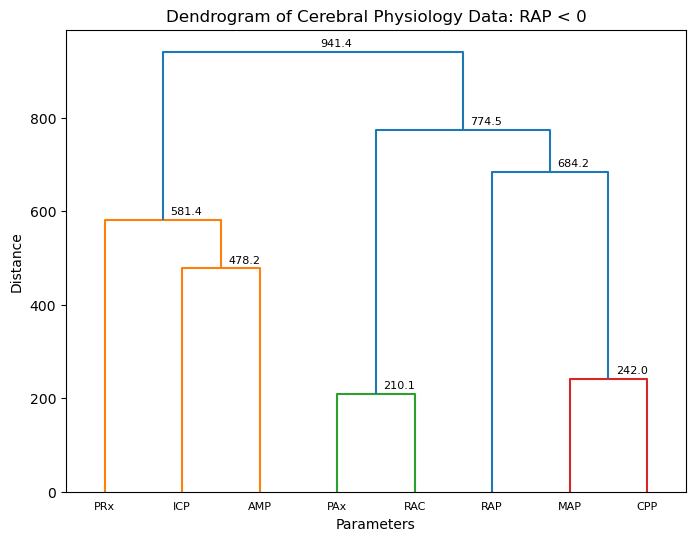

Cophenetic Correlation Coefficient: 0.9


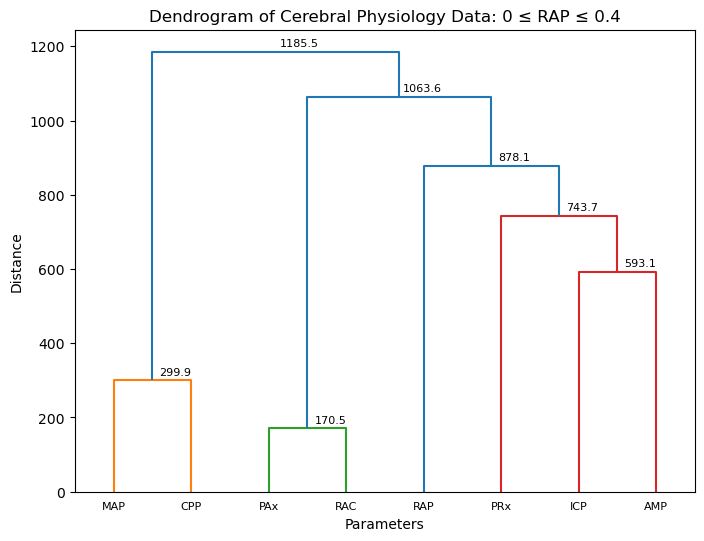

Cophenetic Correlation Coefficient: 0.91


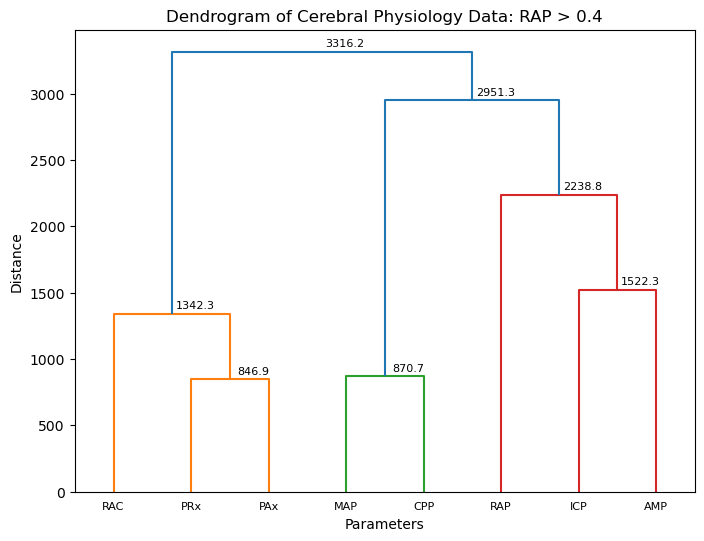

Cophenetic Correlation Coefficient: 0.89


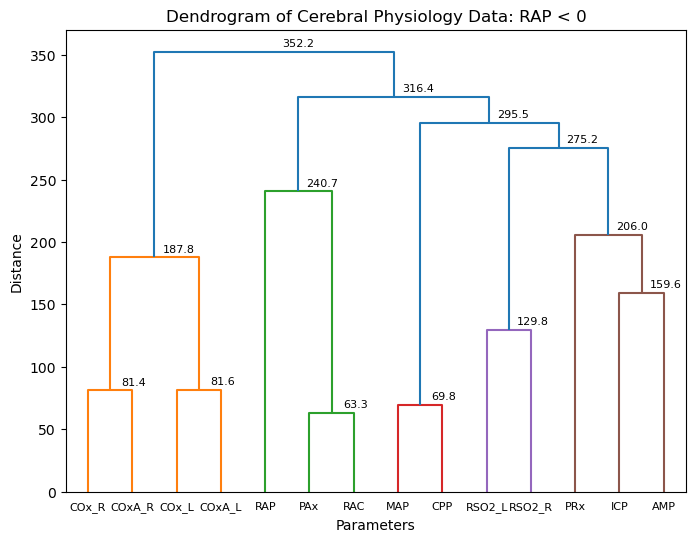

Cophenetic Correlation Coefficient: 0.86


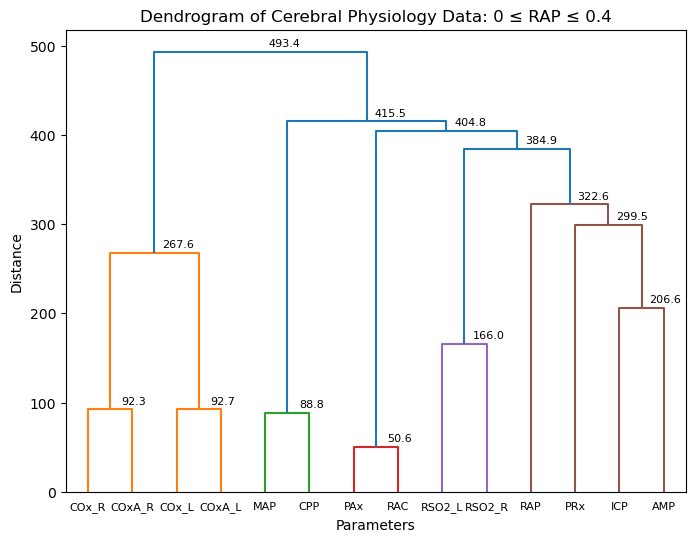

Cophenetic Correlation Coefficient: 0.86


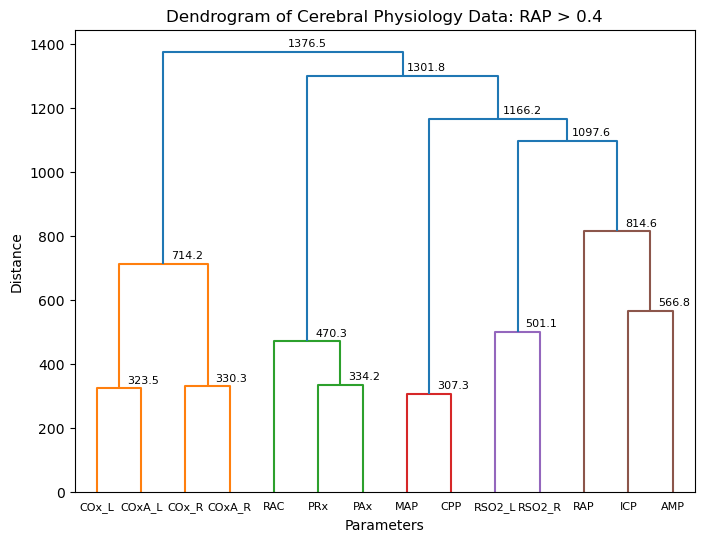

Cophenetic Correlation Coefficient: 0.9


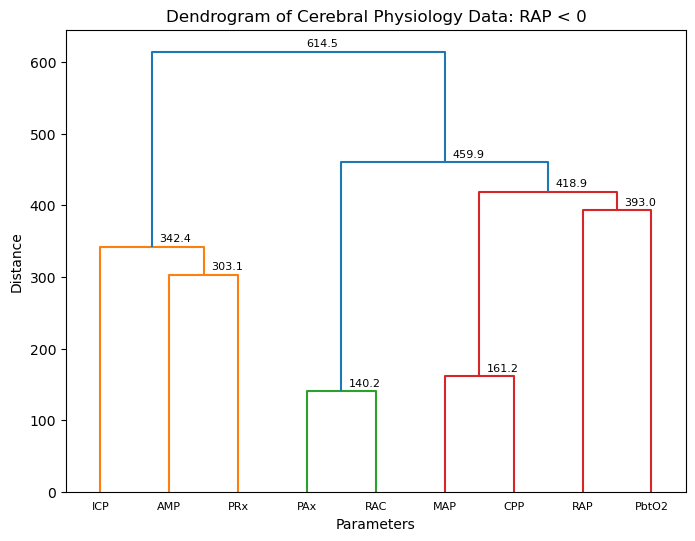

Cophenetic Correlation Coefficient: 0.86


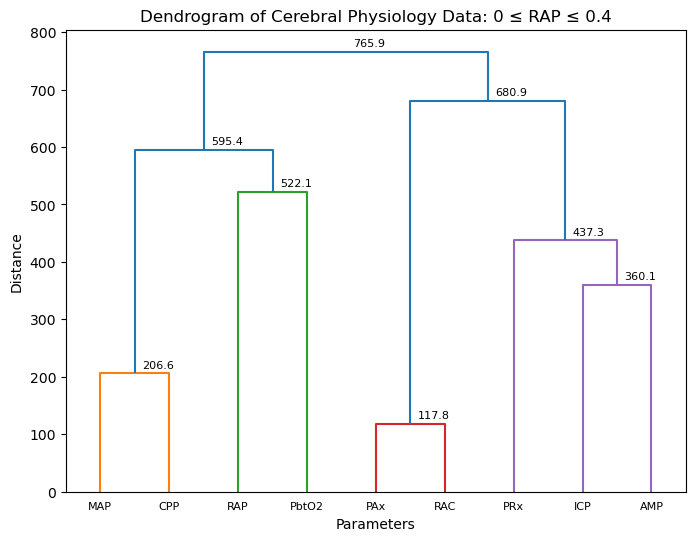

Cophenetic Correlation Coefficient: 0.88


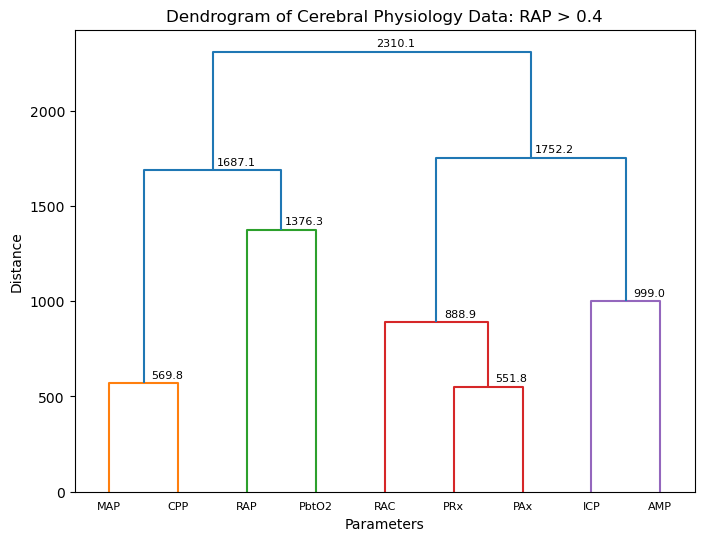

Cophenetic Correlation Coefficient: 0.91
Resolution in progress:  5T


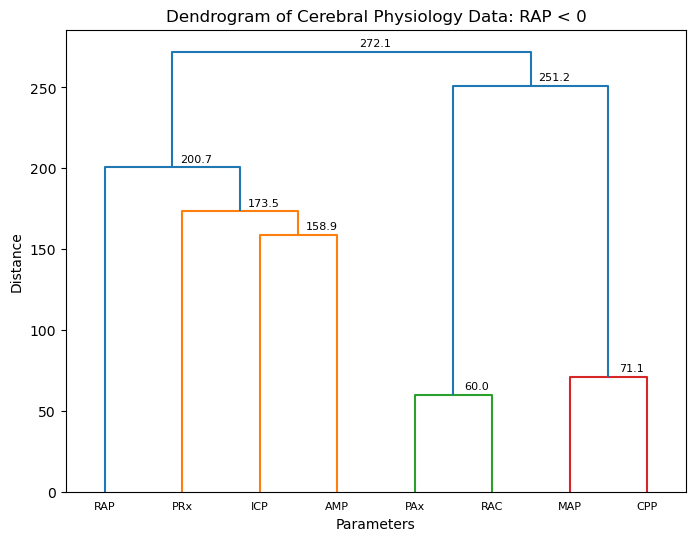

Cophenetic Correlation Coefficient: 0.87


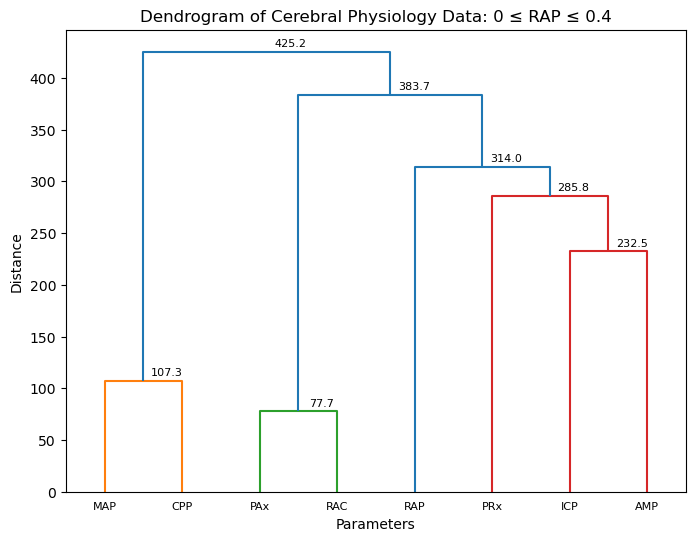

Cophenetic Correlation Coefficient: 0.9


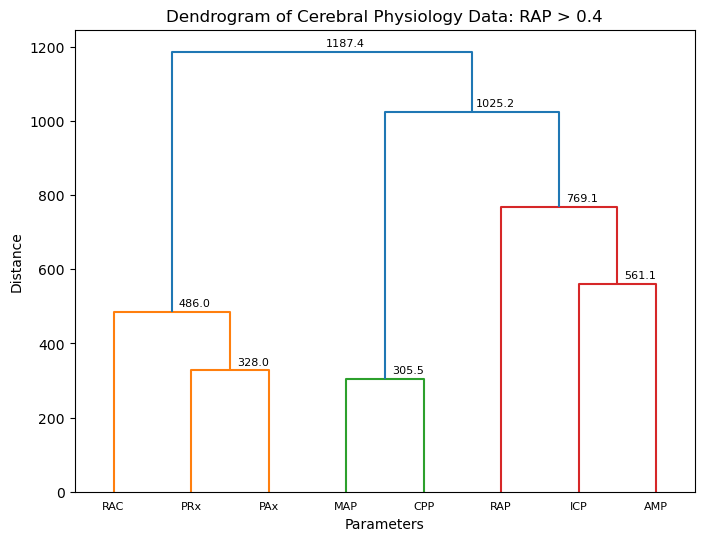

Cophenetic Correlation Coefficient: 0.89


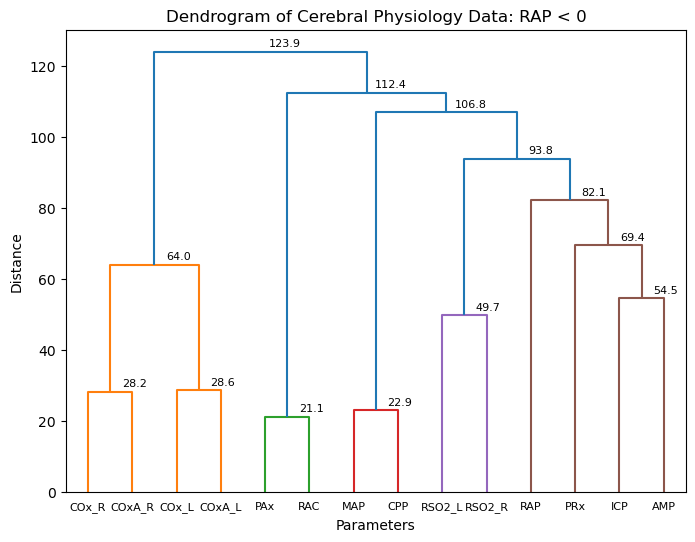

Cophenetic Correlation Coefficient: 0.86


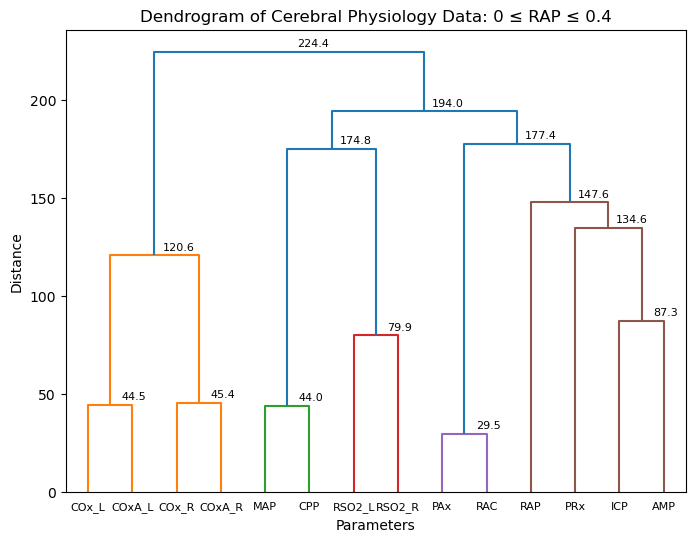

Cophenetic Correlation Coefficient: 0.88


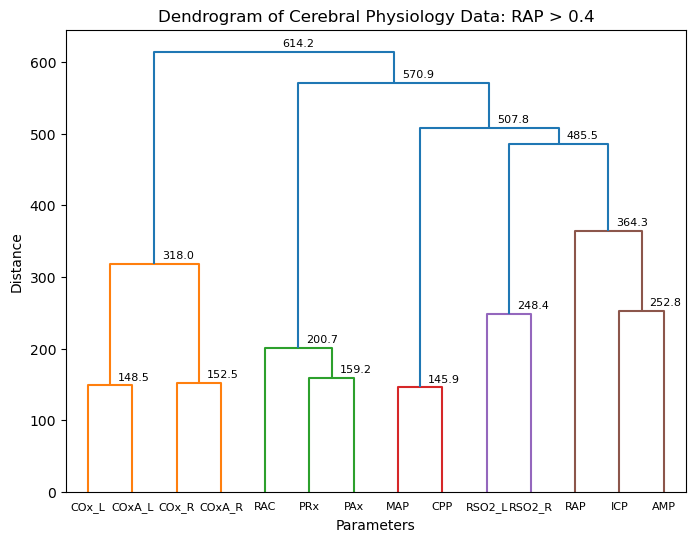

Cophenetic Correlation Coefficient: 0.89


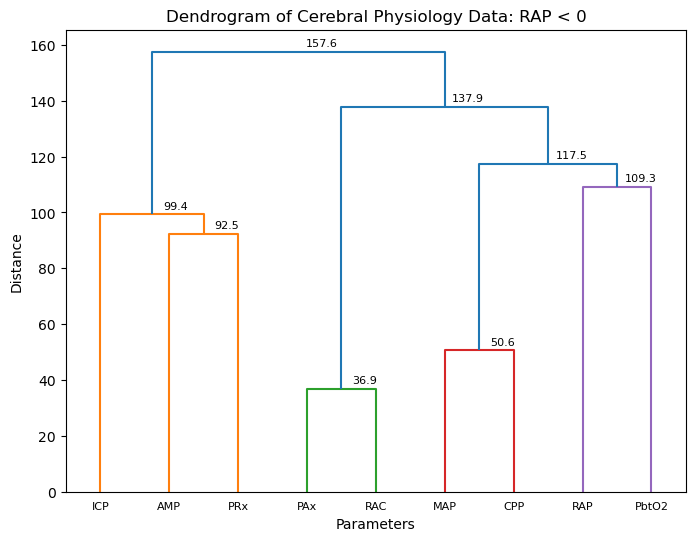

Cophenetic Correlation Coefficient: 0.87


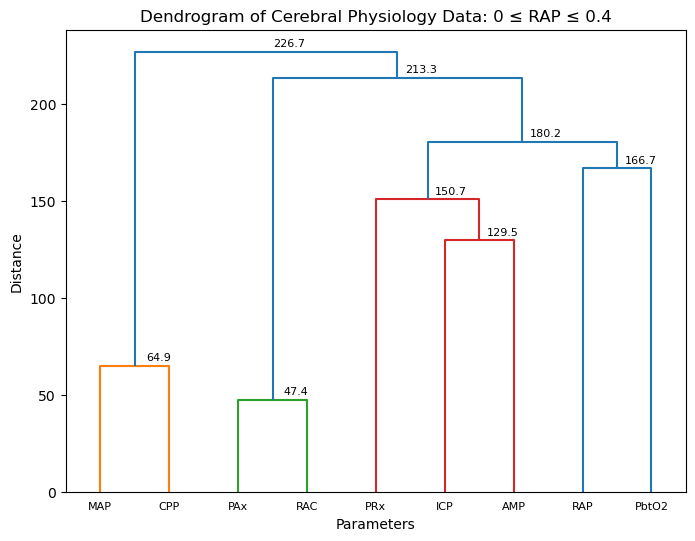

Cophenetic Correlation Coefficient: 0.84


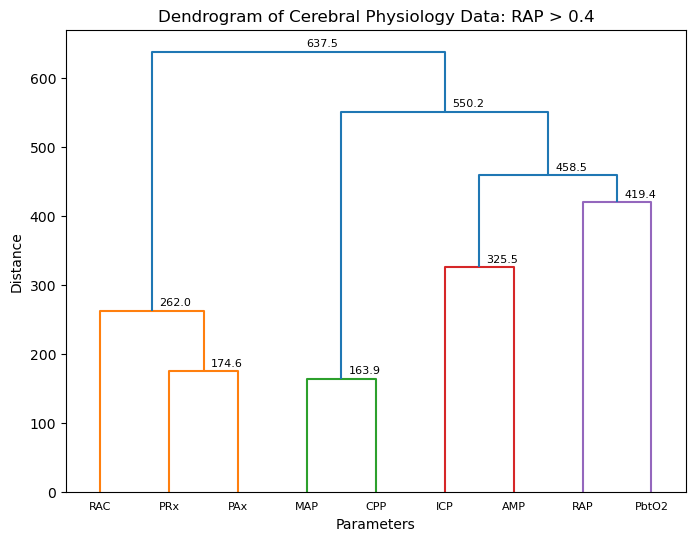

Cophenetic Correlation Coefficient: 0.84
Resolution in progress:  10T


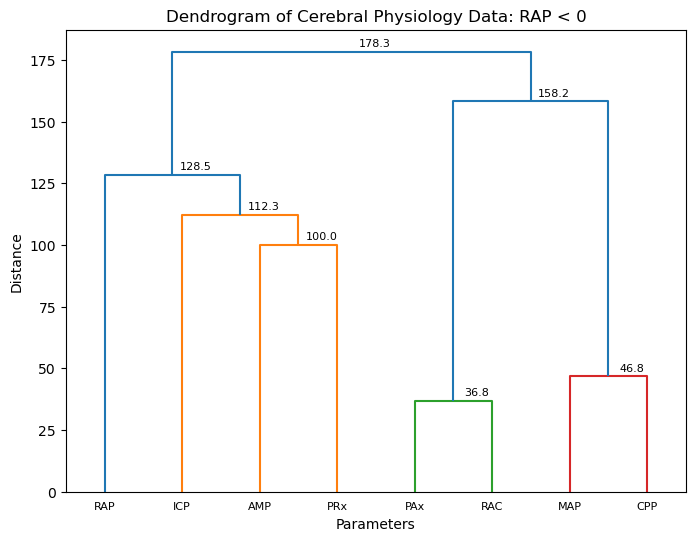

Cophenetic Correlation Coefficient: 0.87


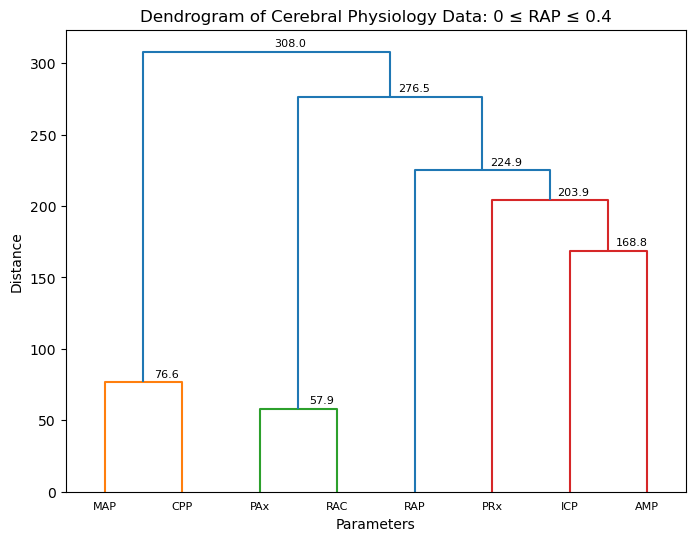

Cophenetic Correlation Coefficient: 0.9


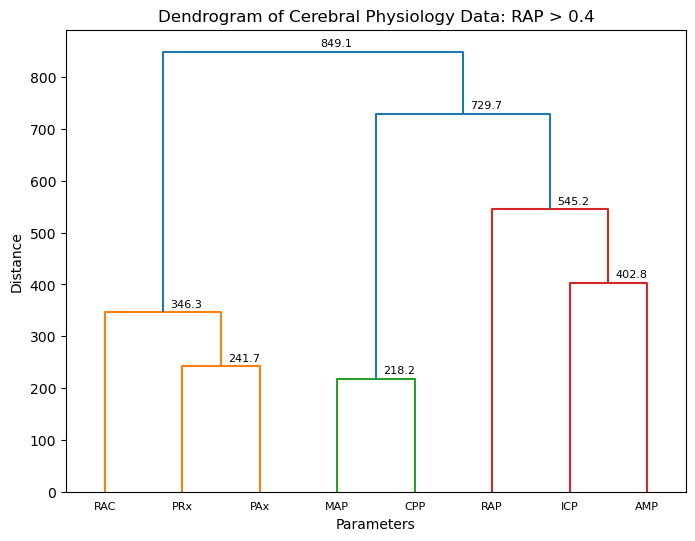

Cophenetic Correlation Coefficient: 0.89


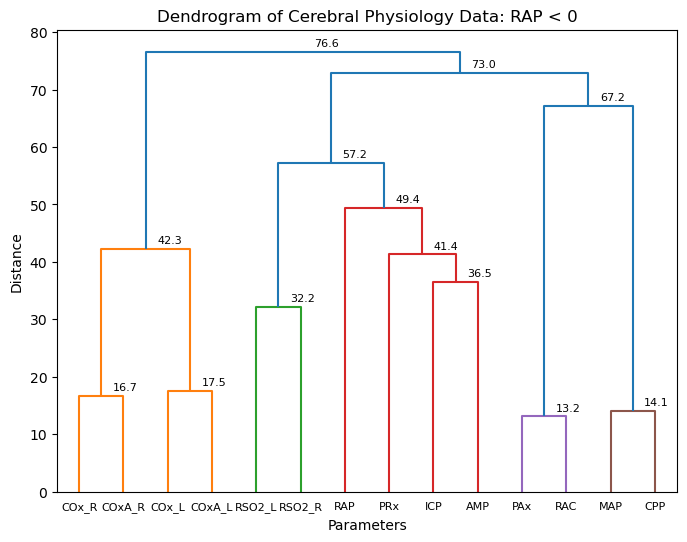

Cophenetic Correlation Coefficient: 0.87


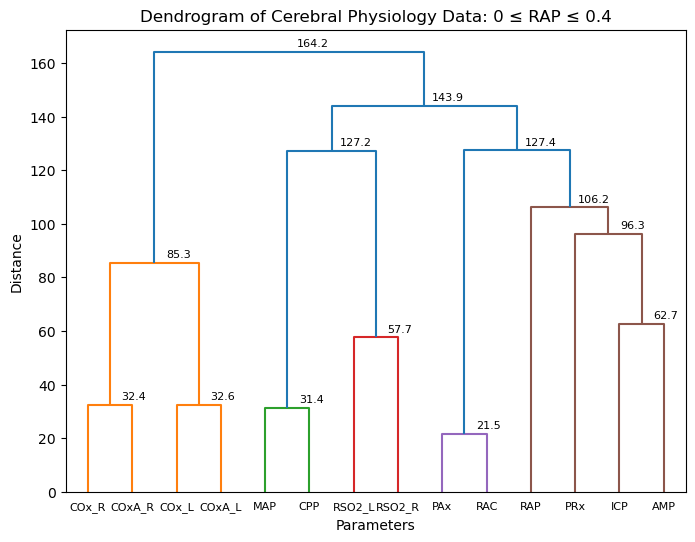

Cophenetic Correlation Coefficient: 0.88


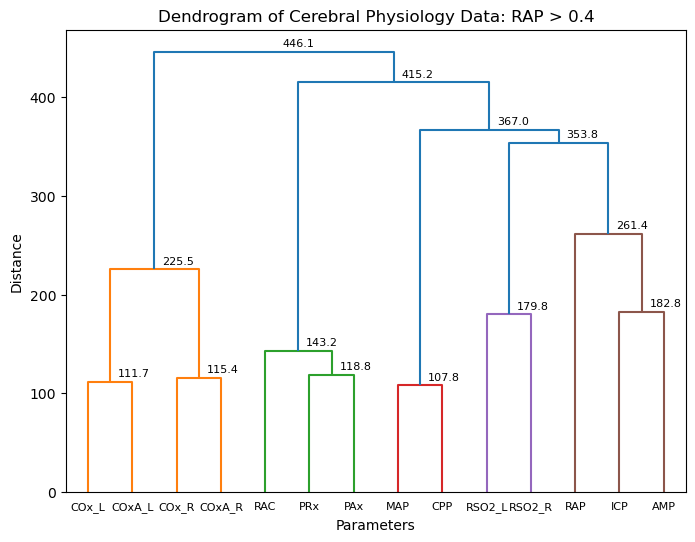

Cophenetic Correlation Coefficient: 0.89


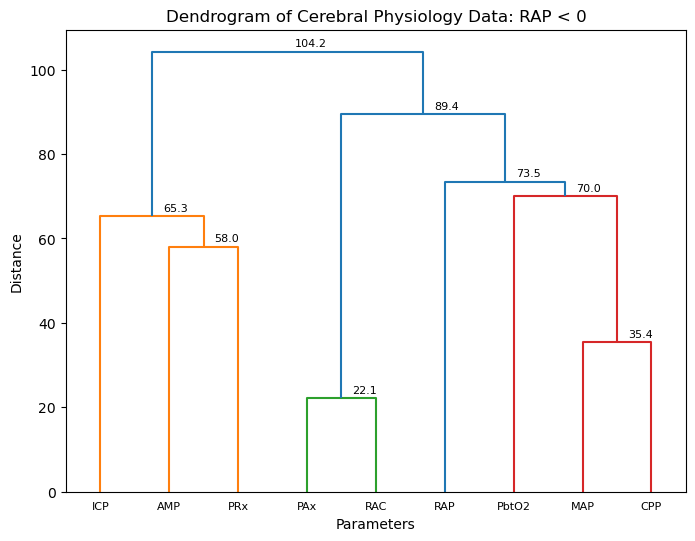

Cophenetic Correlation Coefficient: 0.86


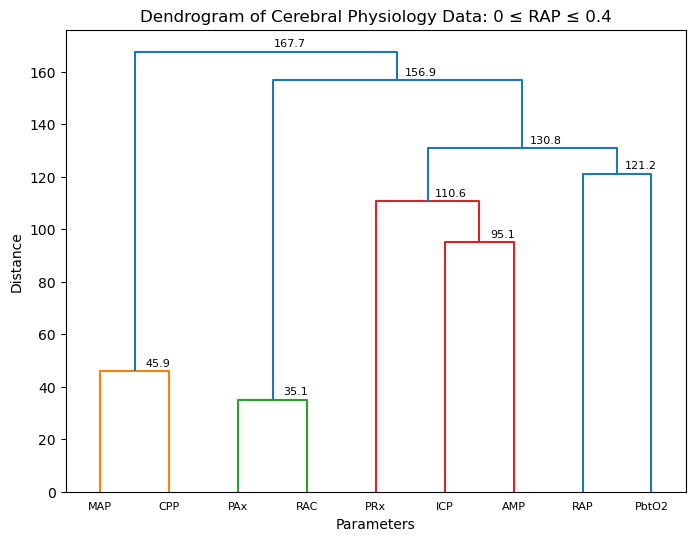

Cophenetic Correlation Coefficient: 0.84


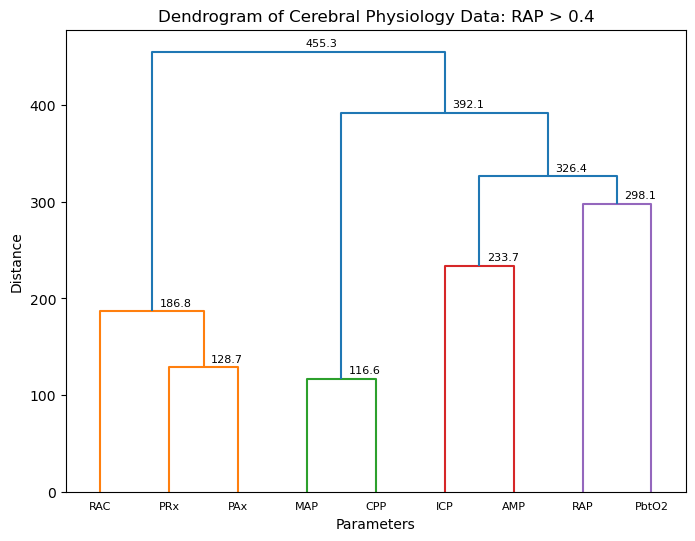

Cophenetic Correlation Coefficient: 0.83
Resolution in progress:  30T


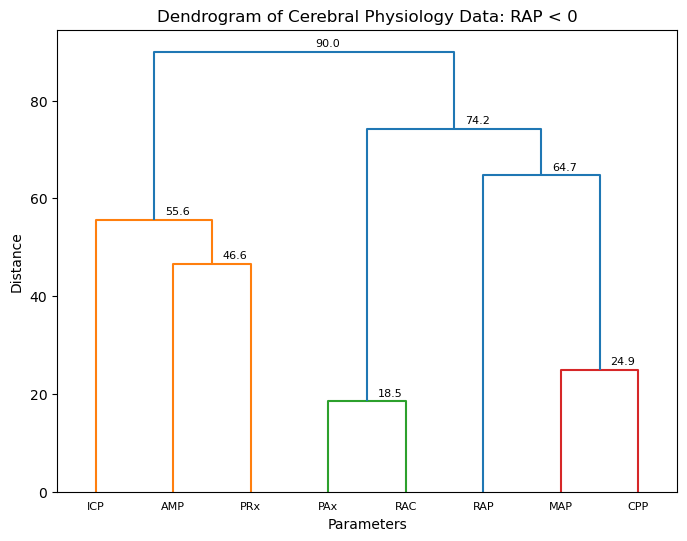

Cophenetic Correlation Coefficient: 0.91


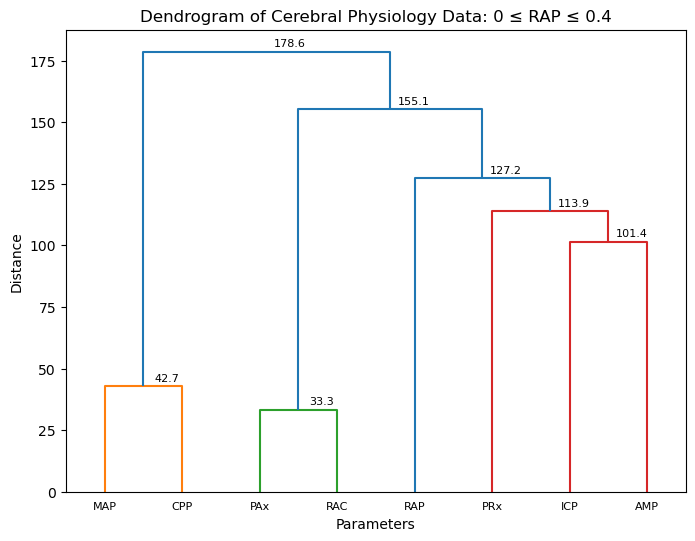

Cophenetic Correlation Coefficient: 0.89


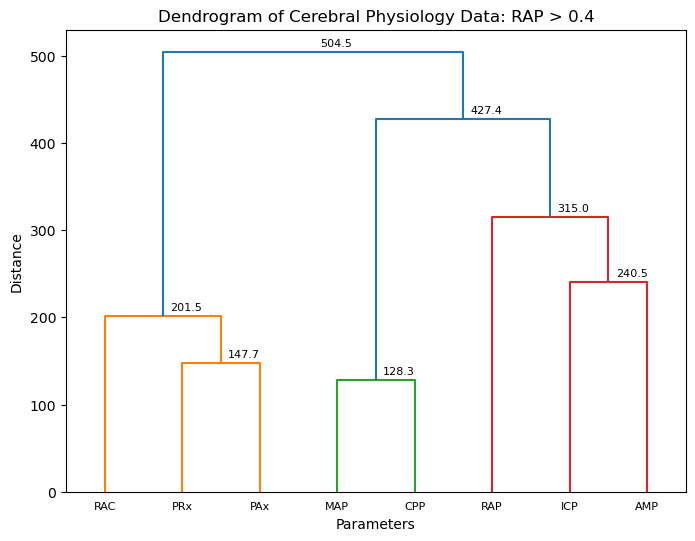

Cophenetic Correlation Coefficient: 0.88


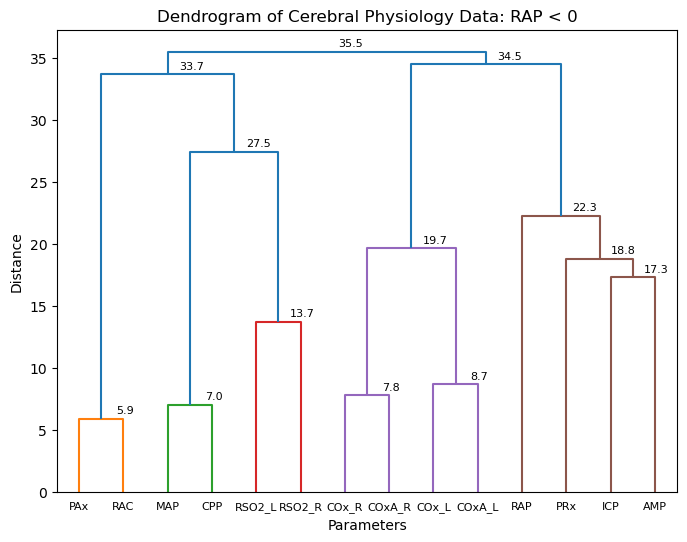

Cophenetic Correlation Coefficient: 0.89


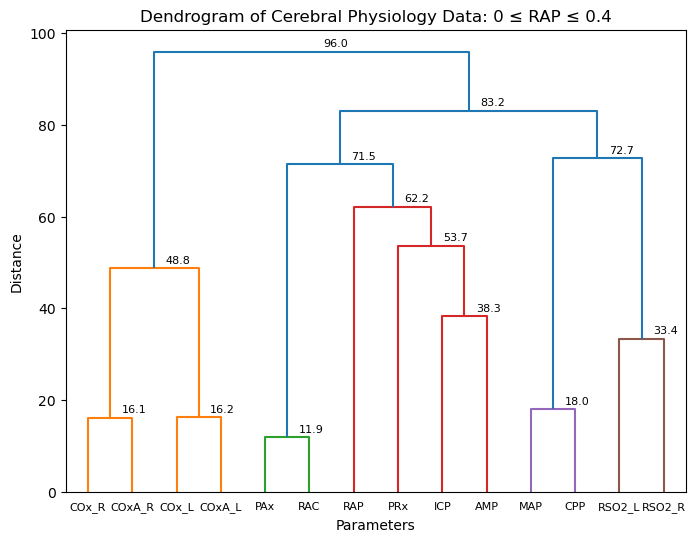

Cophenetic Correlation Coefficient: 0.88


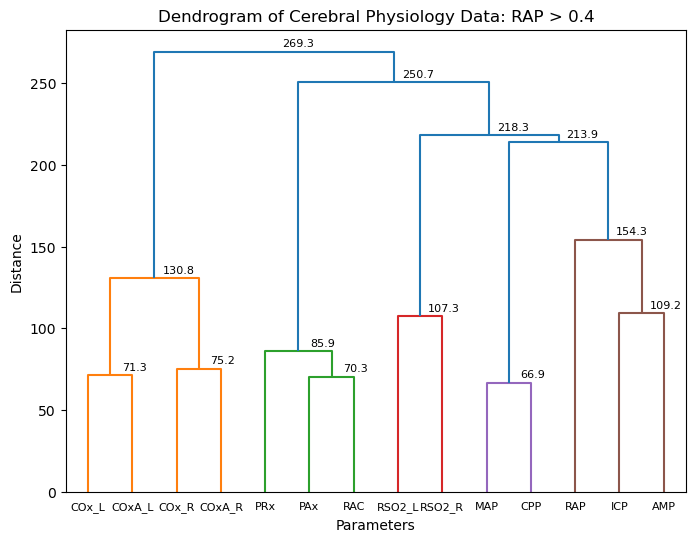

Cophenetic Correlation Coefficient: 0.88


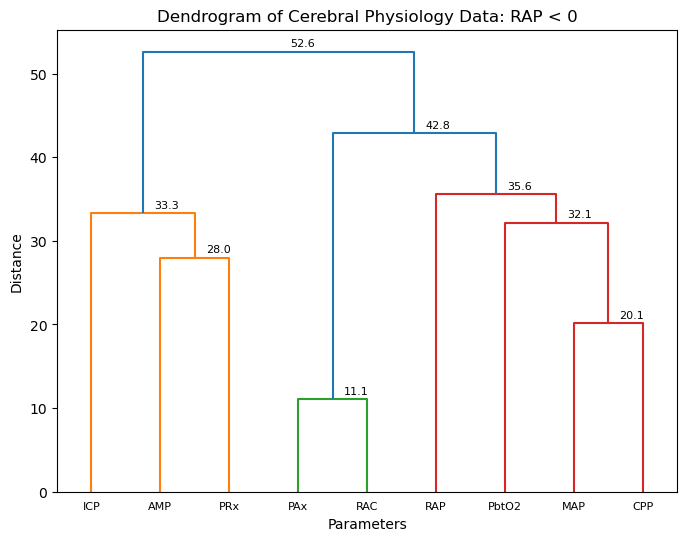

Cophenetic Correlation Coefficient: 0.85


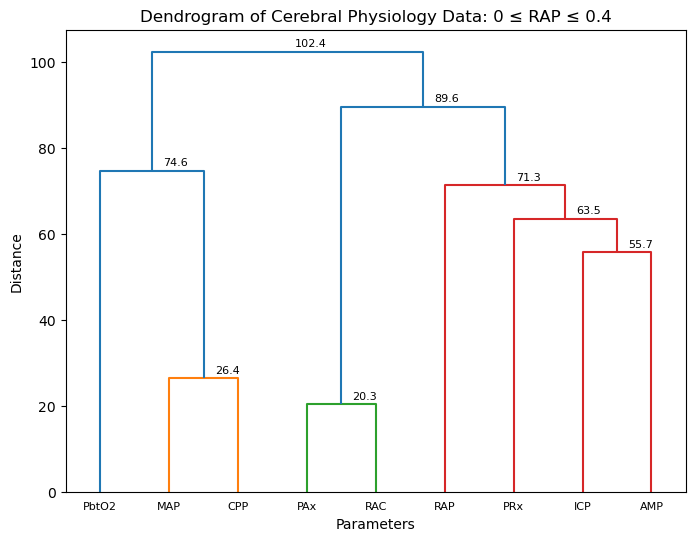

Cophenetic Correlation Coefficient: 0.87


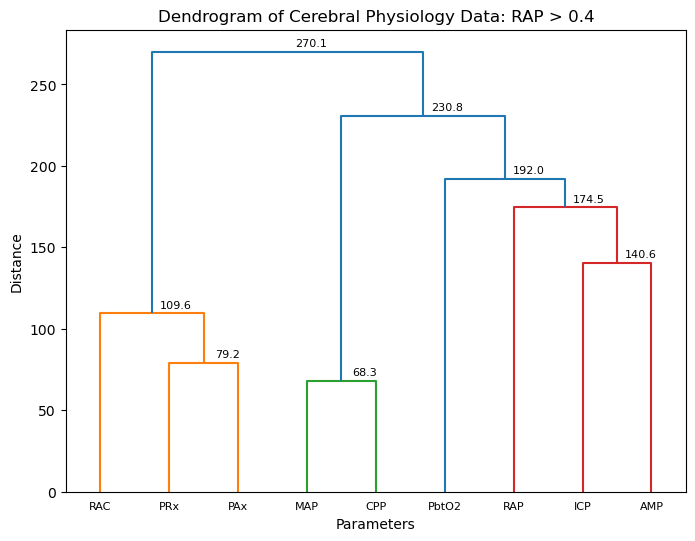

Cophenetic Correlation Coefficient: 0.82
Resolution in progress:  H


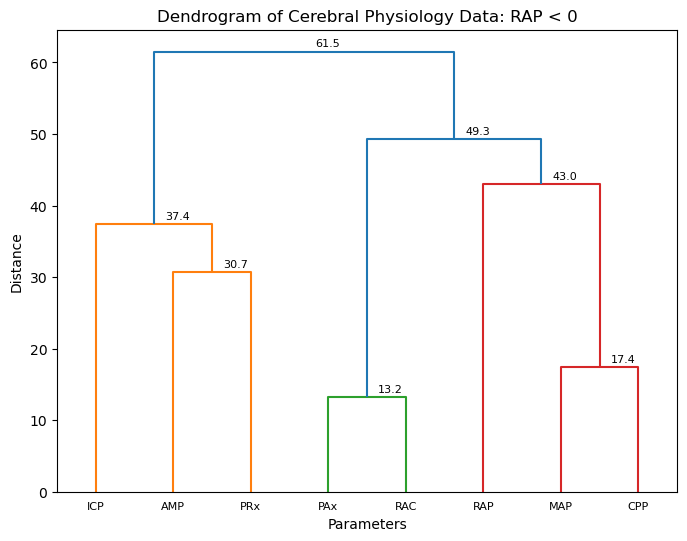

Cophenetic Correlation Coefficient: 0.91


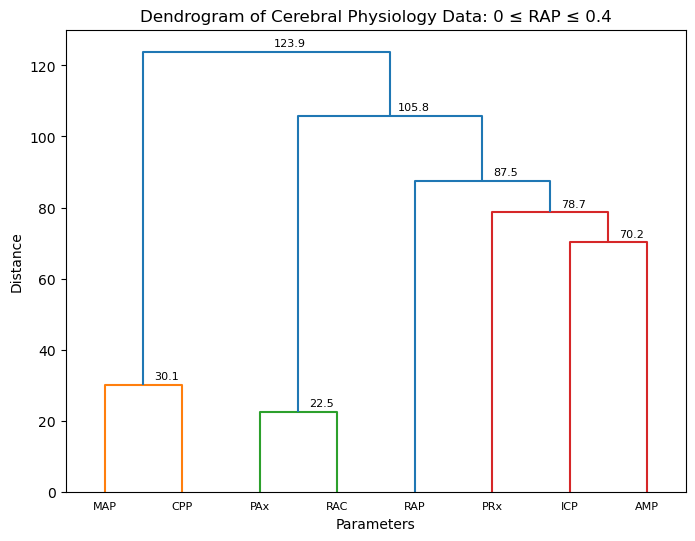

Cophenetic Correlation Coefficient: 0.88


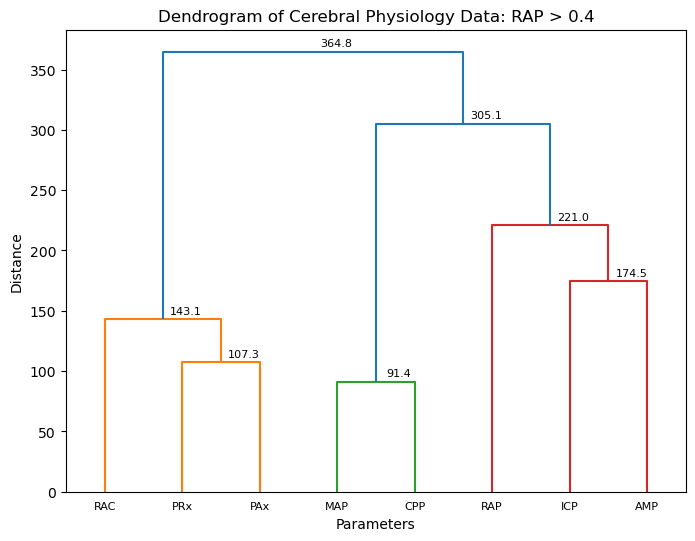

Cophenetic Correlation Coefficient: 0.88


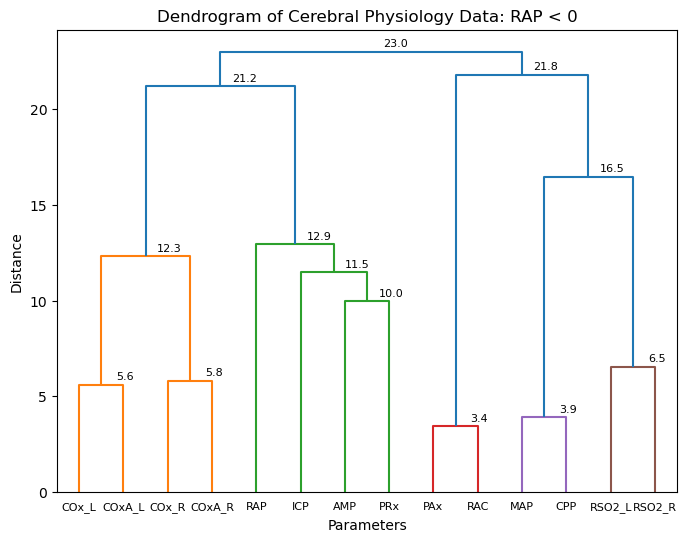

Cophenetic Correlation Coefficient: 0.86


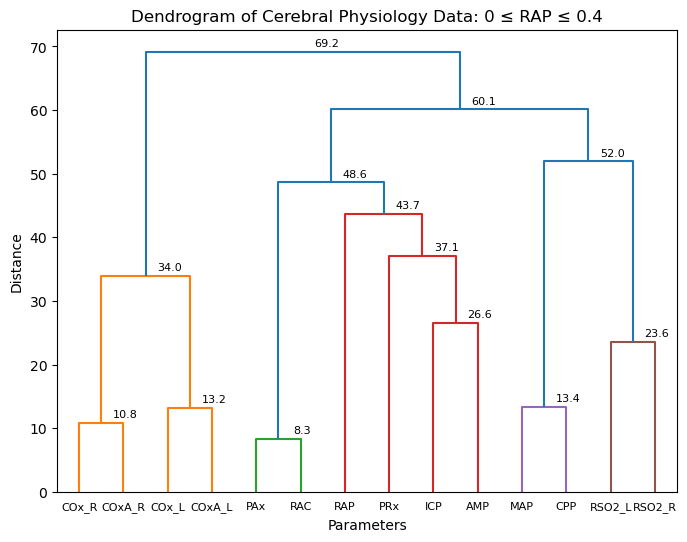

Cophenetic Correlation Coefficient: 0.88


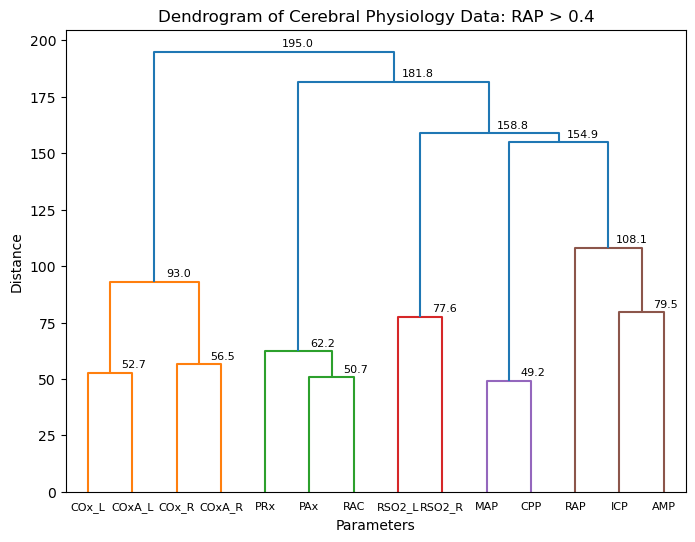

Cophenetic Correlation Coefficient: 0.88


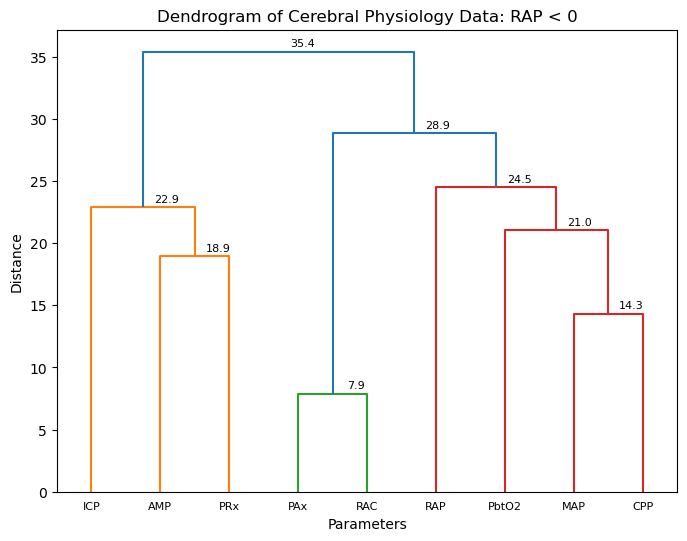

Cophenetic Correlation Coefficient: 0.83


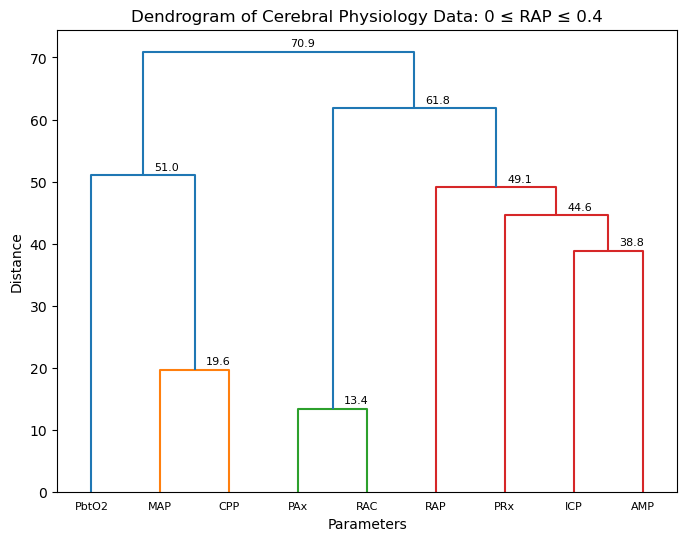

Cophenetic Correlation Coefficient: 0.85


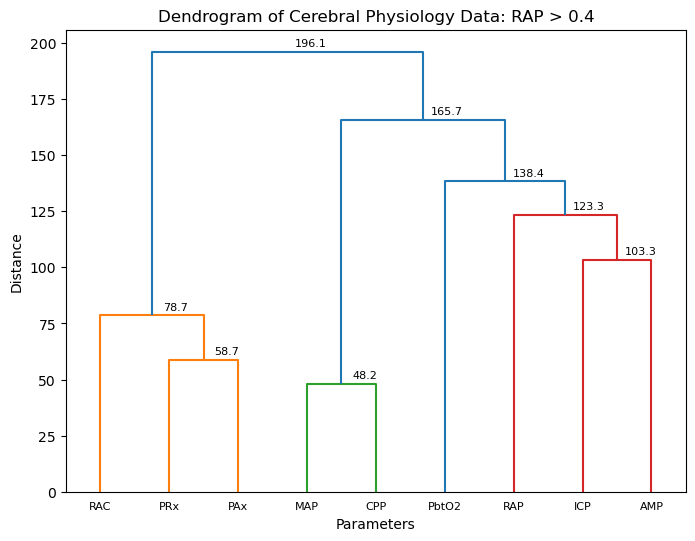

Cophenetic Correlation Coefficient: 0.82
Execution time:  97.45320200000424 seconds


In [199]:
tic = timer()

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']


for resolution_index, resolution in enumerate(resolutions):
    print("Resolution in progress: ", resolution)
    df_cophenetic_corr = pd.DataFrame(index=range(len(labels)), columns=file_labels)
    
    for index, file_segment in enumerate(df_all):

        if resolution == 'M':
                pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)

        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Splitting data into three segments
        breakpoints = [0, 0.4]

        segment1 = file_segment_edited[file_segment_edited['RAP'] < breakpoints[0]]
        segment2 = file_segment_edited[(file_segment_edited['RAP'] >= breakpoints[0]) & (file_segment_edited['RAP'] <= breakpoints[1])]
        segment3 = file_segment_edited[file_segment_edited['RAP'] > breakpoints[1]]

        segments = [segment1, segment2, segment3]

        for segment_no, segment in enumerate(segments):
            cophenetic_corr = visualizing_dendogram_using_AHC(segment, segment_no, resolution, file_labels[index], labels)
            df_cophenetic_corr.at[segment_no, file_labels[index]] = round(cophenetic_corr, 2)

    df_cophenetic_corr.index = labels
    save_csv_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\AHC\Sub_group\Cophenetic_corr"
    save_csv_file_name = resolution + '_cophenetic_corr.csv'
    df_cophenetic_corr.to_csv(os.path.join(save_csv_directory, save_csv_file_name))
    
tac = timer()
print("Execution time: ",tac-tic, "seconds")

In [196]:
df_cophenetic_corr

,ICP_ABP_measures,NIRS_measures,PbtO2_measures
RAP < 0,0.91,0.86,0.83
0 ≤ RAP ≤ 0.4,0.88,0.88,0.85
RAP > 0.4,0.88,0.88,0.82


# Principal Component Analysis

### Scree plots

Explained Variance Ratio: [3.06536288e-01 2.35204258e-01 2.07628201e-01 1.18896350e-01
 6.04733959e-02 5.57871194e-02 1.54551772e-02 1.92100532e-05]
Cumulative Explained Variance: [0.30653629 0.54174055 0.74936875 0.8682651  0.92873849 0.98452561
 0.99998079 1.        ]


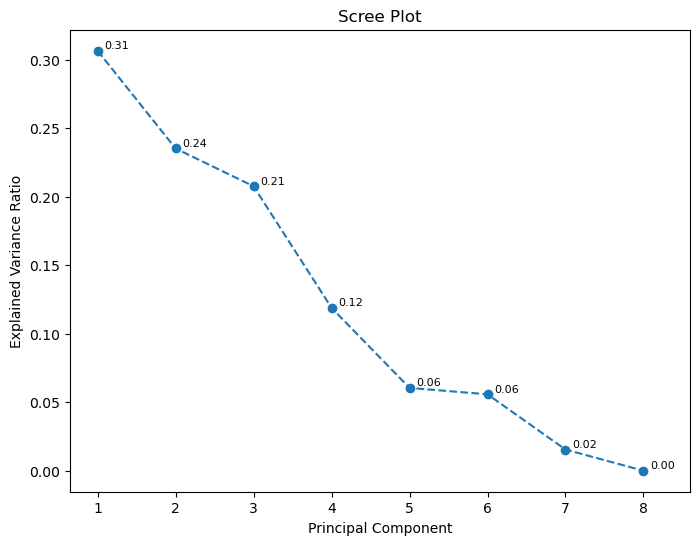

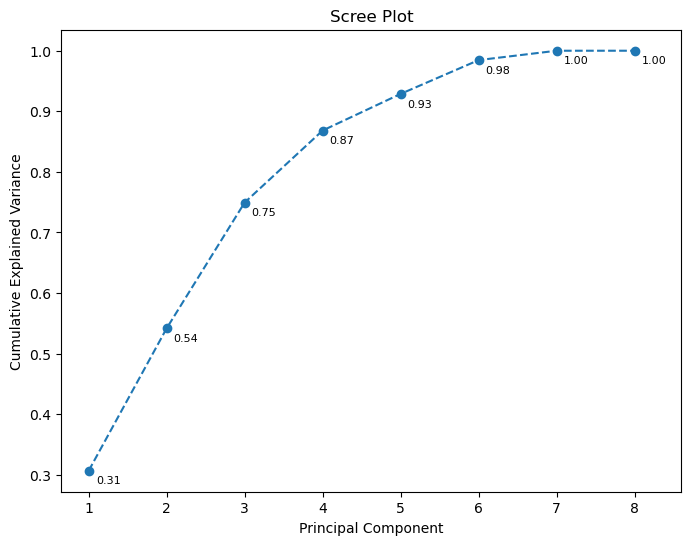

Explained Variance Ratio: [2.22554554e-01 1.66532743e-01 1.37250468e-01 1.30698732e-01
 1.16276763e-01 6.20612071e-02 5.07251071e-02 3.27750905e-02
 3.15883442e-02 2.33668743e-02 1.55850587e-02 6.61673310e-03
 3.95520610e-03 1.31183512e-05]
Cumulative Explained Variance: [0.22255455 0.3890873  0.52633777 0.6570365  0.77331326 0.83537447
 0.88609957 0.91887467 0.95046301 0.97382988 0.98941494 0.99603168
 0.99998688 1.        ]


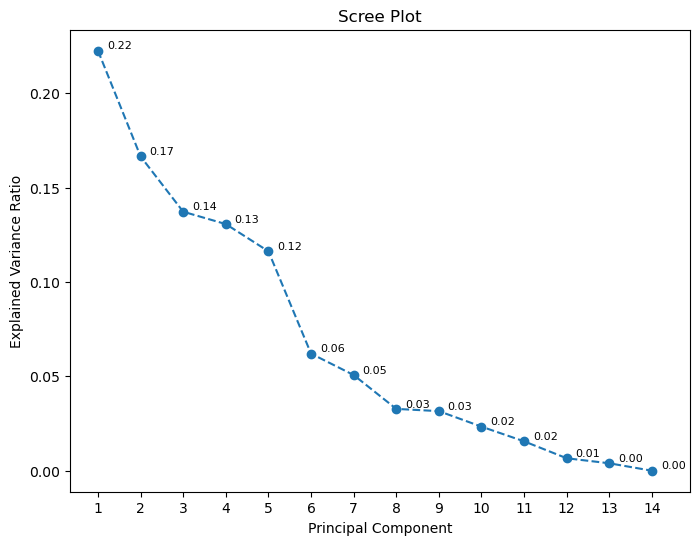

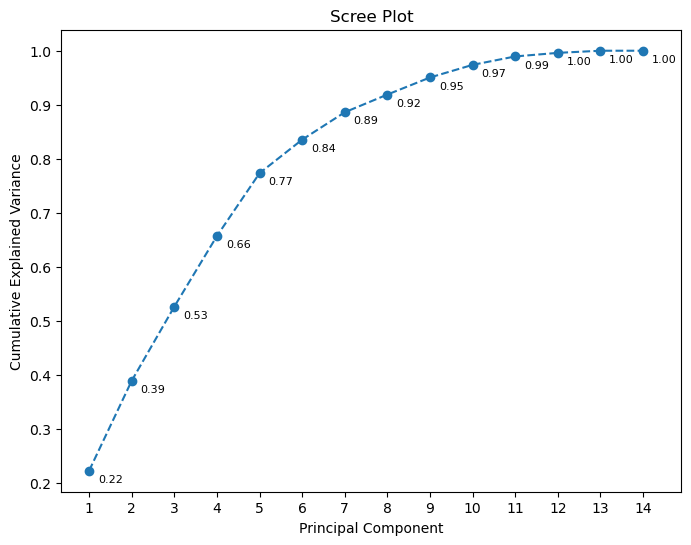

Explained Variance Ratio: [3.01409331e-01 2.09640276e-01 1.57657158e-01 1.15526321e-01
 1.03189369e-01 5.35159902e-02 4.54685931e-02 1.35825889e-02
 1.03717037e-05]
Cumulative Explained Variance: [0.30140933 0.51104961 0.66870677 0.78423309 0.88742246 0.94093845
 0.98640704 0.99998963 1.        ]


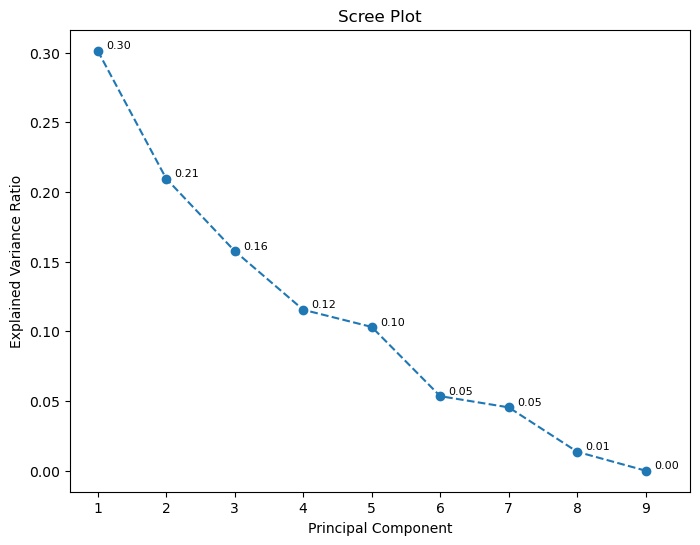

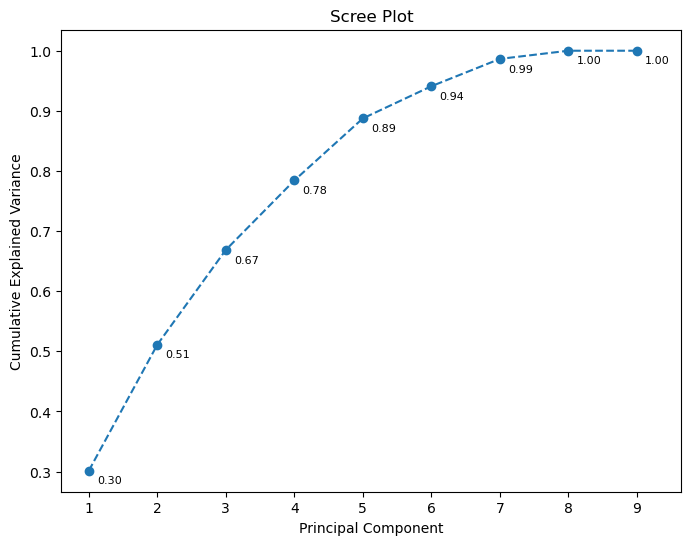

Explained Variance Ratio: [0.29790772 0.23247569 0.22363533 0.11068621 0.06384842 0.05514489
 0.01512761 0.00117413]
Cumulative Explained Variance: [0.29790772 0.5303834  0.75401873 0.86470494 0.92855337 0.98369826
 0.99882587 1.        ]


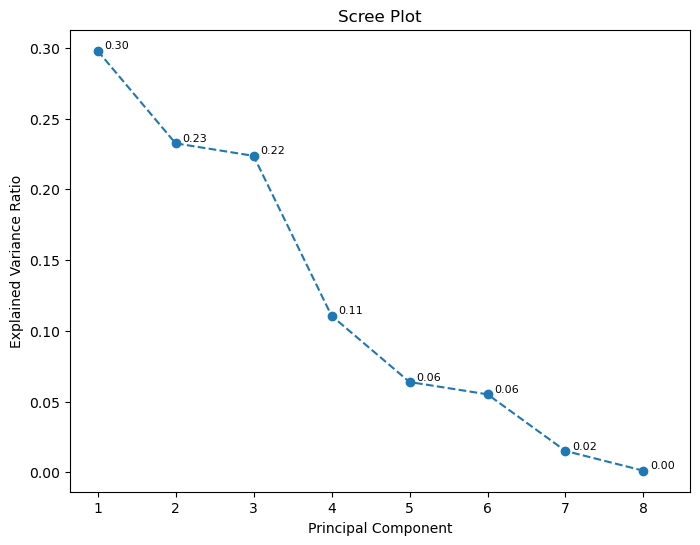

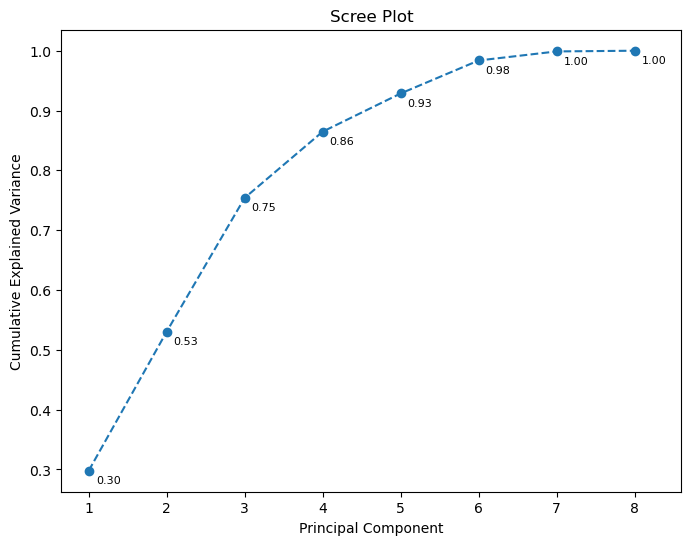

Explained Variance Ratio: [0.22289142 0.17027222 0.13568373 0.13390682 0.10865868 0.05991742
 0.05071121 0.03338933 0.03121782 0.02598318 0.01638698 0.00603944
 0.00422354 0.0007182 ]
Cumulative Explained Variance: [0.22289142 0.39316365 0.52884738 0.6627542  0.77141287 0.83133029
 0.8820415  0.91543084 0.94664865 0.97263184 0.98901882 0.99505826
 0.9992818  1.        ]


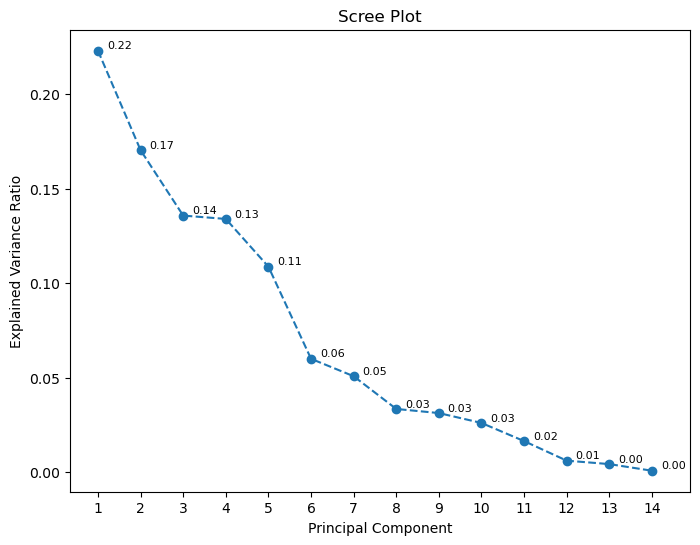

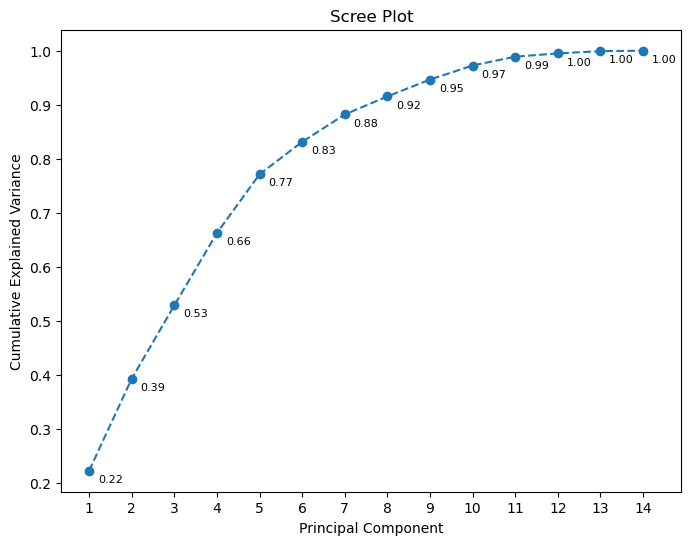

Explained Variance Ratio: [0.26688948 0.21503309 0.17512042 0.11506636 0.10907553 0.05867527
 0.04608765 0.01352488 0.00052732]
Cumulative Explained Variance: [0.26688948 0.48192257 0.65704299 0.77210935 0.88118488 0.93986015
 0.9859478  0.99947268 1.        ]


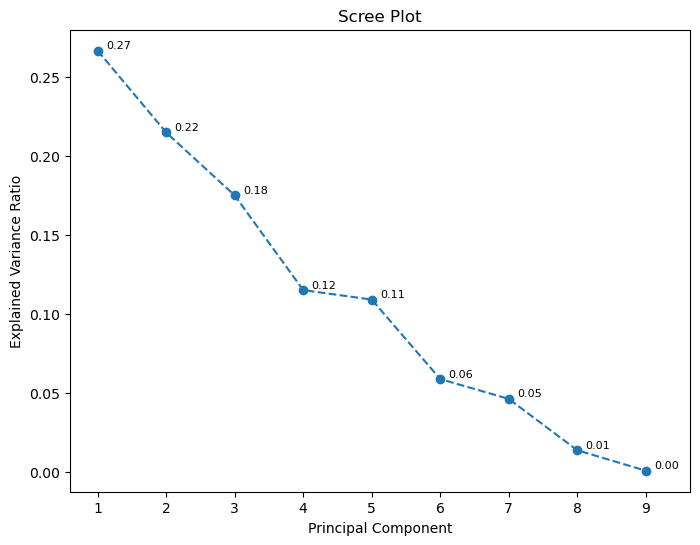

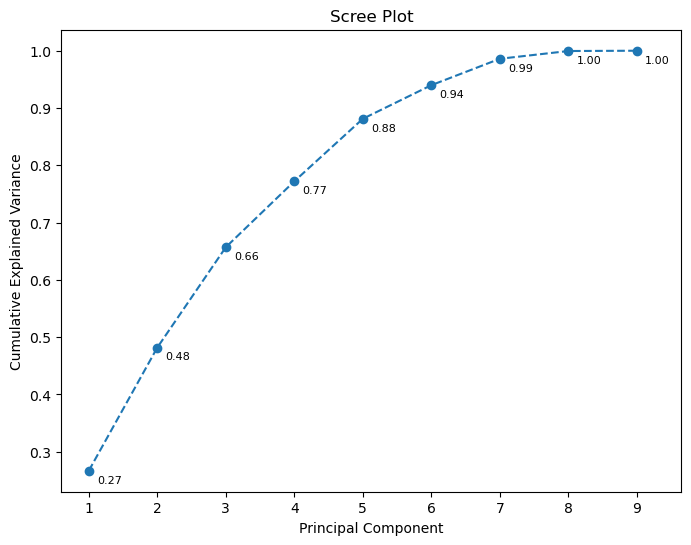

Explained Variance Ratio: [0.30158932 0.23167104 0.22694195 0.10760482 0.06345221 0.05280446
 0.01475181 0.00118438]
Cumulative Explained Variance: [0.30158932 0.53326036 0.76020232 0.86780714 0.93125934 0.9840638
 0.99881562 1.        ]


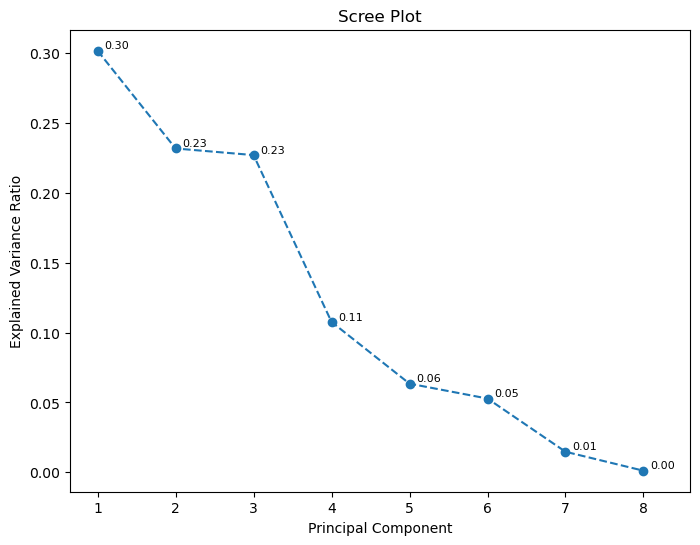

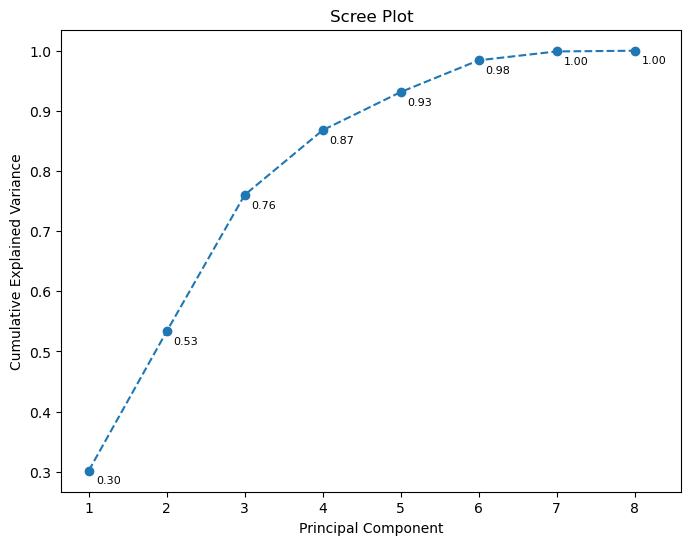

Explained Variance Ratio: [0.22545553 0.17119496 0.1371579  0.13389011 0.10864486 0.05784454
 0.04882553 0.03306625 0.03086138 0.02504237 0.01717312 0.00578051
 0.00432893 0.00073401]
Cumulative Explained Variance: [0.22545553 0.39665048 0.53380838 0.66769849 0.77634335 0.83418789
 0.88301342 0.91607967 0.94694106 0.97198342 0.98915655 0.99493706
 0.99926599 1.        ]


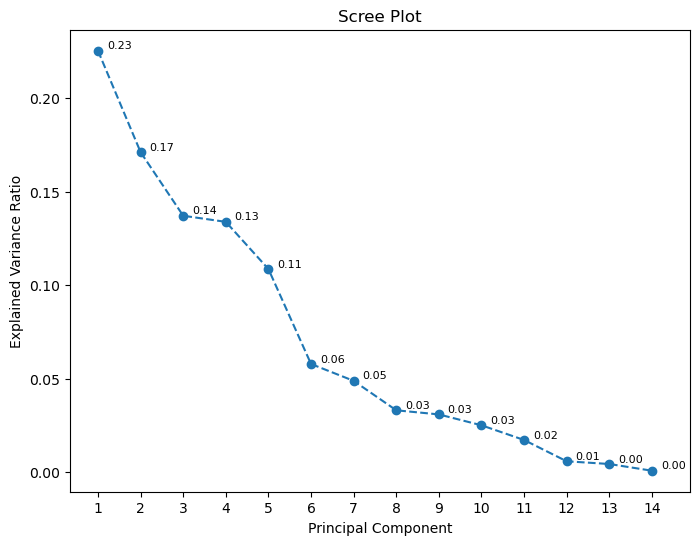

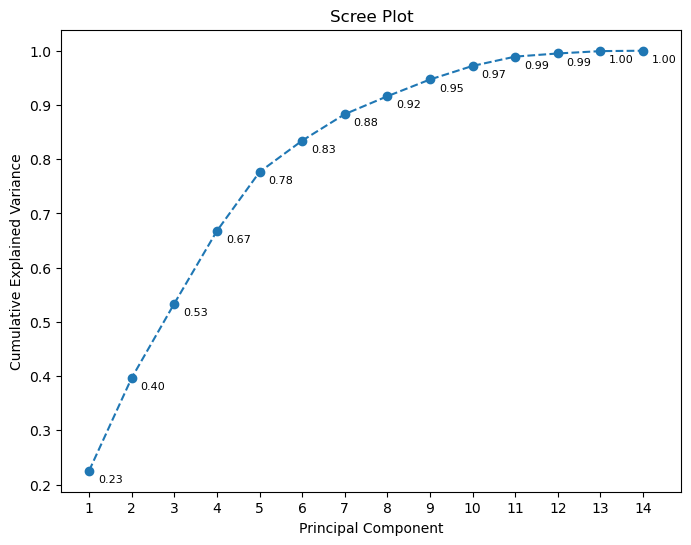

Explained Variance Ratio: [0.27046957 0.21445557 0.17706375 0.1145706  0.10867833 0.05747889
 0.04362534 0.01314309 0.00051485]
Cumulative Explained Variance: [0.27046957 0.48492514 0.66198889 0.7765595  0.88523783 0.94271672
 0.98634206 0.99948515 1.        ]


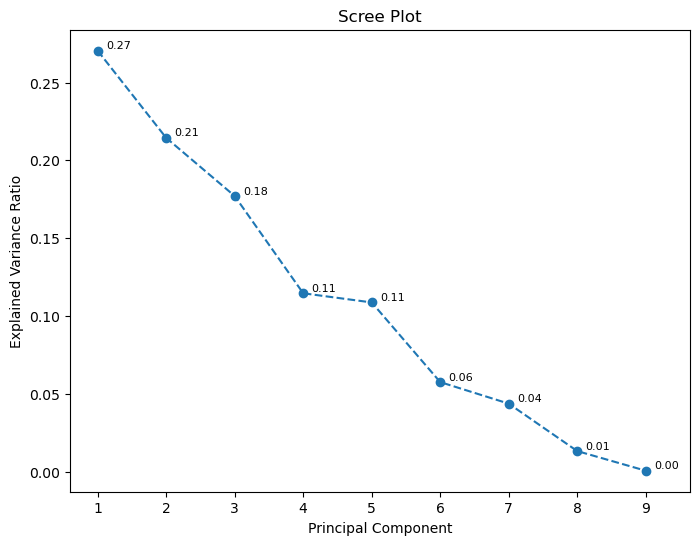

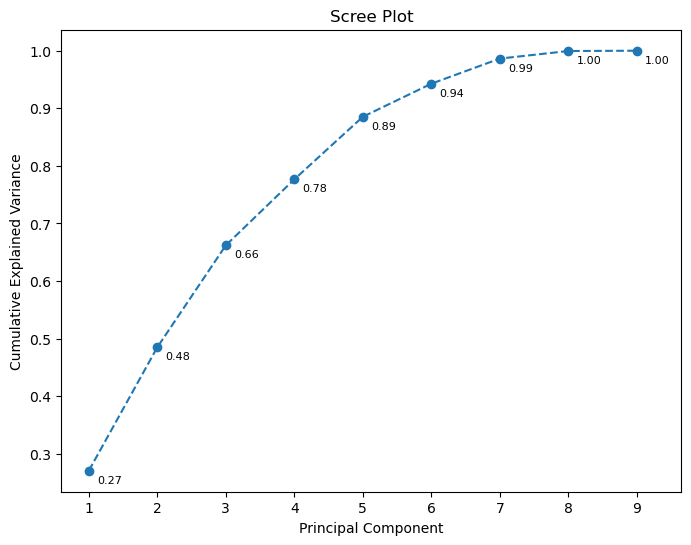

Explained Variance Ratio: [0.30897616 0.23189351 0.228387   0.10305584 0.06308283 0.04929698
 0.01405622 0.00125146]
Cumulative Explained Variance: [0.30897616 0.54086967 0.76925667 0.8723125  0.93539534 0.98469232
 0.99874854 1.        ]


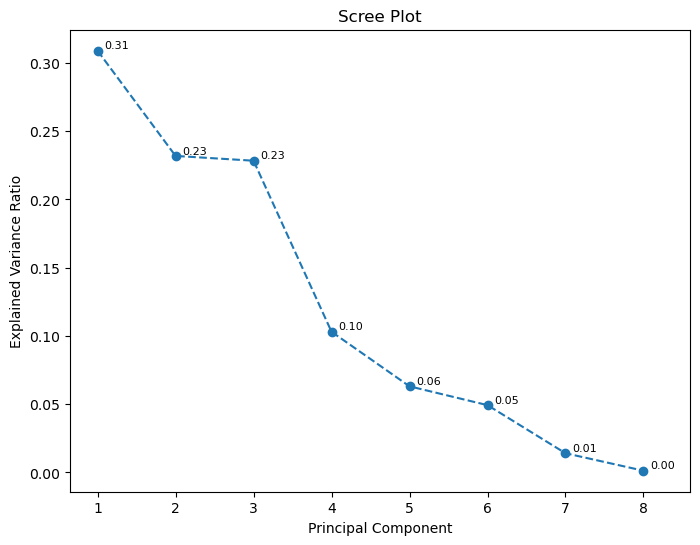

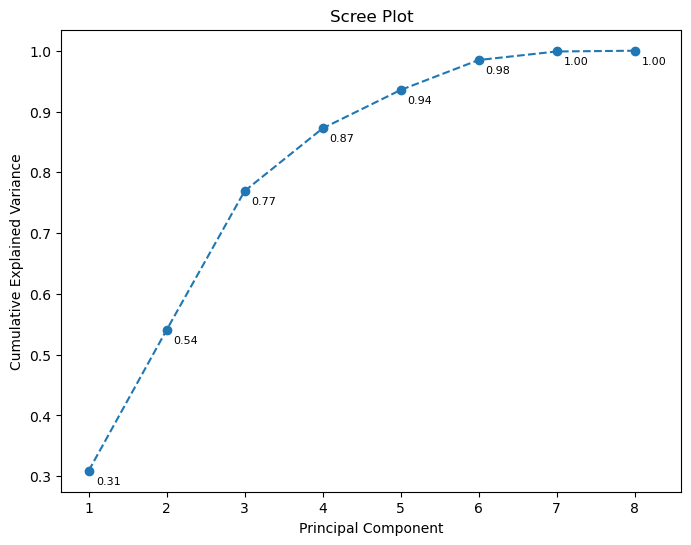

Explained Variance Ratio: [0.22957165 0.17411288 0.14161025 0.13081415 0.10787581 0.05461078
 0.04615343 0.03264999 0.03028744 0.02329667 0.0183817  0.00529644
 0.00450636 0.00083244]
Cumulative Explained Variance: [0.22957165 0.40368453 0.54529478 0.67610893 0.78398474 0.83859553
 0.88474896 0.91739895 0.94768639 0.97098306 0.98936476 0.9946612
 0.99916756 1.        ]


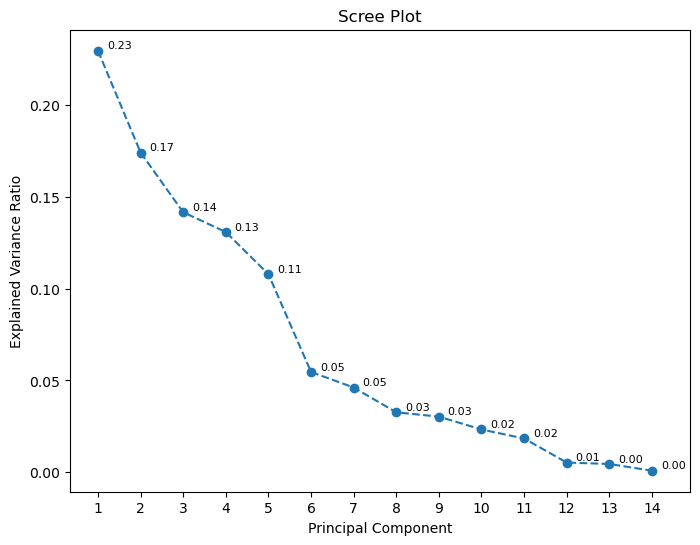

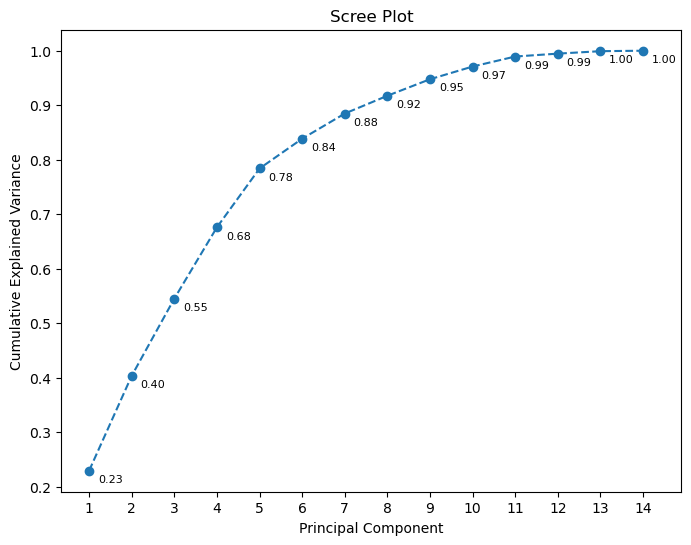

Explained Variance Ratio: [0.27655565 0.21134988 0.17996337 0.11461931 0.10823065 0.05589071
 0.04030135 0.01241875 0.00067034]
Cumulative Explained Variance: [0.27655565 0.48790553 0.6678689  0.78248821 0.89071886 0.94660957
 0.98691091 0.99932966 1.        ]


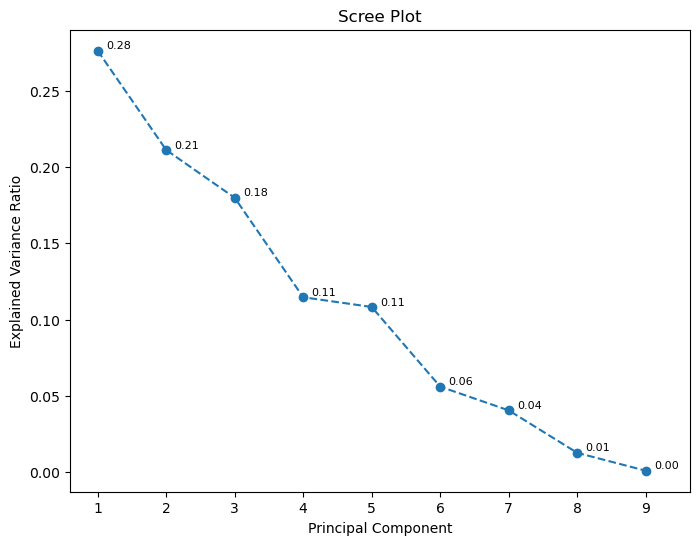

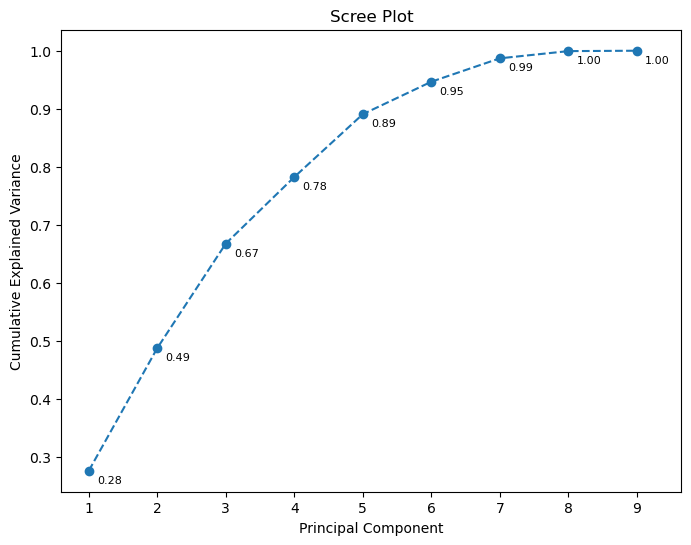

Explained Variance Ratio: [0.31361867 0.23427303 0.22557618 0.10078387 0.0630369  0.04779926
 0.01359736 0.00131473]
Cumulative Explained Variance: [0.31361867 0.5478917  0.77346788 0.87425174 0.93728865 0.9850879
 0.99868527 1.        ]


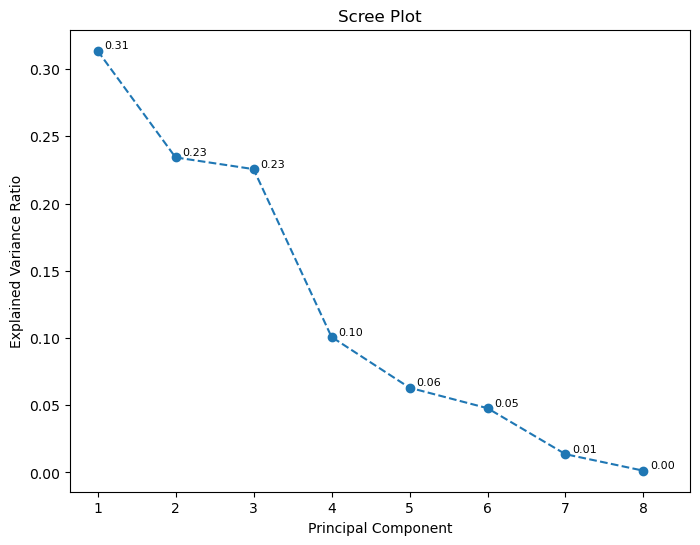

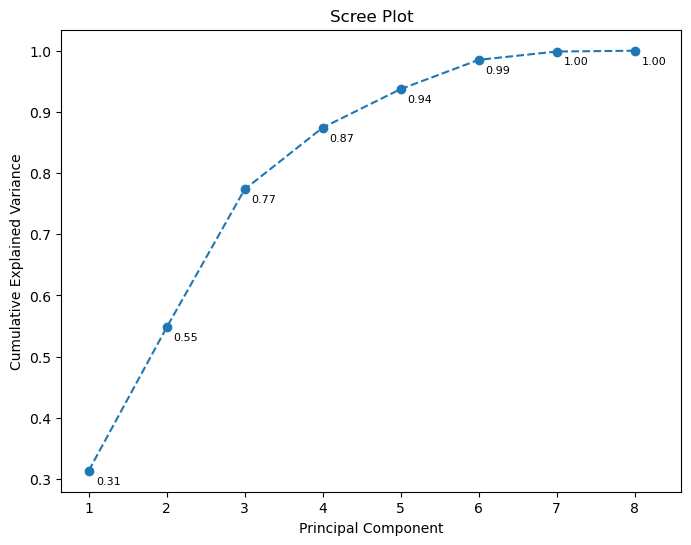

Explained Variance Ratio: [0.23082492 0.17614171 0.14335148 0.12935482 0.10706125 0.05340788
 0.04482772 0.03240879 0.03029104 0.02299542 0.01869133 0.00517948
 0.00447906 0.0009851 ]
Cumulative Explained Variance: [0.23082492 0.40696663 0.5503181  0.67967293 0.78673418 0.84014206
 0.88496978 0.91737856 0.94766961 0.97066503 0.98935635 0.99453583
 0.9990149  1.        ]


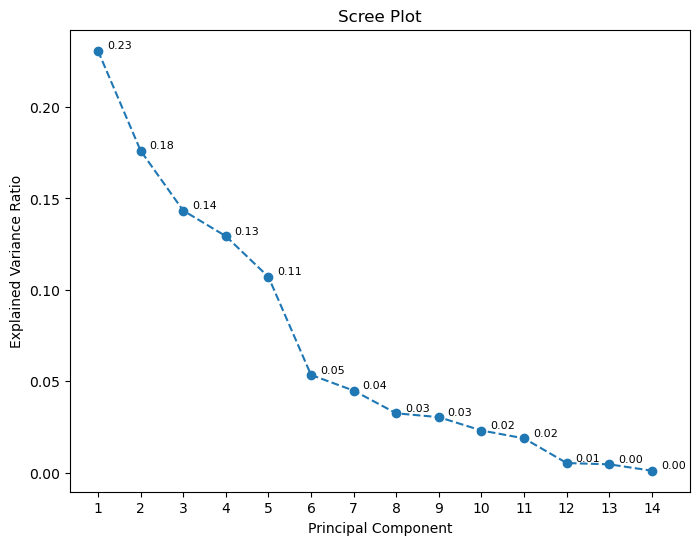

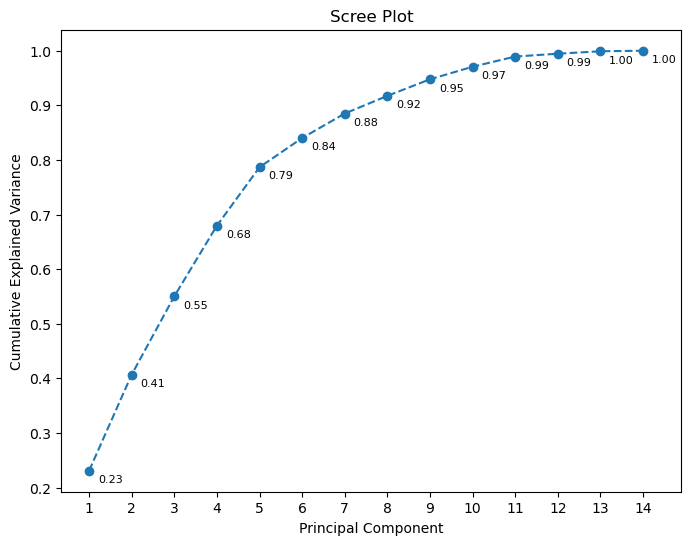

Explained Variance Ratio: [0.28010217 0.20968386 0.180518   0.11445526 0.10821654 0.05546956
 0.03876438 0.01207418 0.00071602]
Cumulative Explained Variance: [0.28010217 0.48978604 0.67030404 0.7847593  0.89297585 0.94844541
 0.9872098  0.99928398 1.        ]


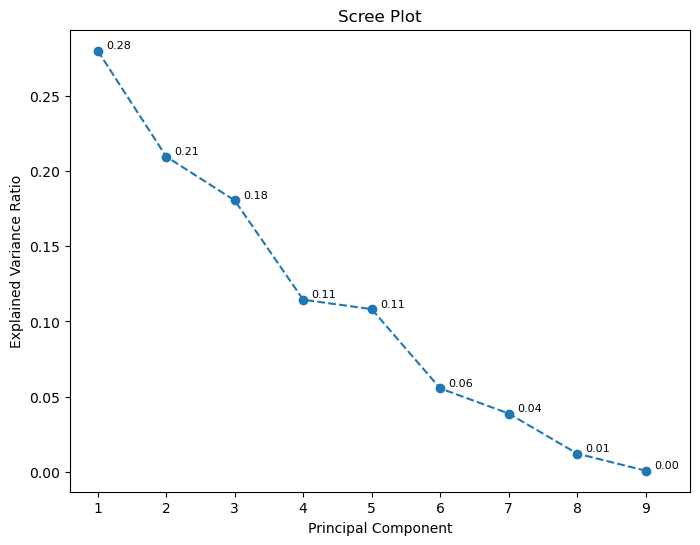

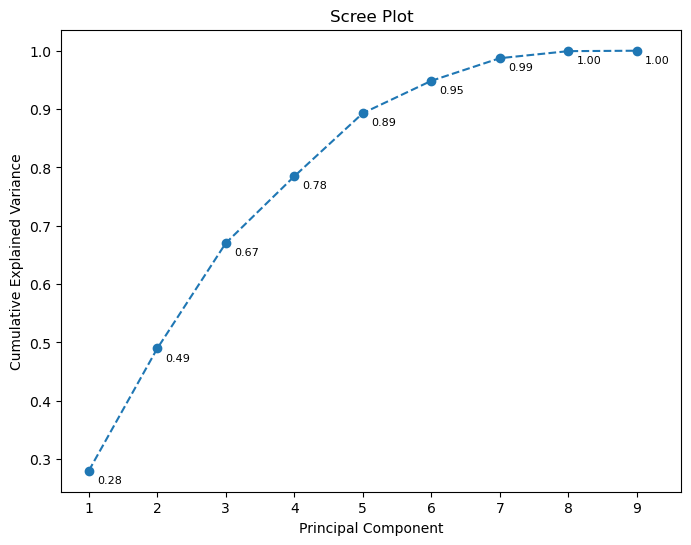

Execution time:  122.52551560000029 seconds


In [11]:
tic = timer()

resolutions = ['M', '5T', '10T', '30T', 'H']
column_list = ['File labels', 'One-minute', '5-minute', '10--minute', '30-minute', '1-hour']

file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

x_add_list = [1.25, 1.5, 1.3]

for resolution_index, resolution in enumerate(resolutions):
    
    for index, file_segment in enumerate(df_all):
        
        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)
            
        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        # Scaling the data
        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(file_segment_edited)

        # Applying PCA
        pca = PCA()
        pca.fit(data_scaled)
        pca_components = pca.transform(data_scaled)

        # Calculating explained variance
        explained_variance_ratio = pca.explained_variance_ratio_
        print("Explained Variance Ratio:", explained_variance_ratio)

        cumulative_variance = explained_variance_ratio.cumsum()
        print("Cumulative Explained Variance:", cumulative_variance)

        #Visualizing the scree plot - Explained Variance Ratio
        components = np.arange(1, len(explained_variance_ratio) + 1)

        plt.figure(figsize=(8, 6))
        plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')

        # Add explained variance values at each point
        x_add = x_add_list[index]
        for i, var in enumerate(explained_variance_ratio):
            plt.text(i + x_add, var, f"{var:.2f}", fontsize=8, ha='center', va='bottom', color='black')

        plt.xlabel("Principal Component")
        plt.ylabel("Explained Variance Ratio")
        plt.xticks(ticks=components, labels=components)
        plt.title("Scree Plot")

        x_min, x_max = plt.xlim()
        plt.xlim(x_min, x_max + 0.25)

        save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA"
        save_image_name = resolution + '_Scree_plot_of_' + 'explained_variance_ratio_' + file_labels[index]
        plt.savefig(os.path.join(save_image_directory, save_image_name))

        plt.show()

        #Visualizing the scree plot - Cumulative Explained Variance
        components = np.arange(1, len(cumulative_variance) + 1)

        plt.figure(figsize=(8, 6))
        plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')

        # Add cumulative explained variance values at each point
        for i, var in enumerate(cumulative_variance):
            plt.text(i + x_add, var-0.025, f"{var:.2f}", fontsize=8, ha='center', va='bottom', color='black')

        plt.xlabel("Principal Component")
        plt.ylabel("Cumulative Explained Variance")
        plt.xticks(ticks=components, labels=components)
        plt.title("Scree Plot")

        x_min, x_max = plt.xlim()
        plt.xlim(x_min, x_max + 0.25)

        save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA"
        save_image_name = resolution + '_Scree_plot_of_' + 'cumulative_explained_variance_' + file_labels[index]
        plt.savefig(os.path.join(save_image_directory, save_image_name))

        plt.show()
    
tac = timer()
print("Execution time: ",tac-tic, "seconds")

### PCA biplots

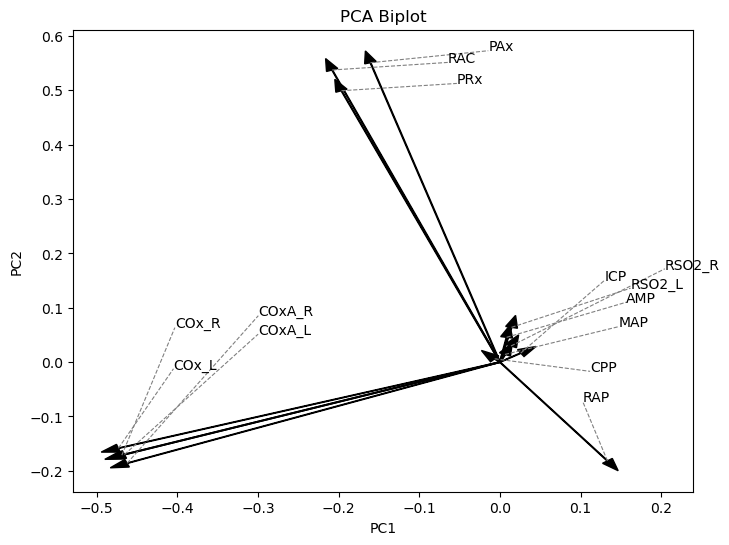

In [32]:
tic = timer()

resolutions = ['M', '5T', '10T', '30T', 'H']
column_list = ['File labels', 'One-minute', '5-minute', '10--minute', '30-minute', '1-hour']

file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

for resolution_index, resolution in enumerate(resolutions):
    
    if resolution != 'M':
        continue
        
    
    for index, file_segment in enumerate(df_all):
        
        if index != 1:
            continue

        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)
            
        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(file_segment_edited)

        # Applying PCA
        pca = PCA()
        pca.fit(data_scaled)
        pca_components = pca.transform(data_scaled)

        loading_vectors = pca.components_.T

        plt.figure(figsize=(8, 6))

        # Plot the scores (first two principal components)
        plt.xlabel("PC1")
        plt.ylabel("PC2")
        plt.title("PCA Biplot")

        for i, var in enumerate(file_segment_edited.columns):  
            scale_factor = 0.05
            # Plot the arrow (loading vector)
            plt.arrow(0, 0, loading_vectors[i, 0], loading_vectors[i, 1], 
                      color='black', head_width=0.015)
            angle_rad = np.arctan2(loading_vectors[i, 0], loading_vectors[i, 1])
            vector_length = np.linalg.norm(loading_vectors[i])

            x_add = (0.05 + 0.05 * vector_length) * np.cos(angle_rad)  # Offset in x-direction
            y_add = (0.05 + 0.05 * vector_length) * np.sin(angle_rad)  # Offset in y-direction

            if index == 1:
                if var == 'RSO2_R':
                    scale_factor = 0.1

                if var == 'COxA_L' or  var == 'COxA_R':
                    scale_factor = 0.2

                if var == 'COx_L' or  var == 'COx_R':
                    scale_factor = 0.1

            if index == 2:
                if var == 'RAP':
                    x_add += 0.1 

        # Extend the label position further away
            if var == 'COxA_L' or  var == 'COxA_R':
                label_x = loading_vectors[i, 0] + scale_factor + x_add
                label_y = loading_vectors[i, 1] + scale_factor - y_add - random.random() * 0.1
                
            elif var == 'COx_L' or  var == 'COx_R':
                label_x = loading_vectors[i, 0] + scale_factor + x_add
                label_y = loading_vectors[i, 1] + scale_factor + random.random() * 0.2
                
            elif var == 'AMP' or  var == 'MAP':
                label_x = loading_vectors[i, 0] + scale_factor + x_add
                label_y = loading_vectors[i, 1] + scale_factor + random.random() * 0.1
                
            else:
                label_x = loading_vectors[i, 0] + scale_factor + x_add
                label_y = loading_vectors[i, 1] + scale_factor + y_add

            # Draw a dashed line from arrowhead to text label position
            plt.plot([loading_vectors[i, 0], label_x], [loading_vectors[i, 1], label_y], 
                     linestyle="dashed", color="gray", linewidth=0.8)

            # Annotate text at the end of the dashed line
            plt.text(label_x, label_y, var, fontsize=10, color='black')


        save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA\New"
        save_image_name = resolution + '_PCA_biplot_' + file_labels[index] 
        plt.savefig(os.path.join(save_image_directory, save_image_name))

        plt.show()

### Covariance matrix heatmaps

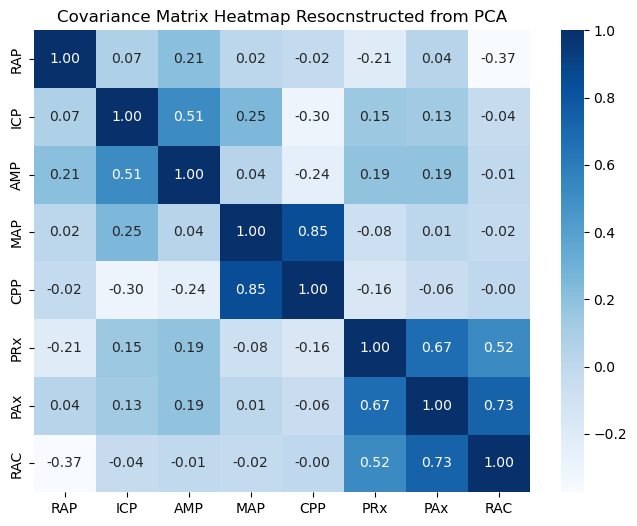

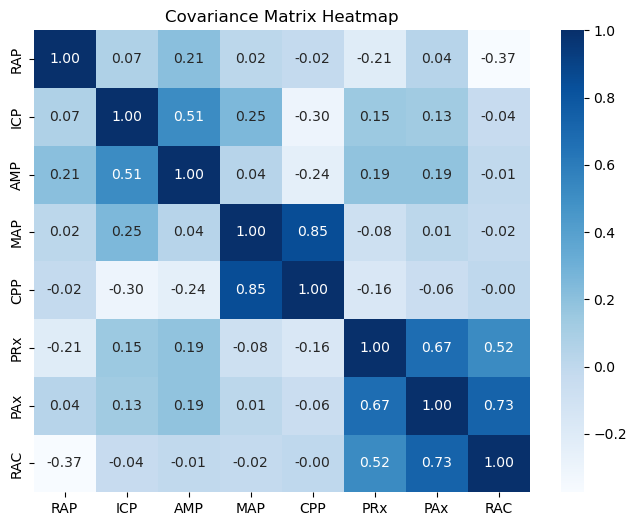

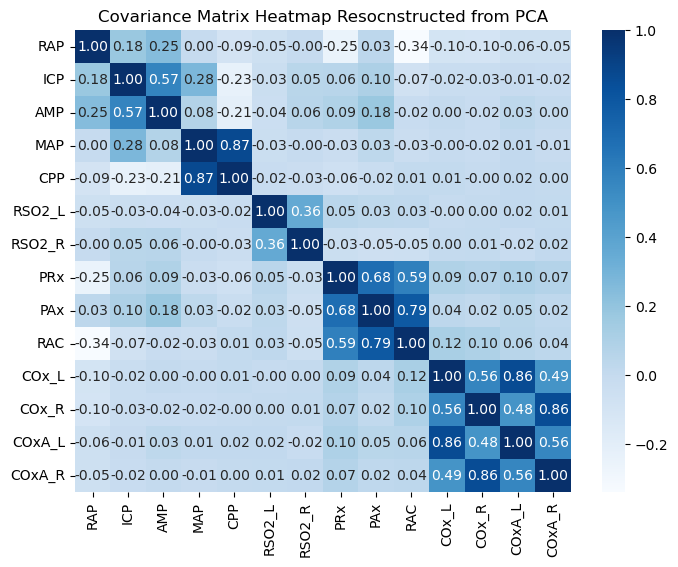

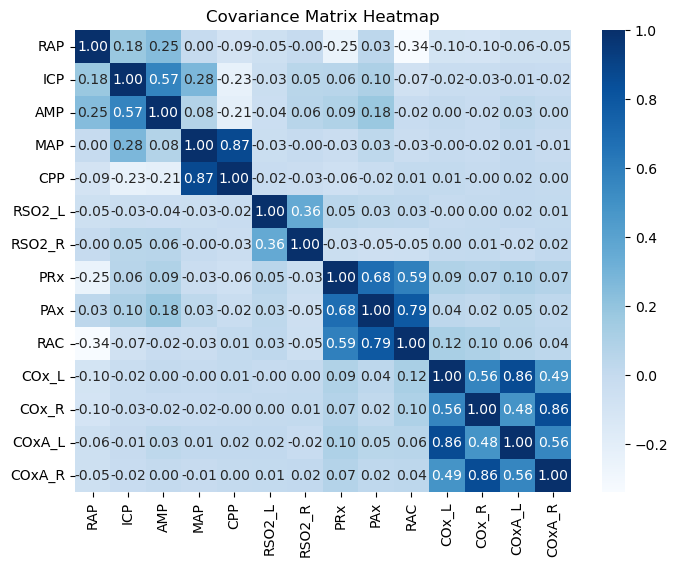

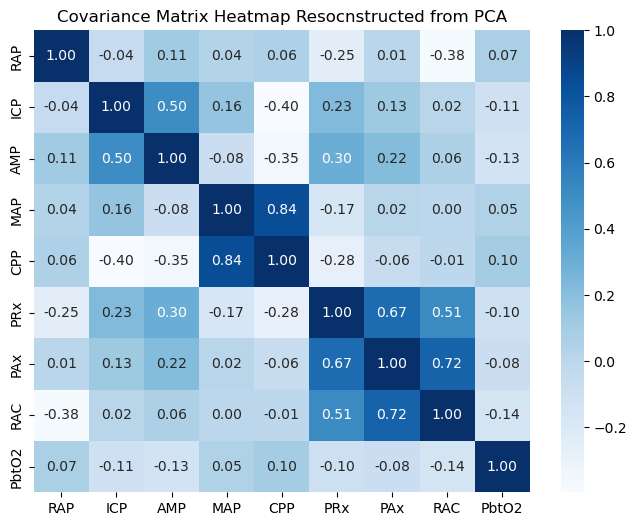

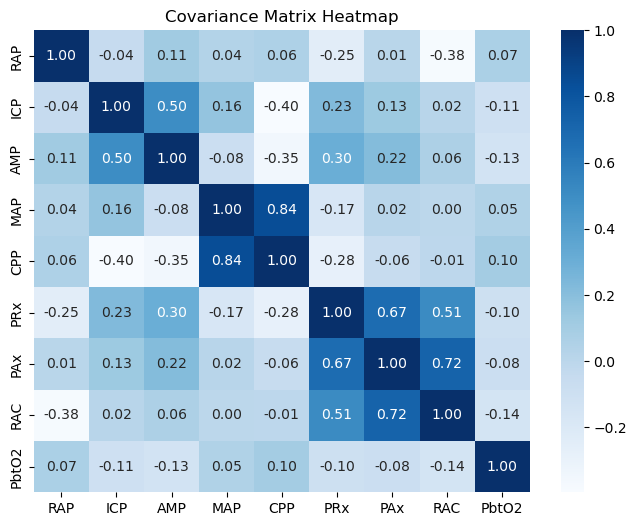

In [429]:
tic = timer()
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

for index, file_segment in enumerate(df_all):
    df_all_edited = df_all[index].dropna()
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(df_all_edited)

    # Applying PCA
    pca = PCA()
    pca.fit(data_scaled)
    pca_components = pca.transform(data_scaled)

    # Covaraicne heatmap from PCA analysis

    loadings = pca.components_.T  # Principal component coefficients (eigenvectors)
    explained_variance = np.diag(pca.explained_variance_)  # Diagonal matrix of eigenvalues
    cov_matrix_pca = loadings @ explained_variance @ loadings.T

    # Convert to DataFrame for better visualization
    cov_matrix_pca_df = pd.DataFrame(cov_matrix_pca, index=df_all_edited.columns, columns=df_all_edited.columns)

    # Step 4: Plot the Covariance Heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cov_matrix_pca_df, annot=True, fmt=".2f", cmap="Blues")
    plt.title("Covariance Matrix Heatmap Resocnstructed from PCA")

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA"
    save_image_name = 'PCA_heatmap_' + file_labels[index]
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()

    # Actual covariance heatmap

    cov_matrix = np.cov(data_scaled, rowvar=False)

    # Plot covariance matrix as heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cov_matrix, annot=True, cmap='Blues', fmt='.2f', xticklabels=df_all_edited.columns, yticklabels=df_all_edited.columns)
    plt.title('Covariance Matrix Heatmap')

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA"
    save_image_name = 'cov_matrix_heatmap_' + file_labels[index]
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()

## Sub-group analysis

In [20]:
def visualizing_scree_plots_using_PCA(segment, segment_no, resolution, file_label, labels):

    x_add_list = [1.25, 1.5, 1.3]

    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment)

    # Applying PCA
    pca = PCA()
    pca.fit(data_scaled)
    pca_components = pca.transform(data_scaled)

    # Calculating explained variance
    explained_variance_ratio = pca.explained_variance_ratio_
    print("Explained Variance Ratio:", explained_variance_ratio)

    cumulative_variance = explained_variance_ratio.cumsum()
    print("Cumulative Explained Variance:", cumulative_variance)

    #Visualizing the scree plot - Explained Variance Ratio
    components = np.arange(1, len(explained_variance_ratio) + 1)

    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker='o', linestyle='--')

    # Add explained variance values at each point
    x_add = x_add_list[index]
    for i, var in enumerate(explained_variance_ratio):
        plt.text(i + x_add, var, f"{var:.2f}", fontsize=8, ha='center', va='bottom', color='black')

    plt.xlabel("Principal Component")
    plt.ylabel("Explained Variance Ratio")
    plt.xticks(ticks=components, labels=components)
    plot_title = 'Scree plot: ' + labels[segment_no]
    plt.title(plot_title)

    x_min, x_max = plt.xlim()
    plt.xlim(x_min, x_max + 0.25)

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_Scree_plot_of_' + 'explained_variance_ratio_' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()

    #Visualizing the scree plot - Cumulative Explained Variance
    components = np.arange(1, len(cumulative_variance) + 1)

    plt.figure(figsize=(8, 6))
    plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')

    # Add cumulative explained variance values at each point
    for i, var in enumerate(cumulative_variance):
        plt.text(i + x_add, var-0.025, f"{var:.2f}", fontsize=8, ha='center', va='bottom', color='black')

    plt.xlabel("Principal Component")
    plt.ylabel("Cumulative Explained Variance")
    plt.xticks(ticks=components, labels=components)
    plot_title = 'Scree plot: ' + labels[segment_no]
    plt.title(plot_title)

    x_min, x_max = plt.xlim()
    plt.xlim(x_min, x_max + 0.25)

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_Scree_plot_of_' + 'cumulative_explained_variance_' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()


Resolution in progress:  M
---------------------------------------------------------------------


Explained Variance Ratio: [3.27268822e-01 2.17486673e-01 1.76216719e-01 1.25845544e-01
 7.98070335e-02 6.26787830e-02 1.06458495e-02 5.05746691e-05]
Cumulative Explained Variance: [0.32726882 0.5447555  0.72097221 0.84681776 0.92662479 0.98930358
 0.99994943 1.        ]


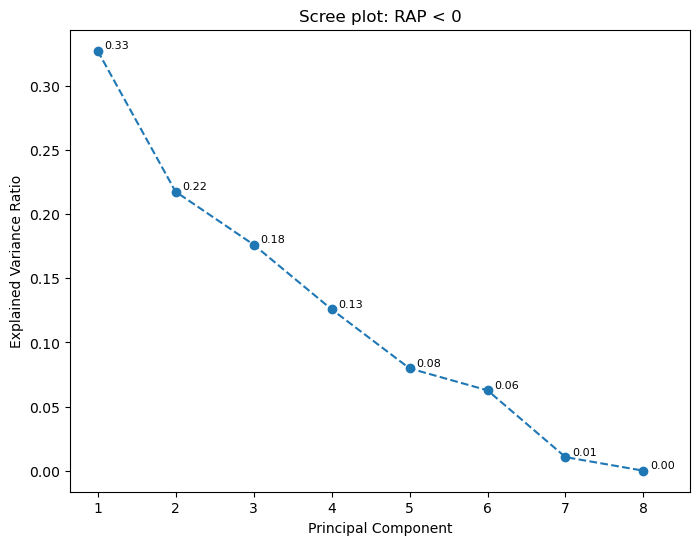

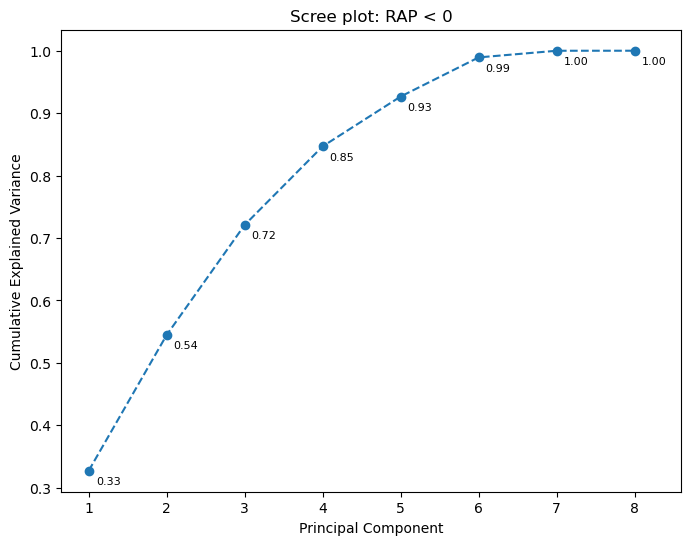

Explained Variance Ratio: [2.75494140e-01 2.51711602e-01 1.78688352e-01 1.25618622e-01
 1.02492490e-01 6.18538677e-02 4.10880913e-03 3.21173578e-05]
Cumulative Explained Variance: [0.27549414 0.52720574 0.70589409 0.83151272 0.93400521 0.99585907
 0.99996788 1.        ]


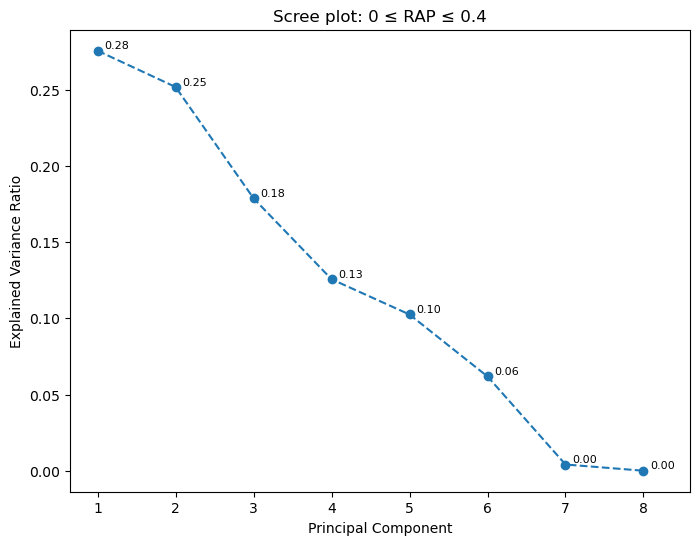

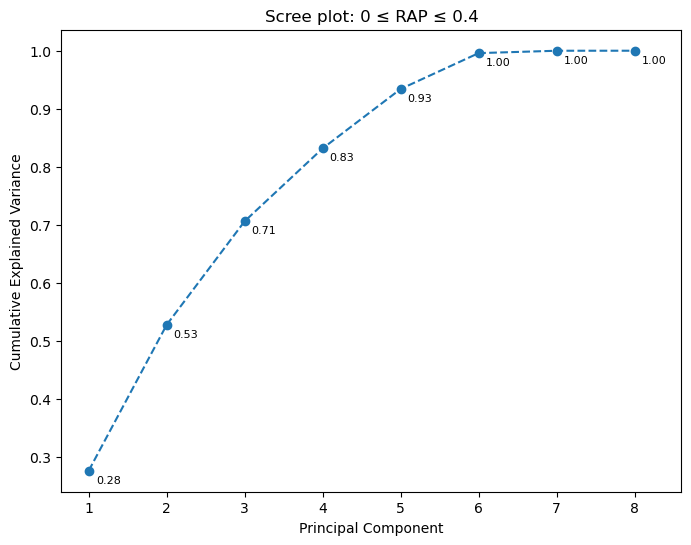

Explained Variance Ratio: [3.38063005e-01 2.29306742e-01 2.10304210e-01 1.09828832e-01
 6.11697236e-02 3.97643237e-02 1.15504331e-02 1.27300907e-05]
Cumulative Explained Variance: [0.33806301 0.56736975 0.77767396 0.88750279 0.94867251 0.98843684
 0.99998727 1.        ]


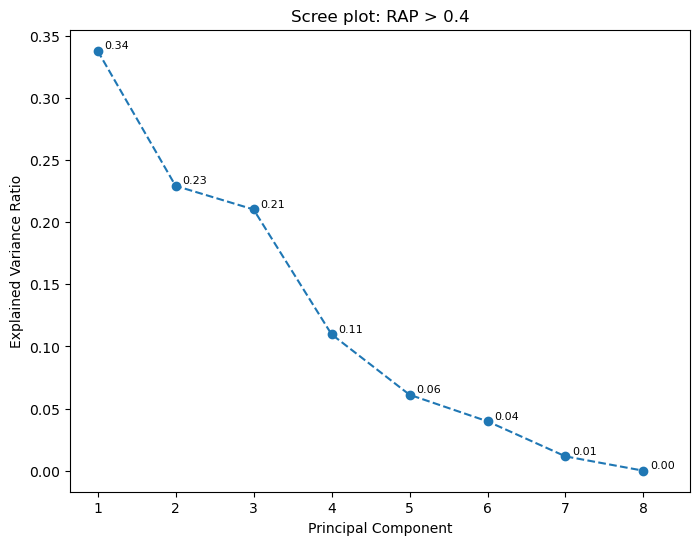

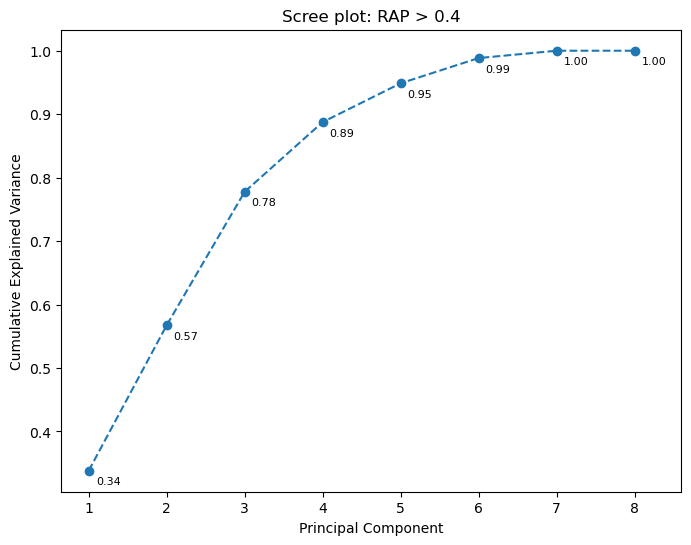

Explained Variance Ratio: [2.29746976e-01 1.62610360e-01 1.43376298e-01 1.09698696e-01
 1.08329687e-01 7.21110611e-02 5.19893672e-02 3.84691147e-02
 3.74318033e-02 2.37681791e-02 1.52960245e-02 3.85475208e-03
 3.26467379e-03 5.30066919e-05]
Cumulative Explained Variance: [0.22974698 0.39235734 0.53573363 0.64543233 0.75376202 0.82587308
 0.87786245 0.91633156 0.95376336 0.97753154 0.99282757 0.99668232
 0.99994699 1.        ]


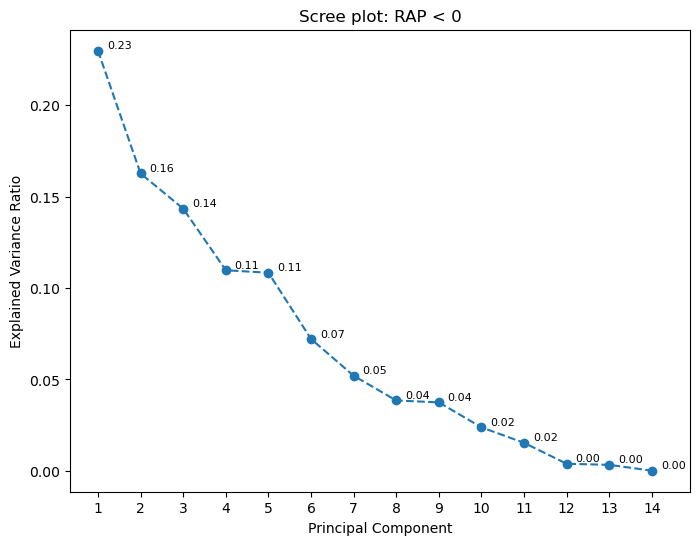

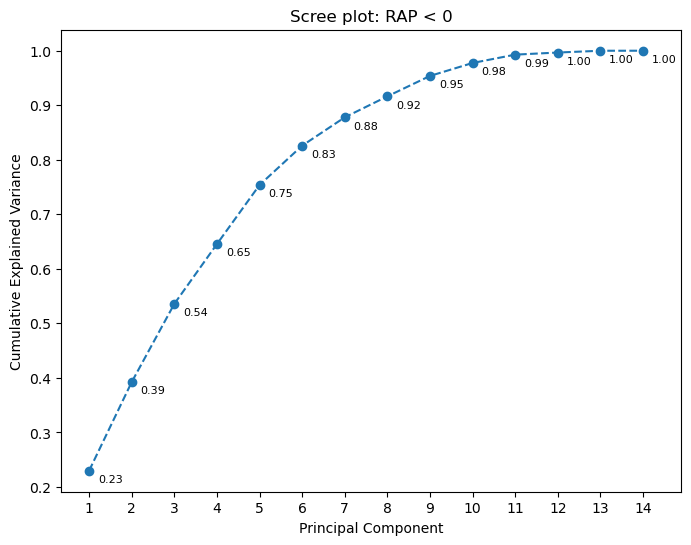

Explained Variance Ratio: [2.18480001e-01 1.50255739e-01 1.44117947e-01 1.19968994e-01
 1.07993903e-01 7.31147394e-02 6.17833013e-02 5.55580928e-02
 3.33782381e-02 2.06011962e-02 1.04109437e-02 2.82587472e-03
 1.48238004e-03 2.86506656e-05]
Cumulative Explained Variance: [0.21848    0.36873574 0.51285369 0.63282268 0.74081658 0.81393132
 0.87571462 0.93127272 0.96465095 0.98525215 0.99566309 0.99848897
 0.99997135 1.        ]


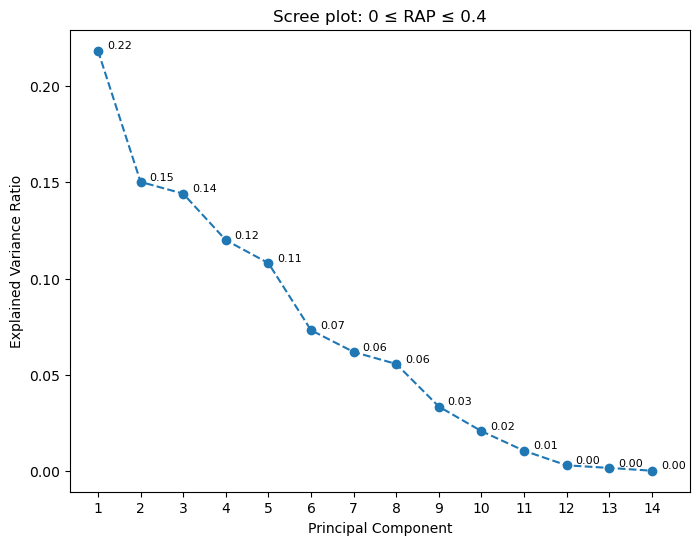

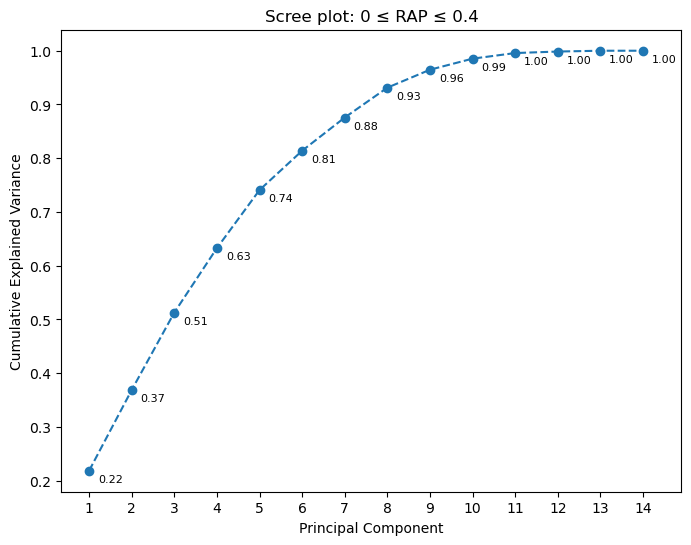

Explained Variance Ratio: [2.25962356e-01 1.78922404e-01 1.38770080e-01 1.29517885e-01
 1.13427632e-01 5.92114529e-02 5.02372619e-02 3.23157247e-02
 2.58086903e-02 2.10730148e-02 1.49633886e-02 5.65453418e-03
 4.12843524e-03 7.13993366e-06]
Cumulative Explained Variance: [0.22596236 0.40488476 0.54365484 0.67317273 0.78660036 0.84581181
 0.89604907 0.9283648  0.95417349 0.9752465  0.99020989 0.99586442
 0.99999286 1.        ]


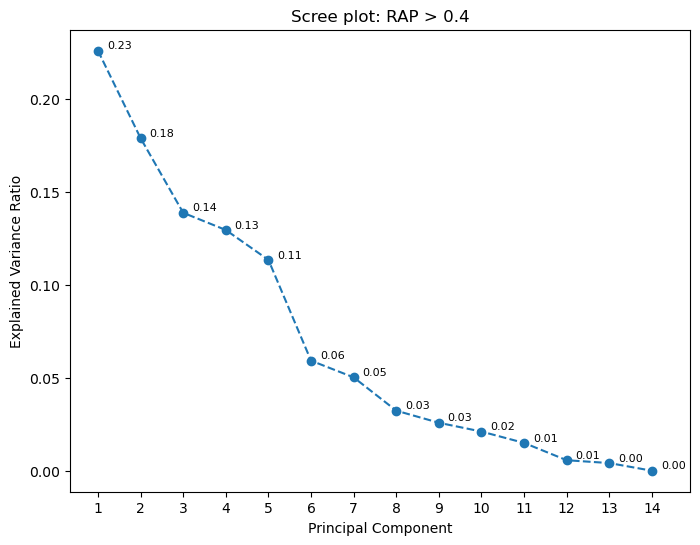

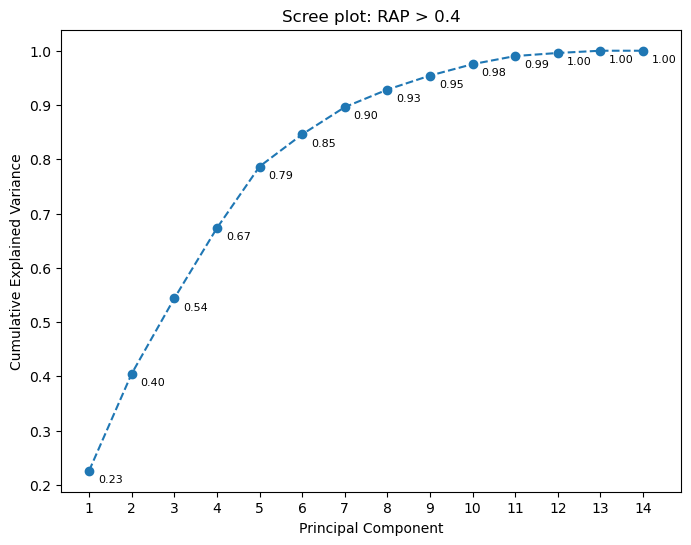

Explained Variance Ratio: [3.41991273e-01 1.77450092e-01 1.31323845e-01 1.17548012e-01
 9.75048457e-02 7.36375851e-02 4.92743743e-02 1.12323585e-02
 3.76143370e-05]
Cumulative Explained Variance: [0.34199127 0.51944137 0.65076521 0.76831322 0.86581807 0.93945565
 0.98873003 0.99996239 1.        ]


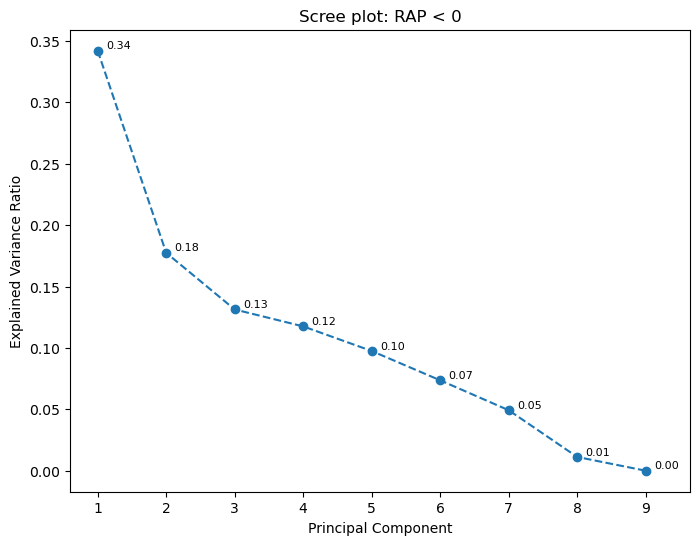

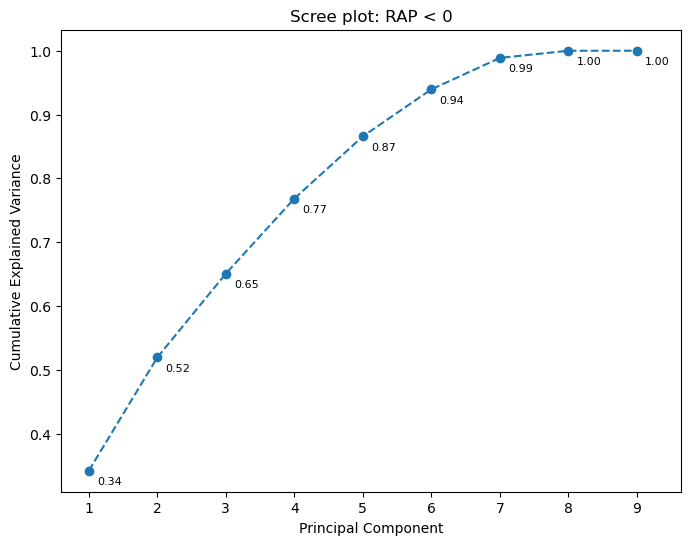

Explained Variance Ratio: [2.93739093e-01 2.26908092e-01 1.36536019e-01 1.11674565e-01
 1.03650102e-01 7.59698240e-02 4.69710787e-02 4.54045848e-03
 1.07678662e-05]
Cumulative Explained Variance: [0.29373909 0.52064718 0.6571832  0.76885777 0.87250787 0.94847769
 0.99544877 0.99998923 1.        ]


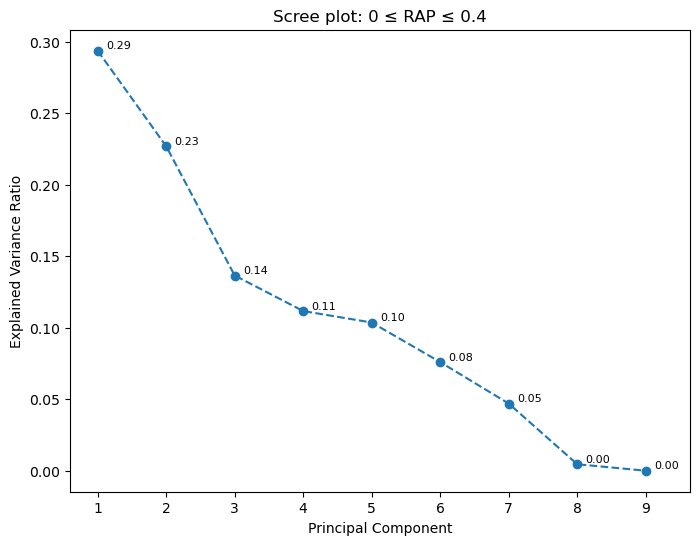

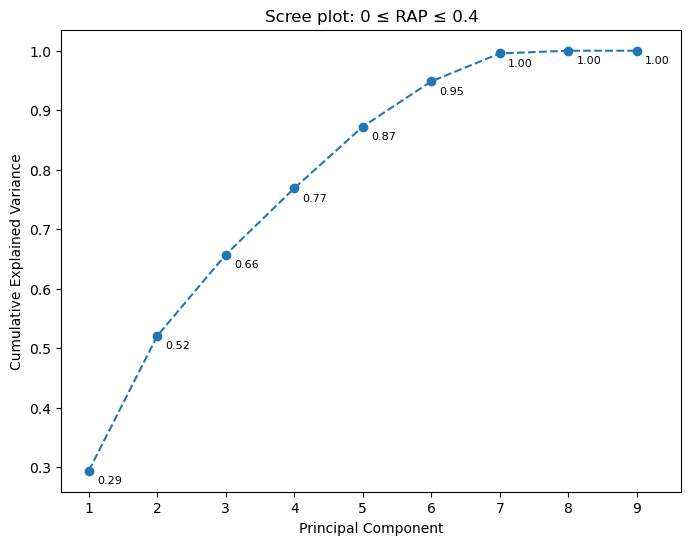

Explained Variance Ratio: [3.25479788e-01 2.06385500e-01 1.62914008e-01 1.12747564e-01
 9.52320143e-02 5.30095822e-02 3.42104287e-02 1.00144931e-02
 6.62157614e-06]
Cumulative Explained Variance: [0.32547979 0.53186529 0.6947793  0.80752686 0.90275887 0.95576846
 0.98997889 0.99999338 1.        ]


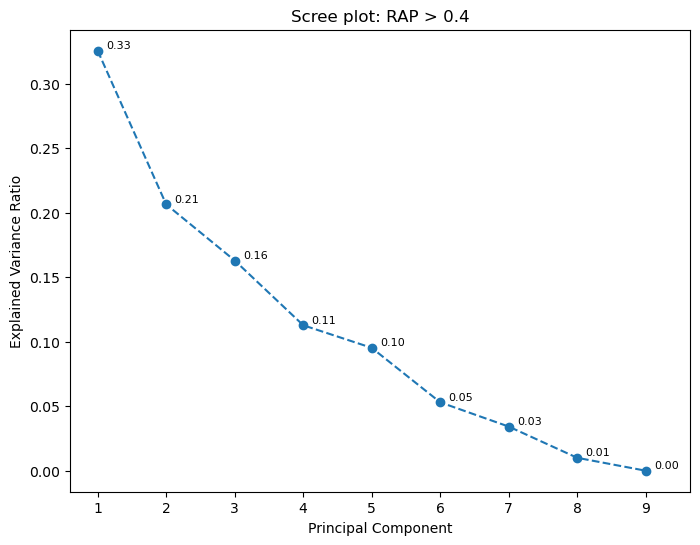

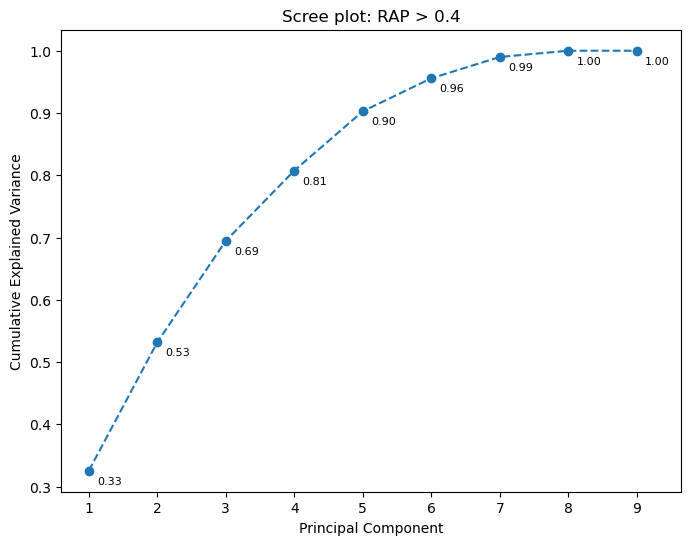

Resolution in progress:  5T
---------------------------------------------------------------------


Explained Variance Ratio: [0.29586187 0.22663867 0.17324926 0.12831746 0.09367746 0.07173479
 0.0095354  0.00098509]
Cumulative Explained Variance: [0.29586187 0.52250054 0.6957498  0.82406726 0.91774472 0.98947951
 0.99901491 1.        ]


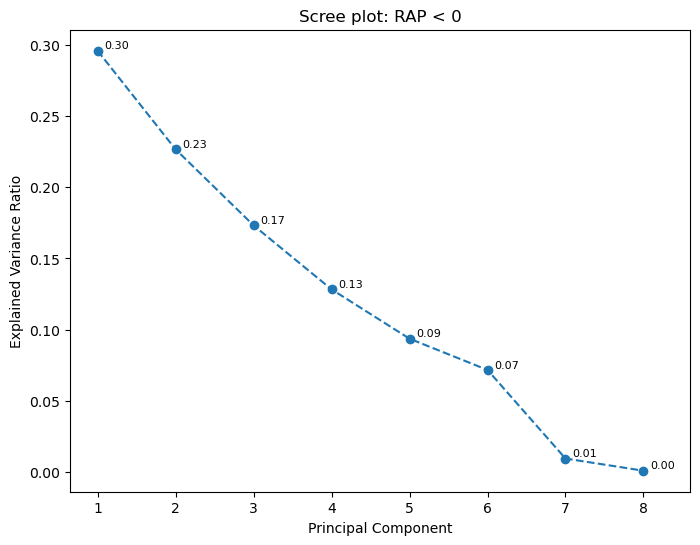

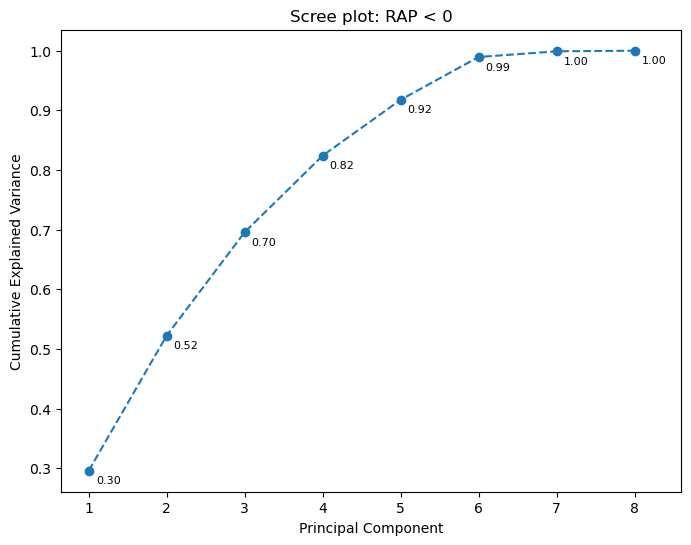

Explained Variance Ratio: [0.2576796  0.2414533  0.18614385 0.12663825 0.10698877 0.07347742
 0.00648491 0.00113391]
Cumulative Explained Variance: [0.2576796  0.4991329  0.68527675 0.81191499 0.91890376 0.99238118
 0.99886609 1.        ]


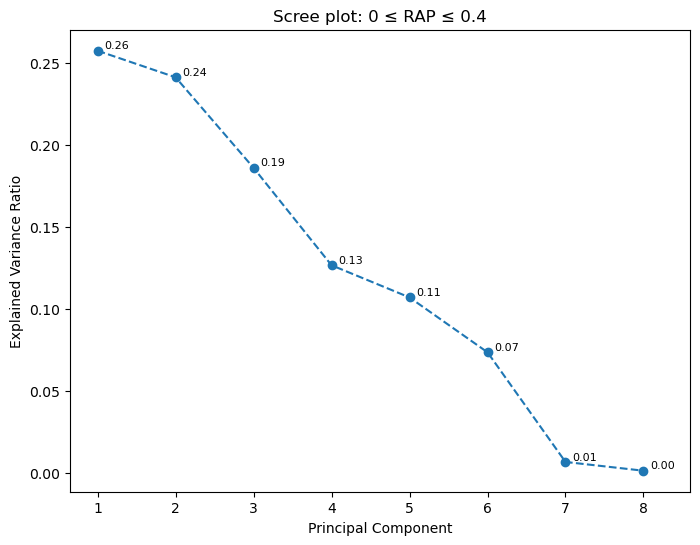

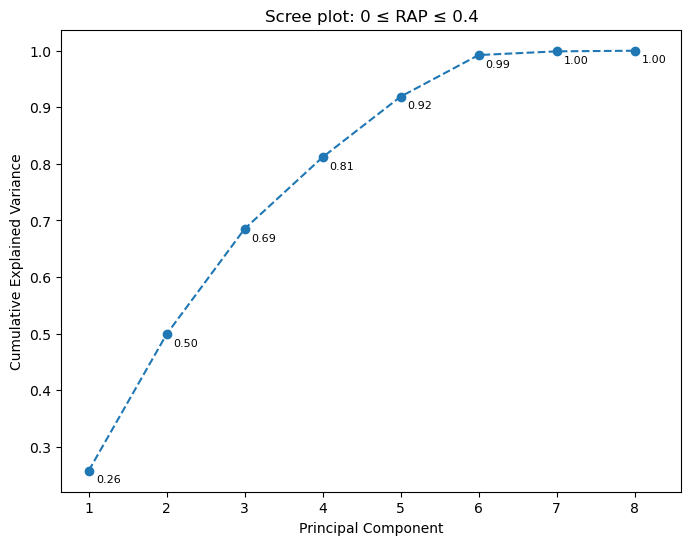

Explained Variance Ratio: [0.3242317  0.23354968 0.21482938 0.1062167  0.06571102 0.04183386
 0.01242231 0.00120536]
Cumulative Explained Variance: [0.3242317  0.55778138 0.77261076 0.87882745 0.94453847 0.98637233
 0.99879464 1.        ]


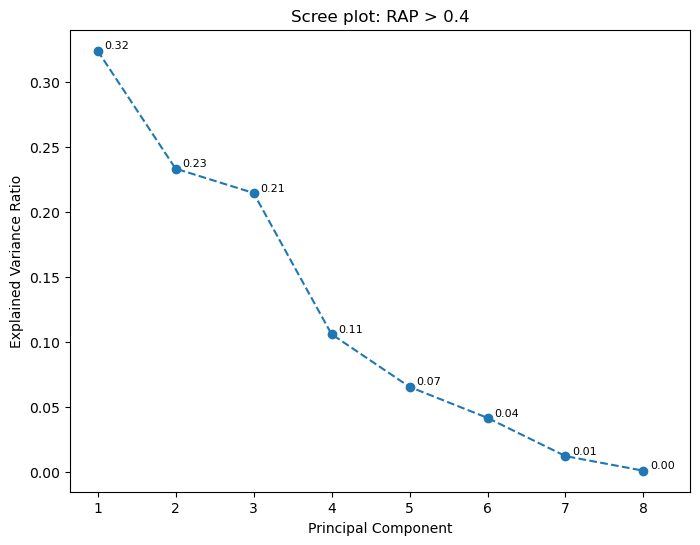

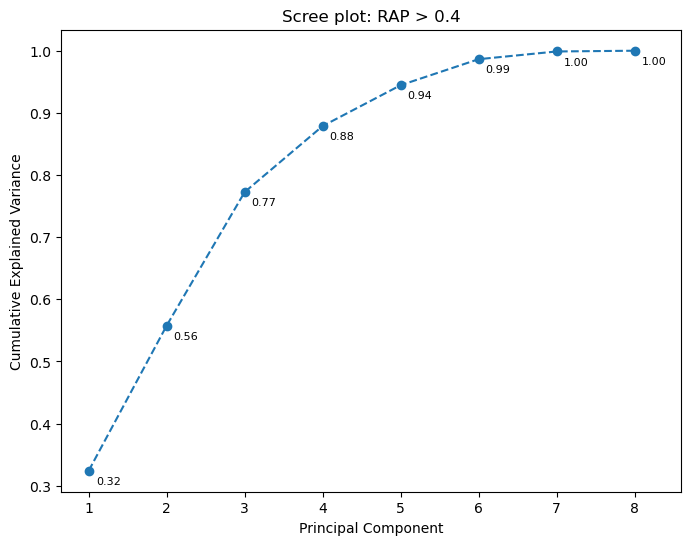

Explained Variance Ratio: [0.22454811 0.16725233 0.14882372 0.1060115  0.10207318 0.07342662
 0.05115534 0.04184181 0.03596311 0.02653467 0.01483946 0.00414498
 0.0029611  0.00042406]
Cumulative Explained Variance: [0.22454811 0.39180044 0.54062416 0.64663566 0.74870884 0.82213546
 0.8732908  0.91513261 0.95109573 0.9776304  0.99246986 0.99661484
 0.99957594 1.        ]


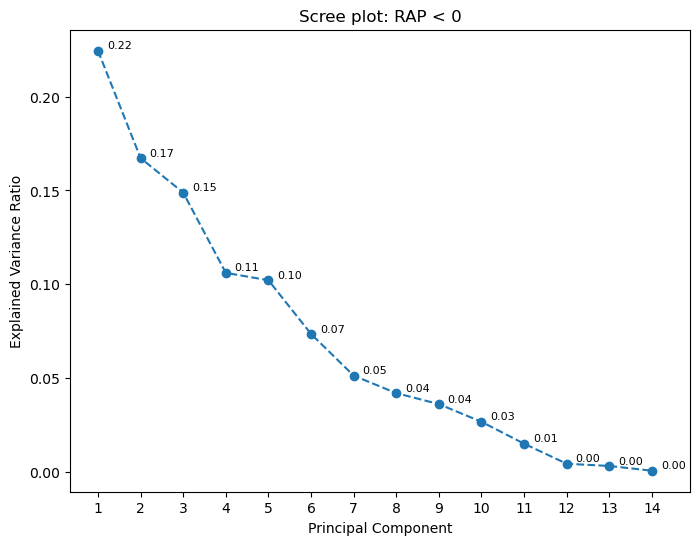

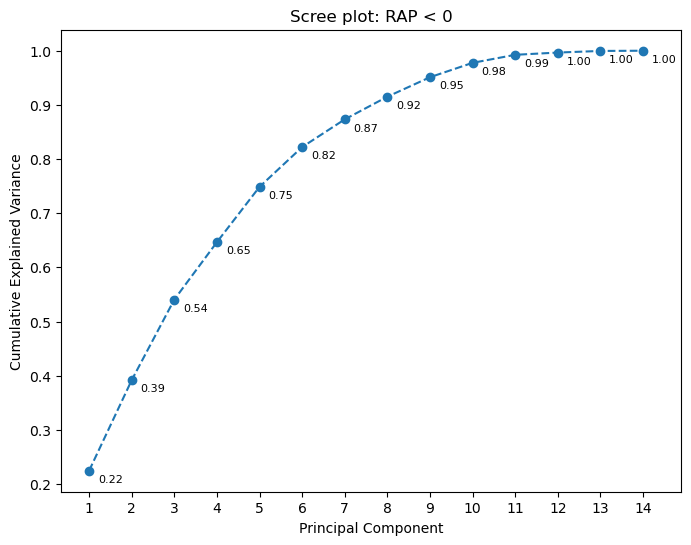

Explained Variance Ratio: [0.2175828  0.15239878 0.14518656 0.1151954  0.11193948 0.07381271
 0.05813516 0.05486055 0.02999921 0.0227458  0.01162943 0.00347596
 0.00254433 0.00049383]
Cumulative Explained Variance: [0.2175828  0.36998158 0.51516815 0.63036355 0.74230302 0.81611573
 0.87425089 0.92911144 0.95911065 0.98185645 0.99348588 0.99696184
 0.99950617 1.        ]


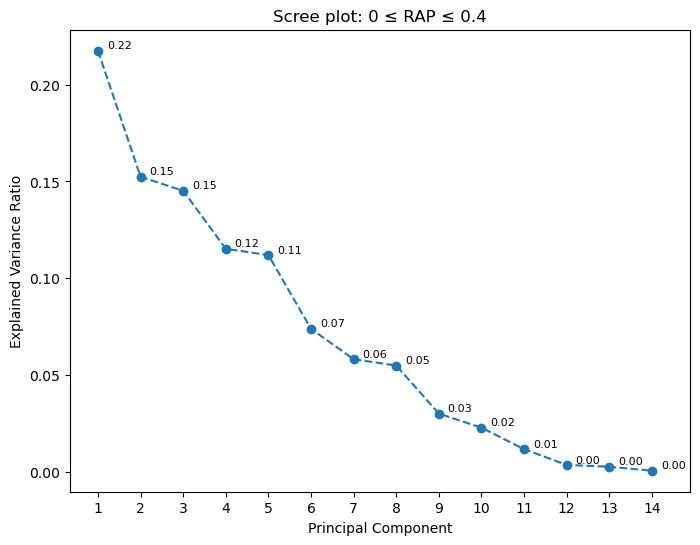

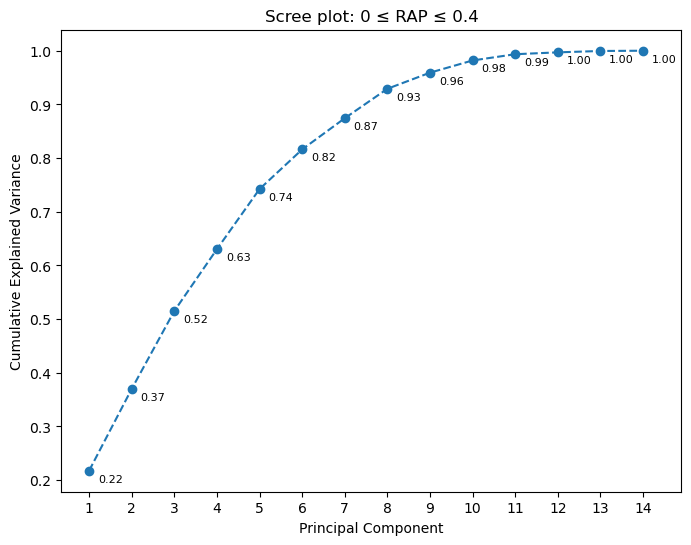

Explained Variance Ratio: [0.22538943 0.17976164 0.13782897 0.12683668 0.10742296 0.06014174
 0.05047818 0.03214641 0.03162174 0.02209218 0.01562341 0.00552539
 0.00435499 0.00077627]
Cumulative Explained Variance: [0.22538943 0.40515107 0.54298004 0.66981673 0.77723969 0.83738143
 0.88785961 0.92000602 0.95162776 0.97371994 0.98934335 0.99486874
 0.99922373 1.        ]


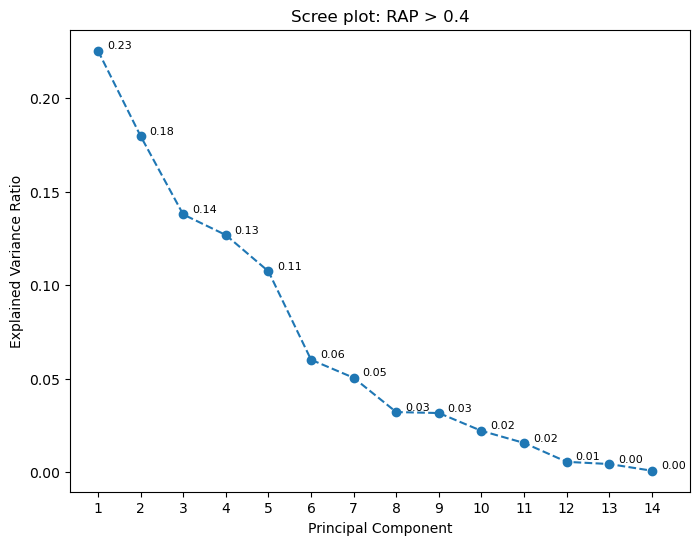

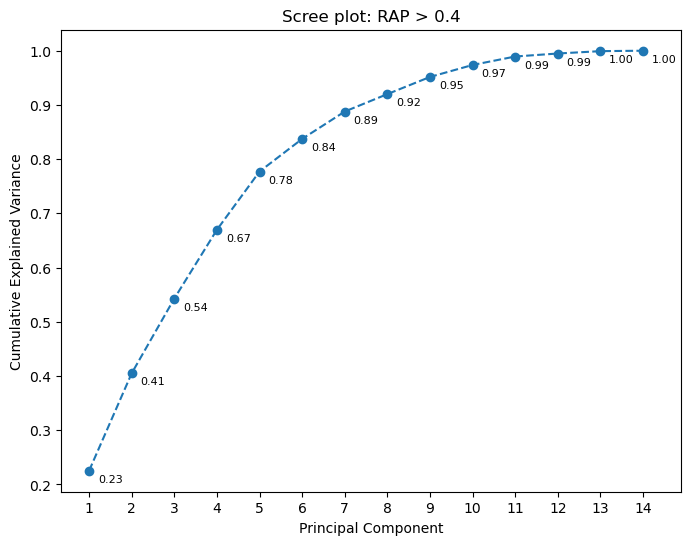

Explained Variance Ratio: [0.28973989 0.18853758 0.13793331 0.116348   0.10397239 0.08558256
 0.06601318 0.01132518 0.00054791]
Cumulative Explained Variance: [0.28973989 0.47827747 0.61621078 0.73255878 0.83653117 0.92211373
 0.98812691 0.99945209 1.        ]


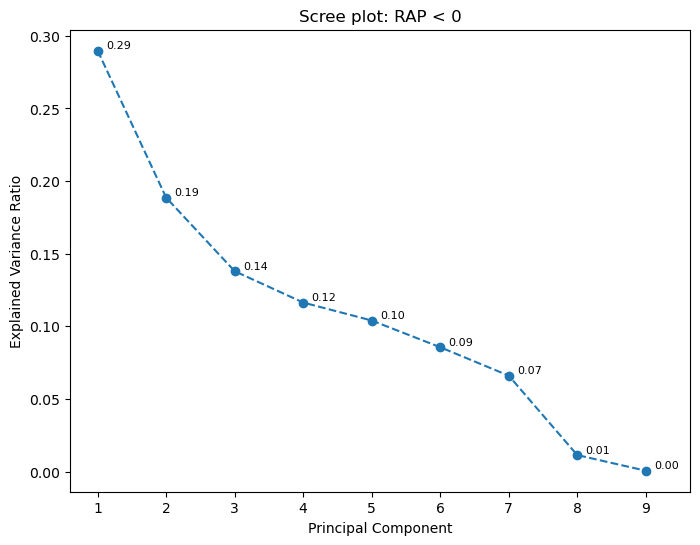

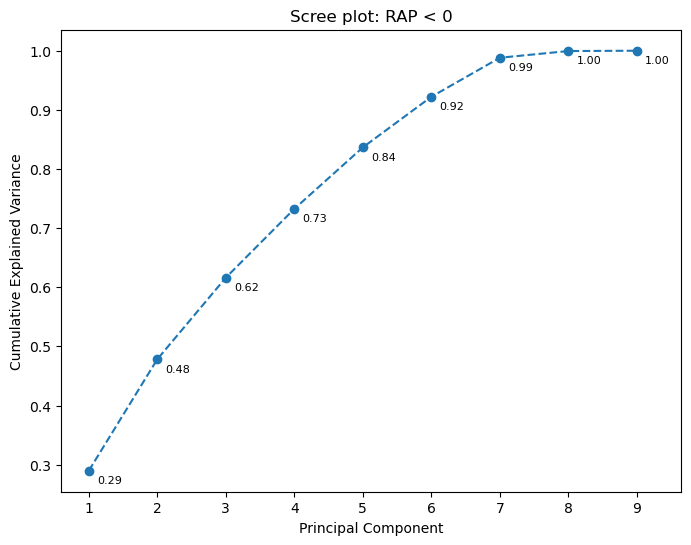

Explained Variance Ratio: [0.24179535 0.22026491 0.15717552 0.11380854 0.10581495 0.08687381
 0.06630828 0.00744443 0.00051422]
Cumulative Explained Variance: [0.24179535 0.46206025 0.61923577 0.73304431 0.83885926 0.92573307
 0.99204136 0.99948578 1.        ]


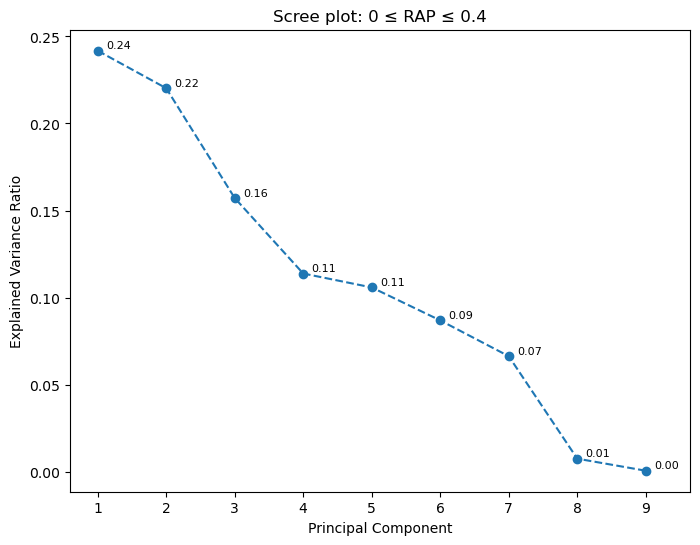

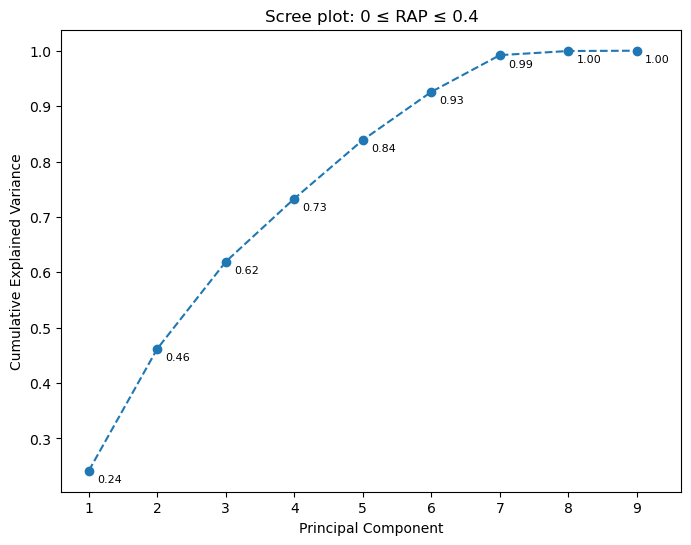

Explained Variance Ratio: [0.29128497 0.21122312 0.1775204  0.1102522  0.10371918 0.060648
 0.03420413 0.01062053 0.00052747]
Cumulative Explained Variance: [0.29128497 0.50250808 0.68002848 0.79028069 0.89399987 0.95464787
 0.988852   0.99947253 1.        ]


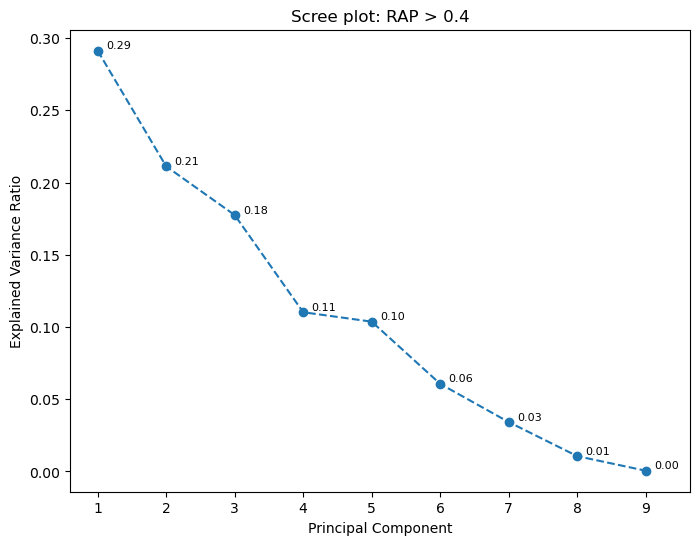

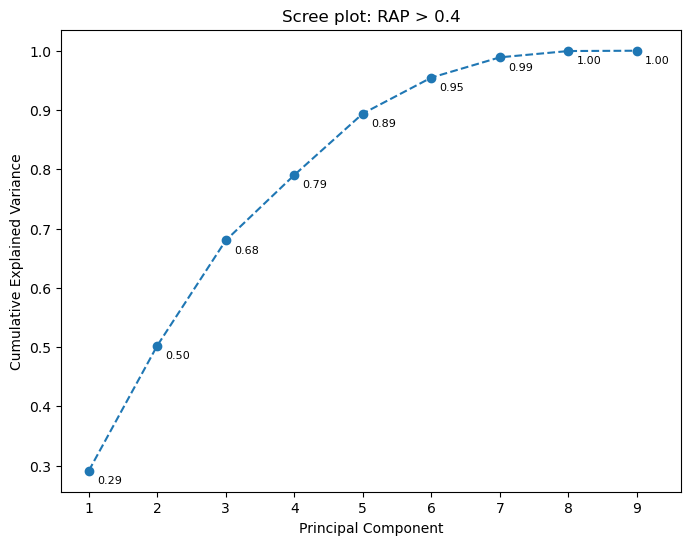

Resolution in progress:  10T
---------------------------------------------------------------------


Explained Variance Ratio: [0.3049682  0.21589134 0.17157588 0.12546633 0.10008254 0.07174795
 0.00926617 0.00100158]
Cumulative Explained Variance: [0.3049682  0.52085954 0.69243542 0.81790175 0.9179843  0.98973225
 0.99899842 1.        ]


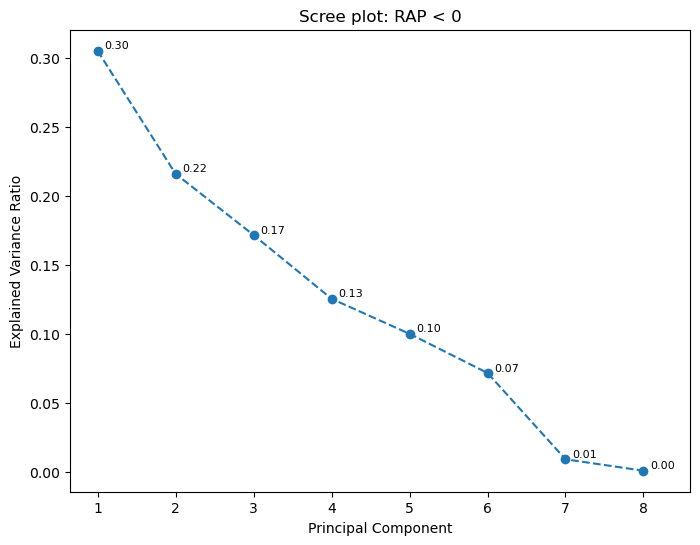

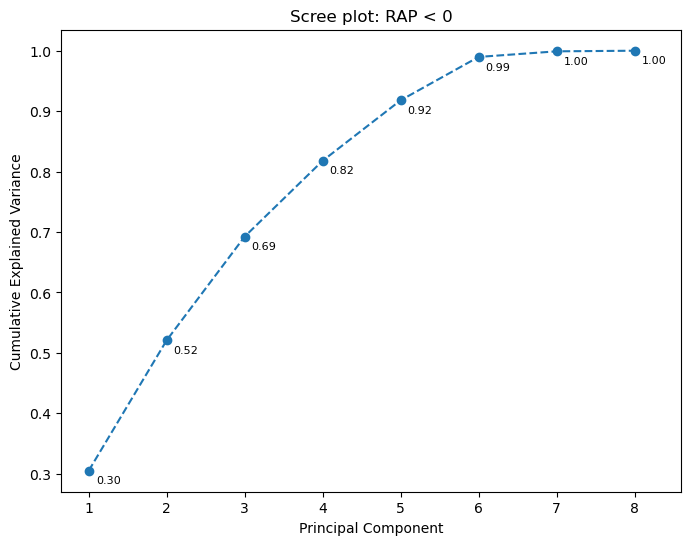

Explained Variance Ratio: [0.2621318  0.23969713 0.18474753 0.12600558 0.10671197 0.07261524
 0.00691583 0.00117492]
Cumulative Explained Variance: [0.2621318  0.50182893 0.68657646 0.81258204 0.91929401 0.99190925
 0.99882508 1.        ]


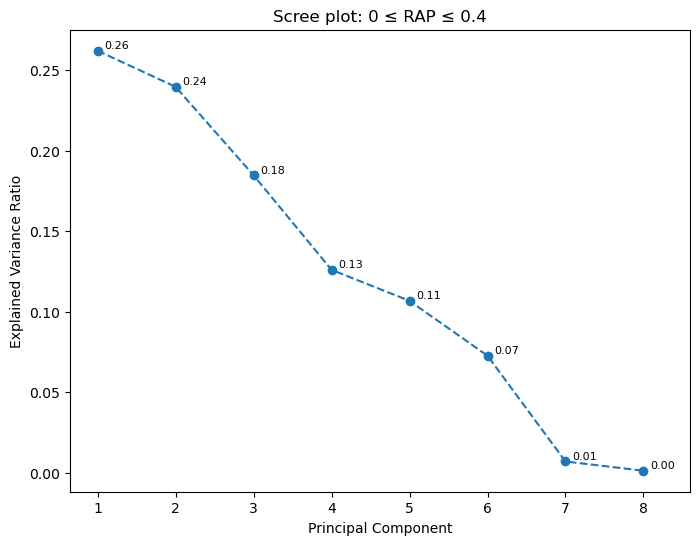

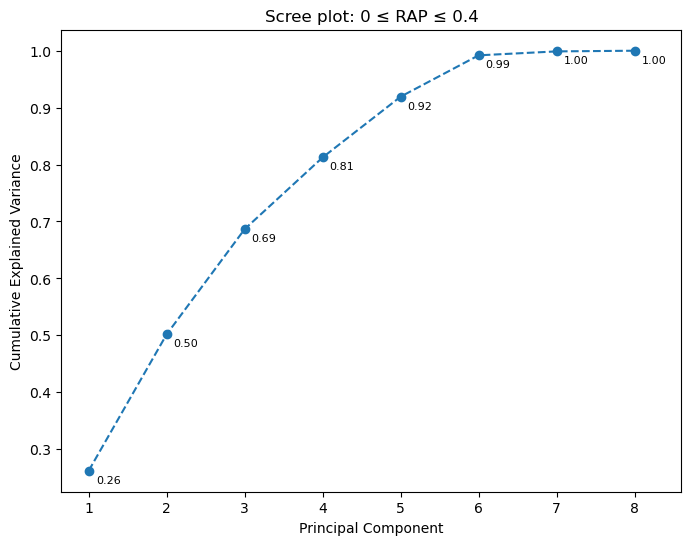

Explained Variance Ratio: [0.32553983 0.23431762 0.21487726 0.10388185 0.06586204 0.04178563
 0.01252911 0.00120666]
Cumulative Explained Variance: [0.32553983 0.55985745 0.77473471 0.87861656 0.9444786  0.98626423
 0.99879334 1.        ]


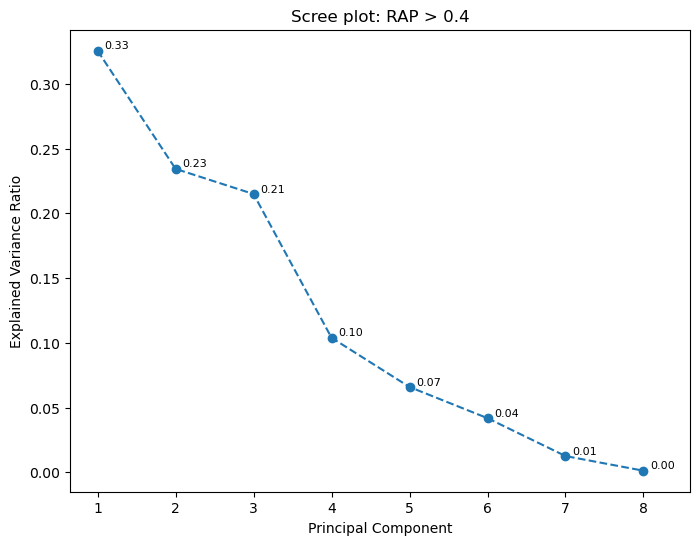

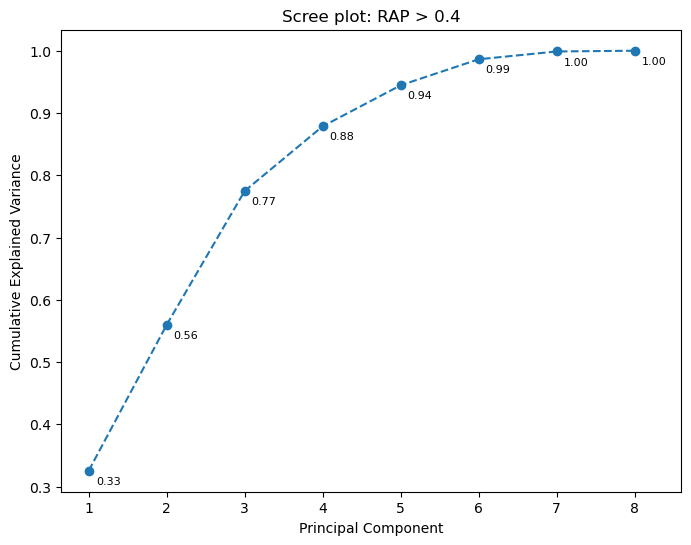

Explained Variance Ratio: [0.21829099 0.18120003 0.1464385  0.10769299 0.08952669 0.07109381
 0.05672695 0.04191491 0.0394918  0.02697028 0.01358734 0.00381728
 0.00276415 0.00048428]
Cumulative Explained Variance: [0.21829099 0.39949101 0.54592952 0.65362251 0.7431492  0.81424301
 0.87096995 0.91288487 0.95237667 0.97934695 0.99293429 0.99675157
 0.99951572 1.        ]


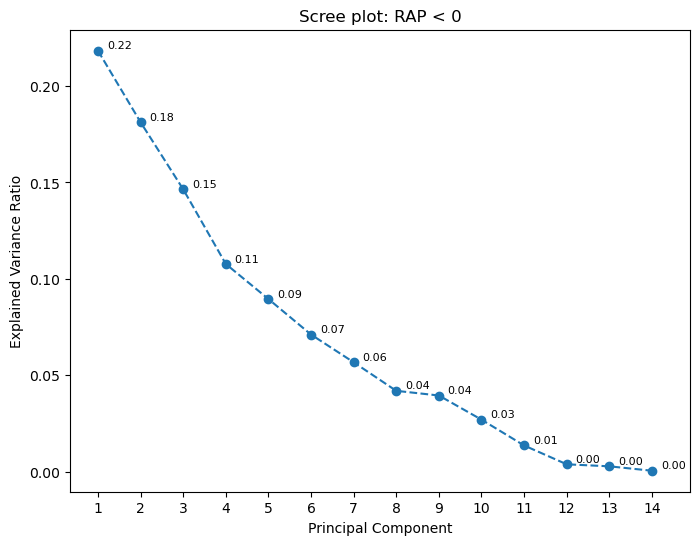

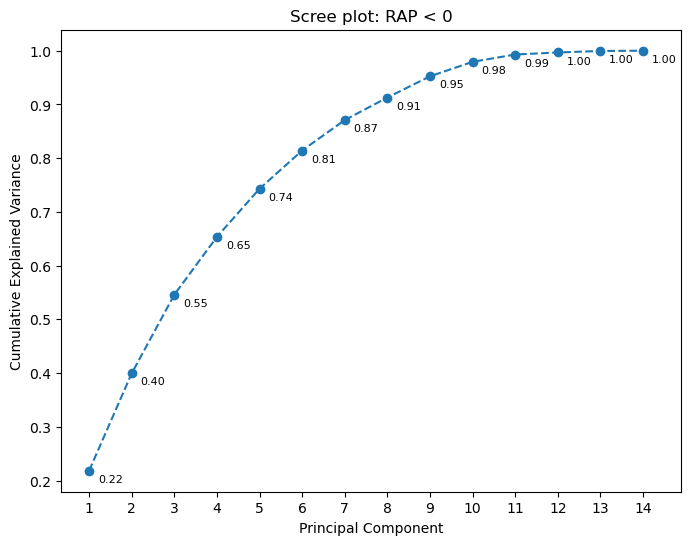

Explained Variance Ratio: [0.22078262 0.1576941  0.14135644 0.11441938 0.11335132 0.07383215
 0.05698395 0.05218415 0.02945771 0.02205986 0.01157787 0.00338625
 0.0024763  0.00043791]
Cumulative Explained Variance: [0.22078262 0.37847673 0.51983317 0.63425255 0.74760387 0.82143601
 0.87841996 0.93060411 0.96006182 0.98212168 0.99369955 0.99708579
 0.99956209 1.        ]


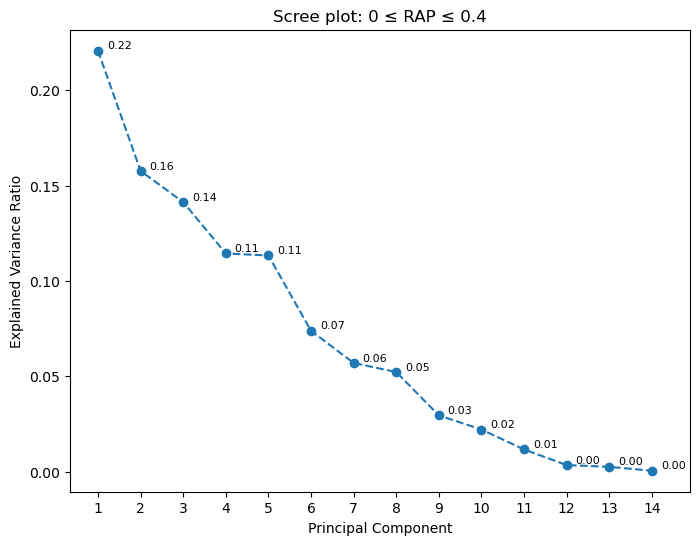

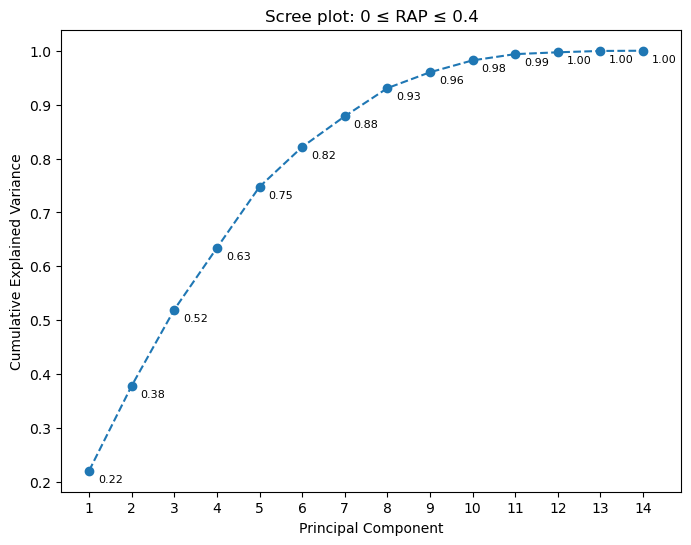

Explained Variance Ratio: [0.22791972 0.17909669 0.13854081 0.1271954  0.1072859  0.05878378
 0.04837124 0.03197737 0.03162603 0.02224471 0.01622341 0.00542987
 0.00450773 0.00079734]
Cumulative Explained Variance: [0.22791972 0.4070164  0.54555721 0.67275262 0.78003852 0.83882231
 0.88719355 0.91917092 0.95079694 0.97304165 0.98926507 0.99469493
 0.99920266 1.        ]


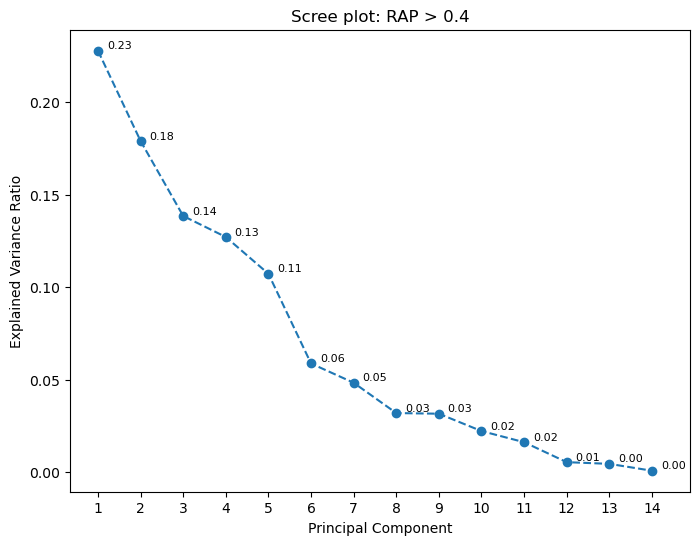

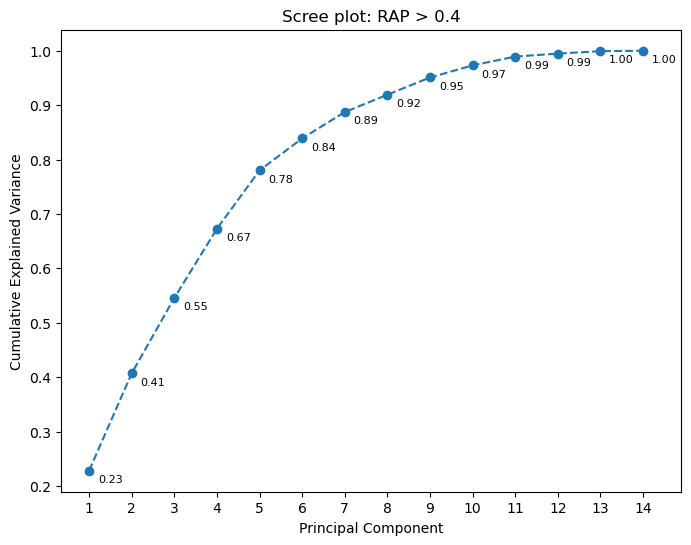

Explained Variance Ratio: [0.30290536 0.18799696 0.13520633 0.1132491  0.10441607 0.08158408
 0.06368615 0.01049078 0.00046516]
Cumulative Explained Variance: [0.30290536 0.49090233 0.62610866 0.73935776 0.84377383 0.92535791
 0.98904406 0.99953484 1.        ]


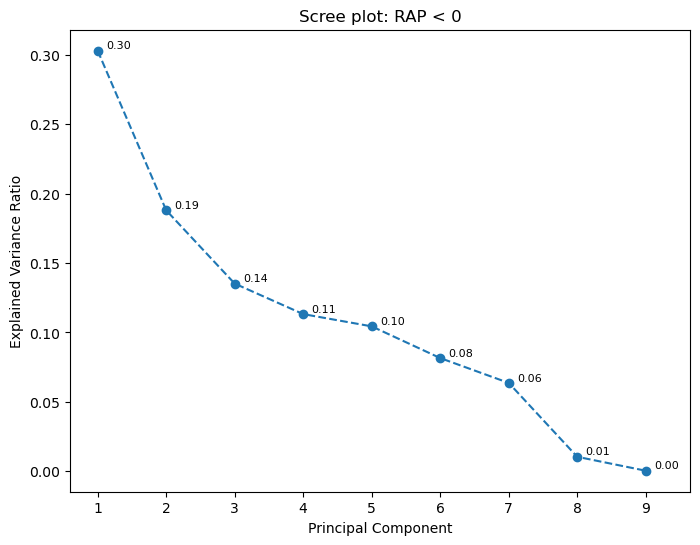

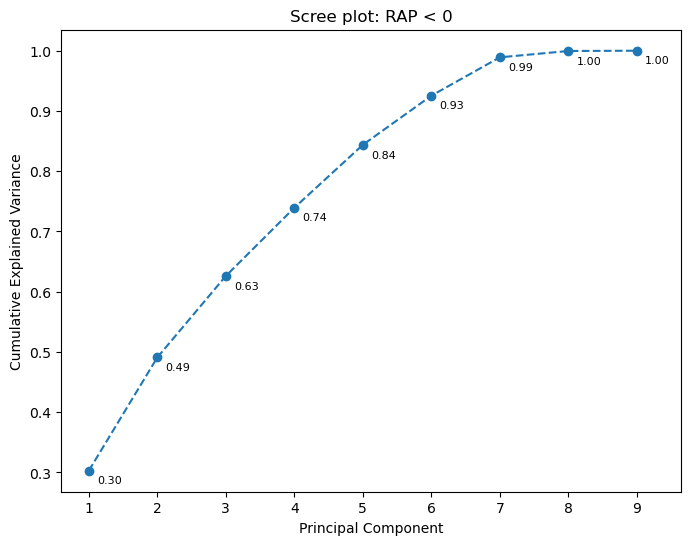

Explained Variance Ratio: [0.24771959 0.21822206 0.15576351 0.11311419 0.10725079 0.08527707
 0.06433844 0.00772054 0.00059381]
Cumulative Explained Variance: [0.24771959 0.46594165 0.62170517 0.73481935 0.84207014 0.92734721
 0.99168565 0.99940619 1.        ]


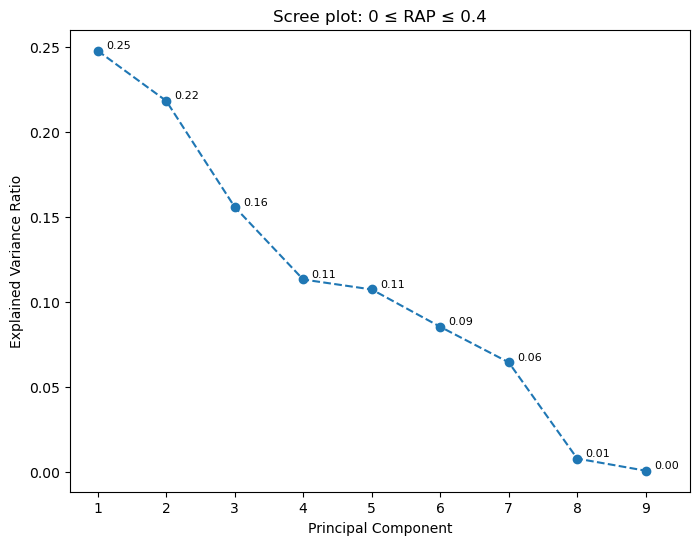

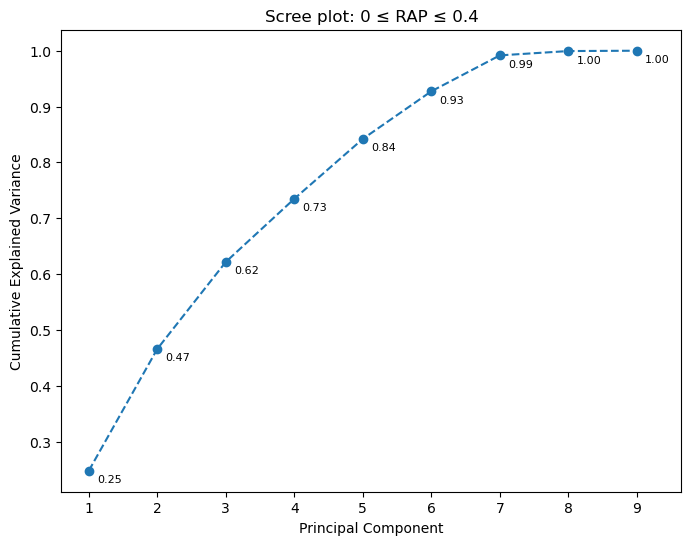

Explained Variance Ratio: [0.29257441 0.21079047 0.17842739 0.11013792 0.10321285 0.06015526
 0.03346782 0.01073196 0.00050194]
Cumulative Explained Variance: [0.29257441 0.50336487 0.68179226 0.79193018 0.89514303 0.95529829
 0.9887661  0.99949806 1.        ]


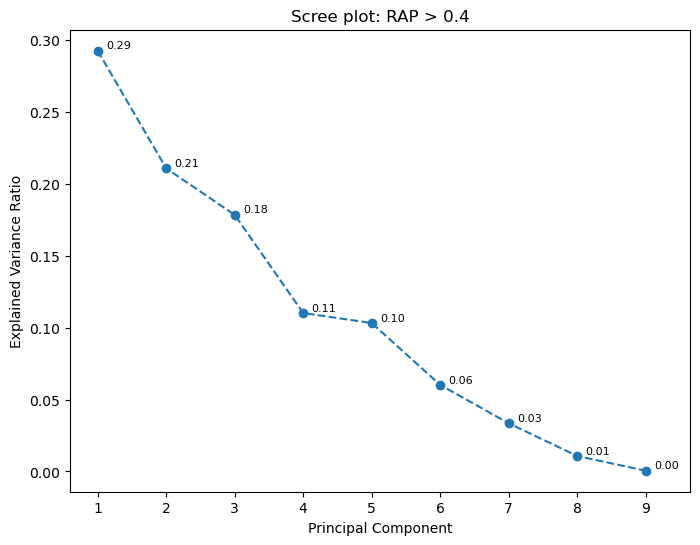

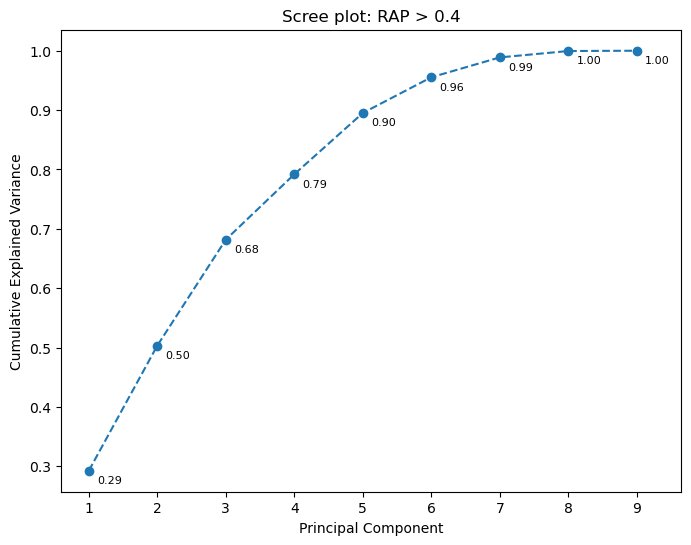

Resolution in progress:  30T
---------------------------------------------------------------------


Explained Variance Ratio: [0.32503472 0.20060393 0.16908192 0.12455933 0.1042645  0.06606698
 0.00885302 0.00153561]
Cumulative Explained Variance: [0.32503472 0.52563864 0.69472056 0.81927989 0.92354438 0.98961136
 0.99846439 1.        ]


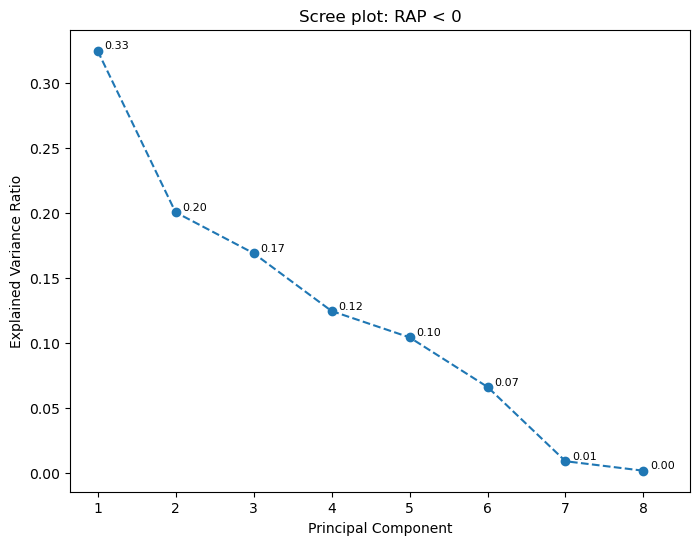

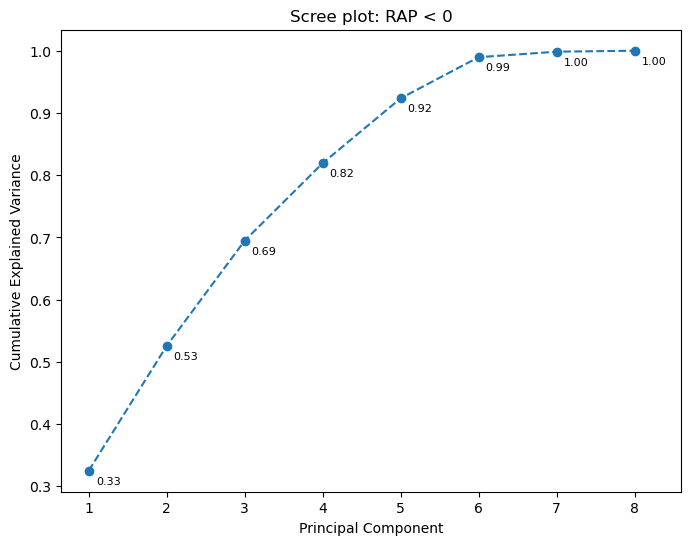

Explained Variance Ratio: [0.2721043  0.24029341 0.17523687 0.12528738 0.10448341 0.07452255
 0.00693538 0.00113669]
Cumulative Explained Variance: [0.2721043  0.51239771 0.68763459 0.81292197 0.91740538 0.99192793
 0.99886331 1.        ]


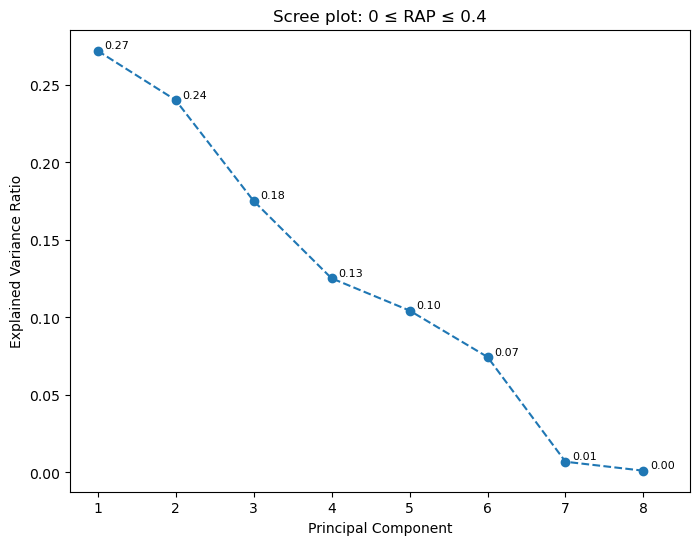

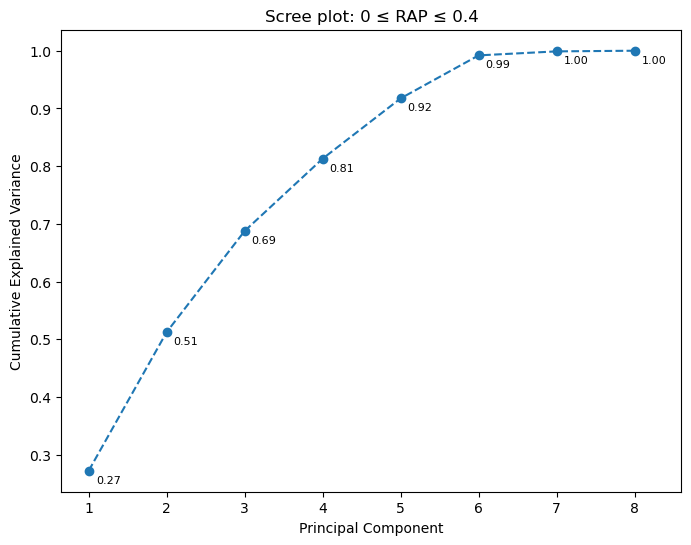

Explained Variance Ratio: [0.3286028  0.23569181 0.21389918 0.1008523  0.06591764 0.04158146
 0.01219795 0.00125686]
Cumulative Explained Variance: [0.3286028  0.5642946  0.77819378 0.87904608 0.94496372 0.98654518
 0.99874314 1.        ]


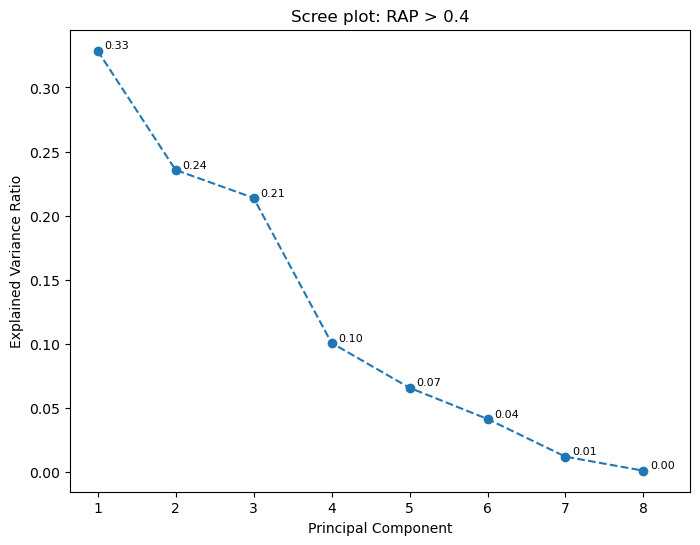

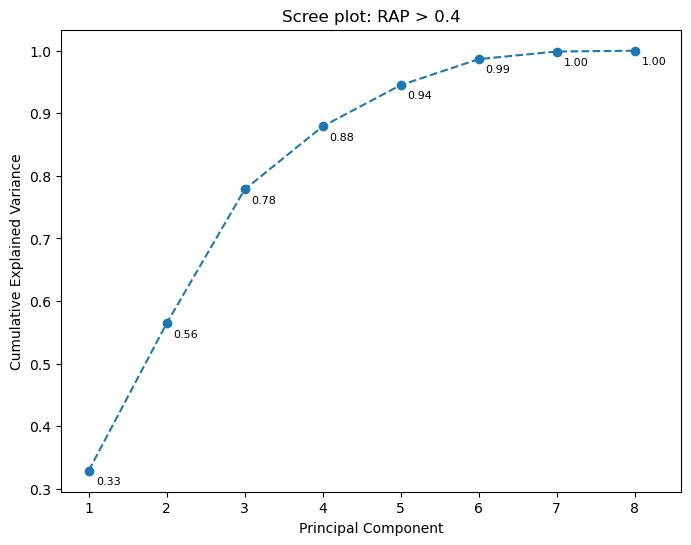

Explained Variance Ratio: [0.23034903 0.19141896 0.15693082 0.11128248 0.0770256  0.06420364
 0.05415603 0.04090958 0.03529231 0.02028475 0.01270204 0.00314824
 0.00167783 0.0006187 ]
Cumulative Explained Variance: [0.23034903 0.42176799 0.57869881 0.68998129 0.76700688 0.83121052
 0.88536655 0.92627613 0.96156844 0.98185318 0.99455523 0.99770346
 0.9993813  1.        ]


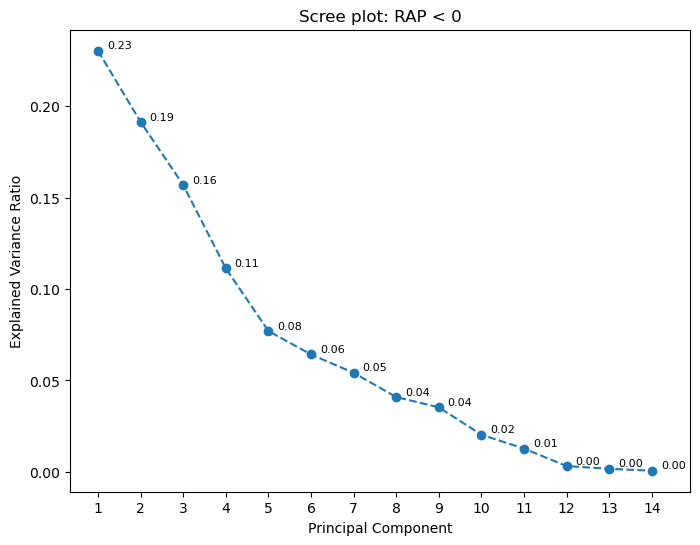

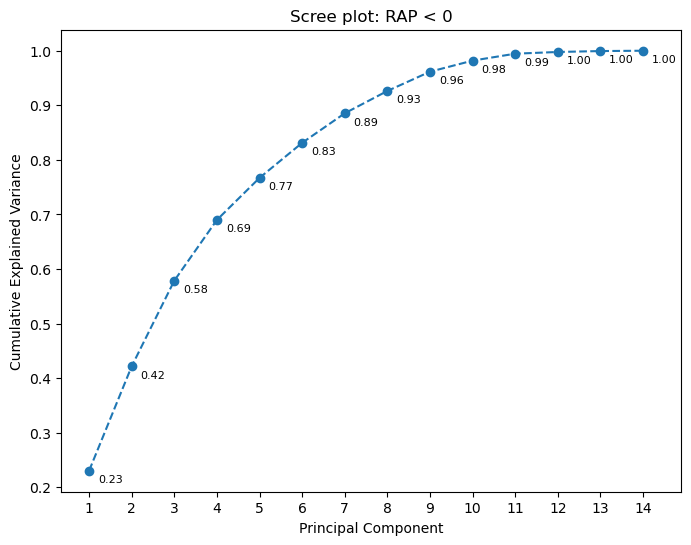

Explained Variance Ratio: [0.22477181 0.16227054 0.14553837 0.11214108 0.10965299 0.07502948
 0.0548542  0.048853   0.03222307 0.02089238 0.00826928 0.00294612
 0.0020874  0.00047028]
Cumulative Explained Variance: [0.22477181 0.38704235 0.53258072 0.6447218  0.75437479 0.82940427
 0.88425847 0.93311147 0.96533454 0.98622693 0.99449621 0.99744233
 0.99952972 1.        ]


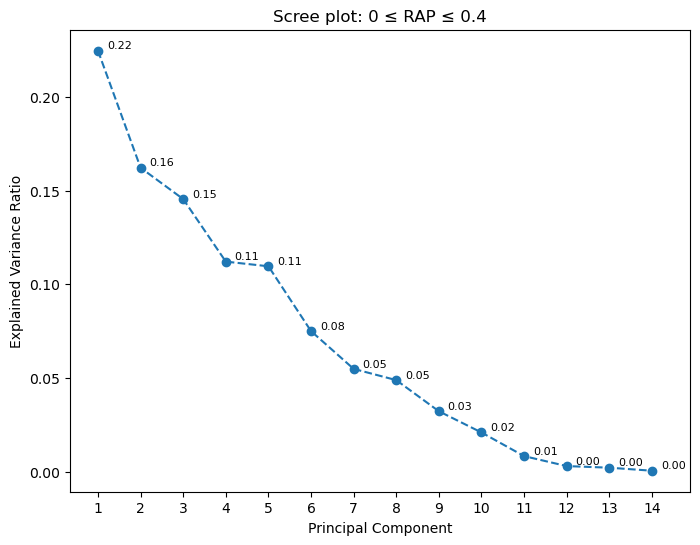

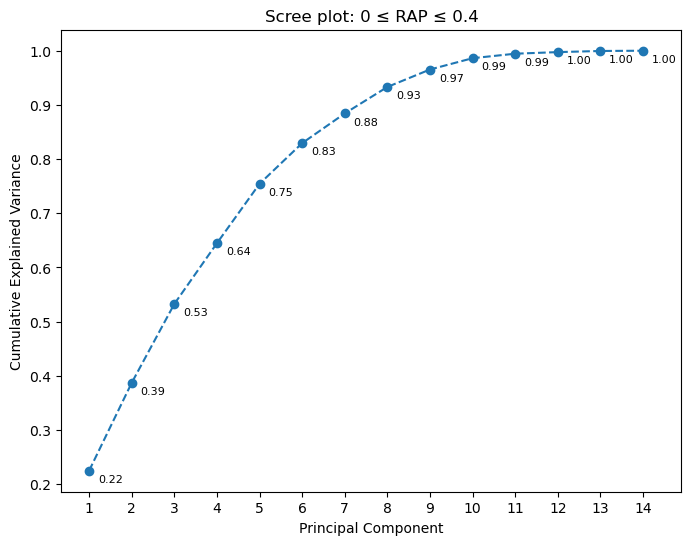

Explained Variance Ratio: [0.23143188 0.1801363  0.14133298 0.1244995  0.10630817 0.0573846
 0.04542053 0.03250442 0.03069252 0.0227413  0.01677043 0.00514211
 0.00474637 0.0008889 ]
Cumulative Explained Variance: [0.23143188 0.41156818 0.55290115 0.67740065 0.78370882 0.84109342
 0.88651396 0.91901837 0.94971089 0.97245219 0.98922262 0.99436473
 0.9991111  1.        ]


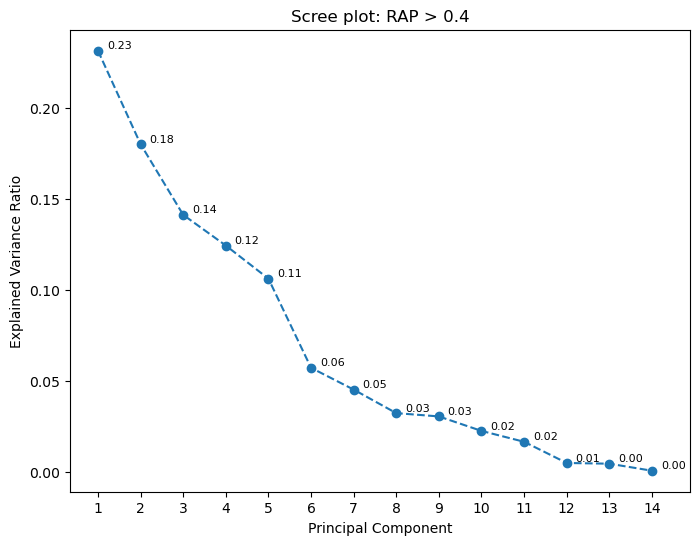

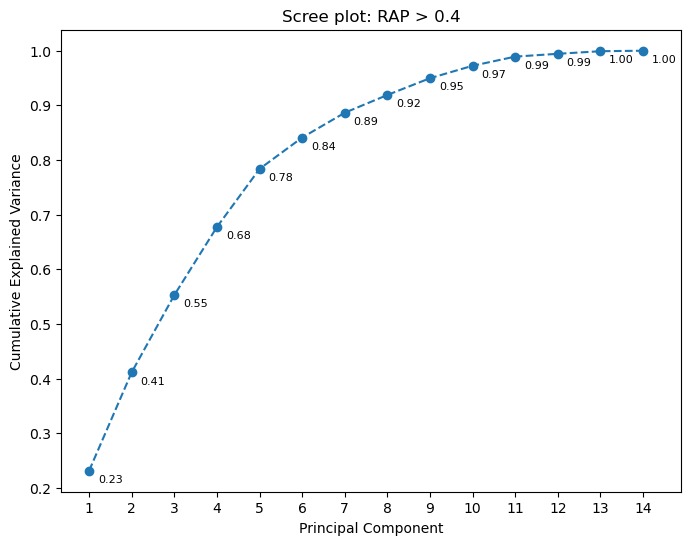

Explained Variance Ratio: [0.32257886 0.19431217 0.14219688 0.11132378 0.09095045 0.06458706
 0.06098244 0.01077731 0.00229105]
Cumulative Explained Variance: [0.32257886 0.51689103 0.65908792 0.77041169 0.86136214 0.9259492
 0.98693165 0.99770895 1.        ]


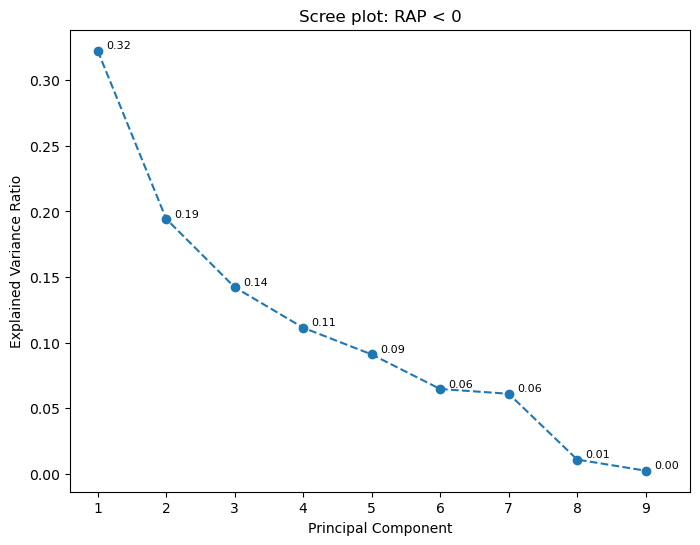

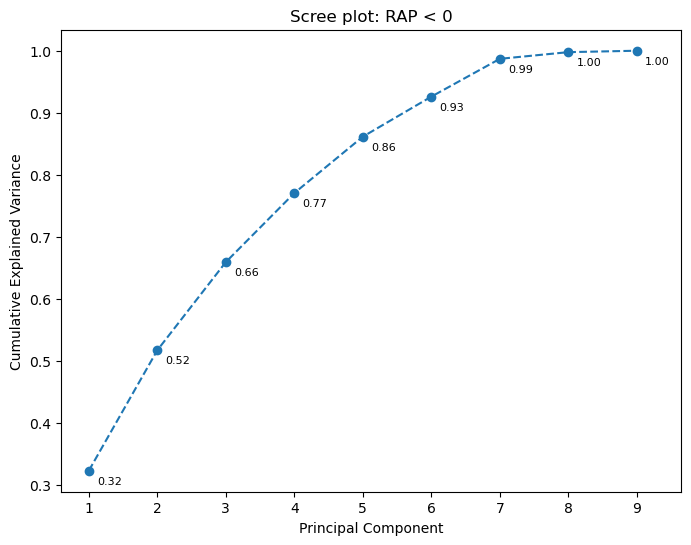

Explained Variance Ratio: [0.2642416  0.2210401  0.15149503 0.11534458 0.10398294 0.07432124
 0.06171937 0.00735649 0.00049865]
Cumulative Explained Variance: [0.2642416  0.48528169 0.63677672 0.7521213  0.85610425 0.93042549
 0.99214486 0.99950135 1.        ]


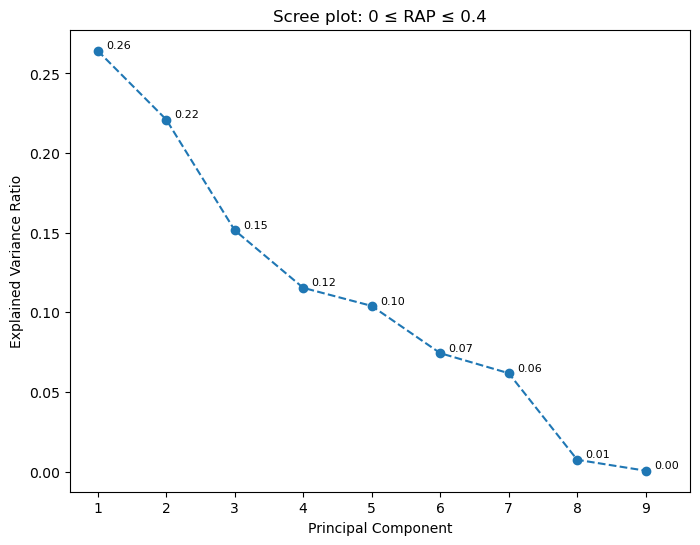

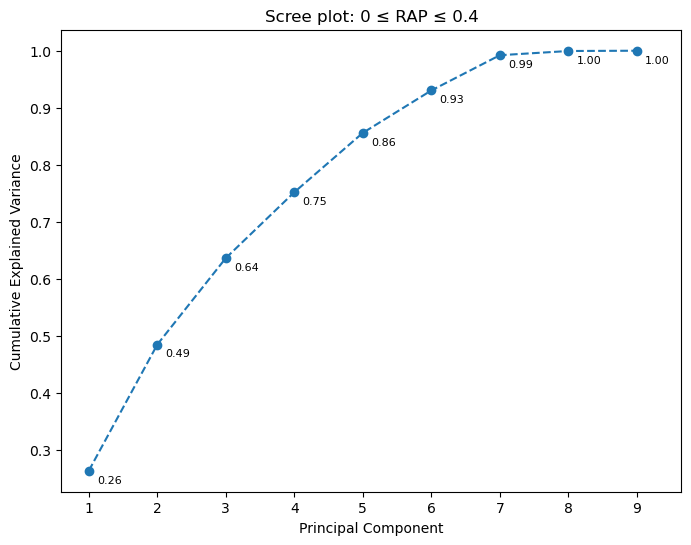

Explained Variance Ratio: [0.29459677 0.20875141 0.17977908 0.11019984 0.10347697 0.05982018
 0.03236715 0.01042447 0.00058413]
Cumulative Explained Variance: [0.29459677 0.50334818 0.68312726 0.7933271  0.89680407 0.95662425
 0.9889914  0.99941587 1.        ]


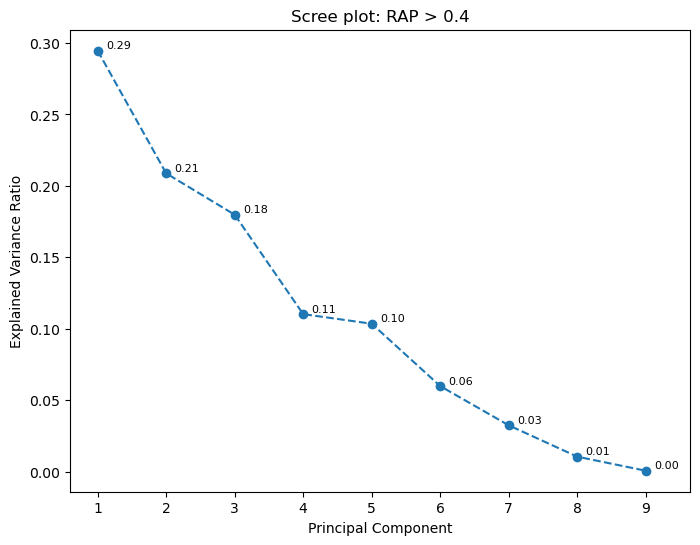

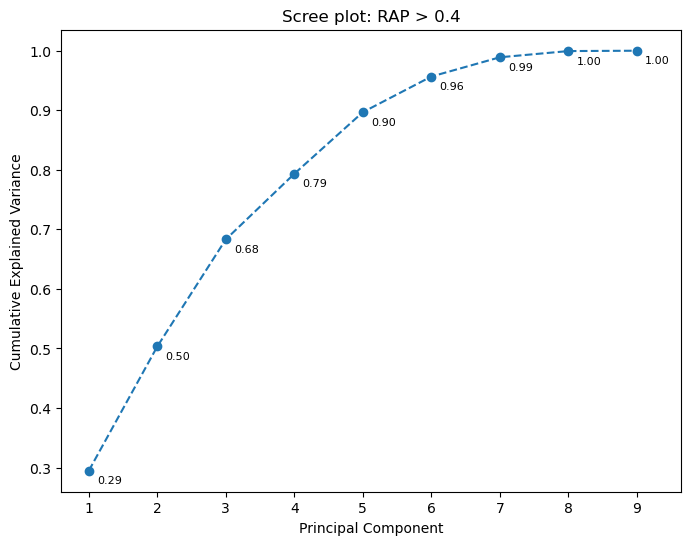

Resolution in progress:  H
---------------------------------------------------------------------


Explained Variance Ratio: [0.33096925 0.19824656 0.16717504 0.12534637 0.10386968 0.06416988
 0.00917507 0.00104814]
Cumulative Explained Variance: [0.33096925 0.52921581 0.69639085 0.82173722 0.9256069  0.98977678
 0.99895186 1.        ]


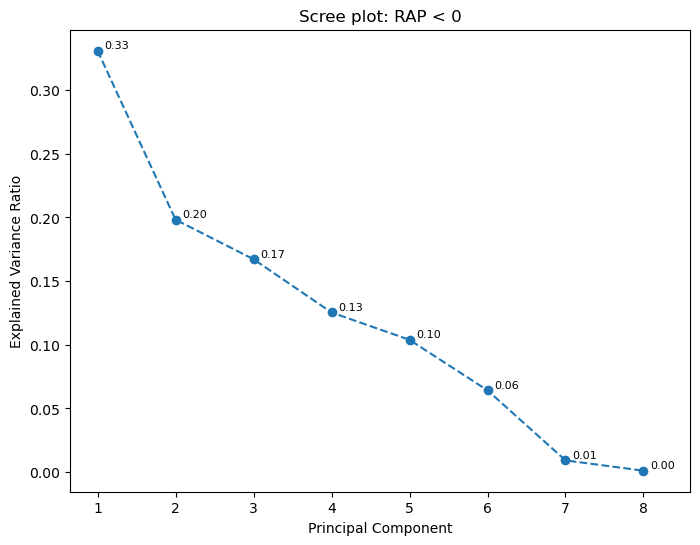

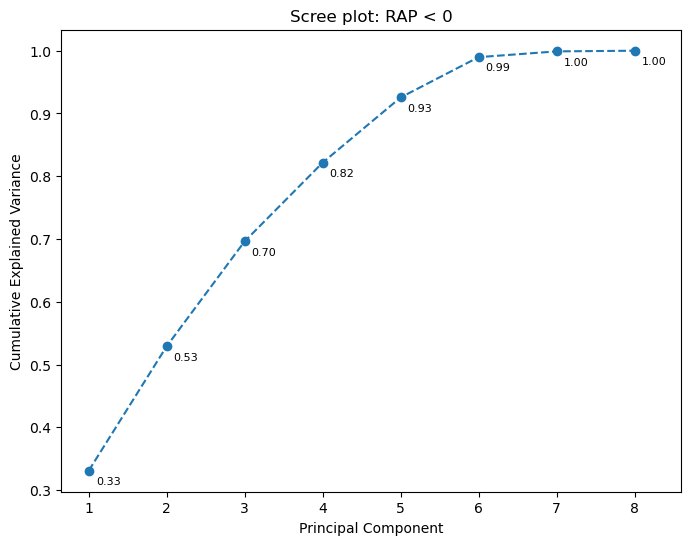

Explained Variance Ratio: [0.27971148 0.240291   0.17411512 0.12441321 0.1020286  0.07151356
 0.0065402  0.00138683]
Cumulative Explained Variance: [0.27971148 0.52000247 0.69411759 0.8185308  0.9205594  0.99207297
 0.99861317 1.        ]


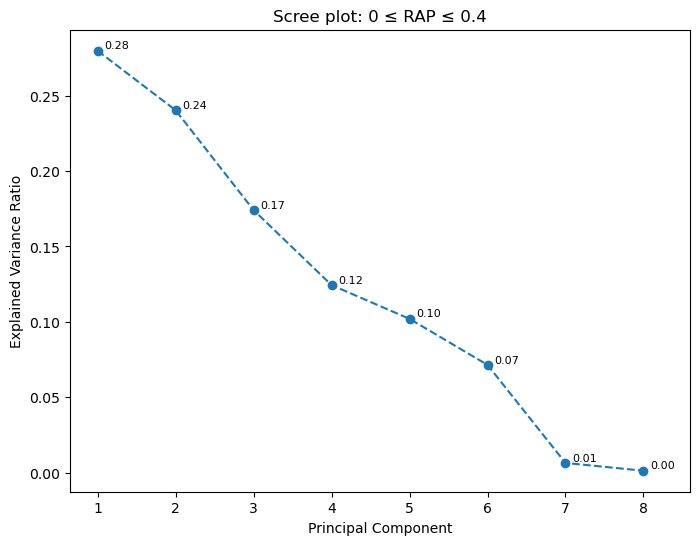

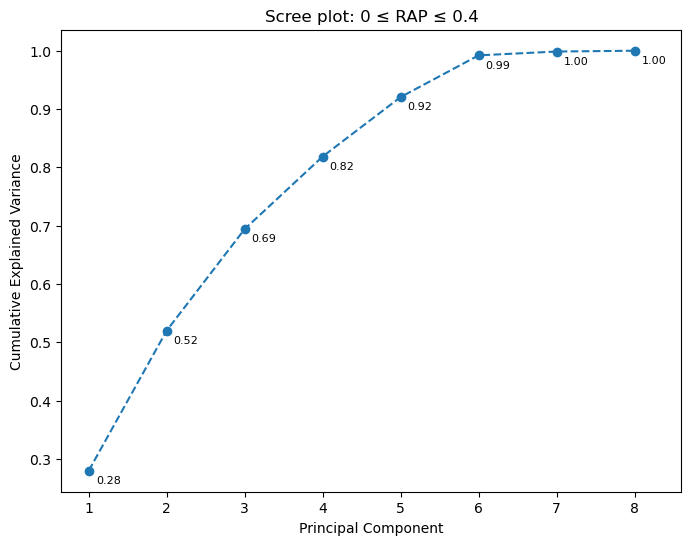

Explained Variance Ratio: [0.33150485 0.2369518  0.21283311 0.09785048 0.06613328 0.04150941
 0.01189247 0.00132461]
Cumulative Explained Variance: [0.33150485 0.56845664 0.78128975 0.87914024 0.94527352 0.98678292
 0.99867539 1.        ]


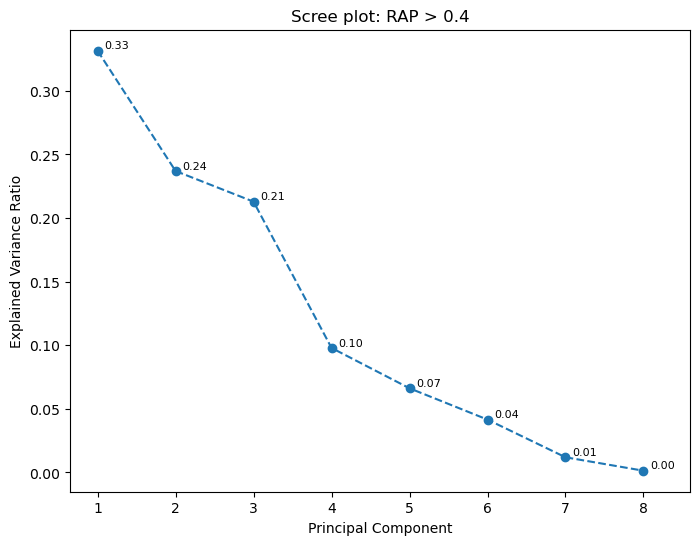

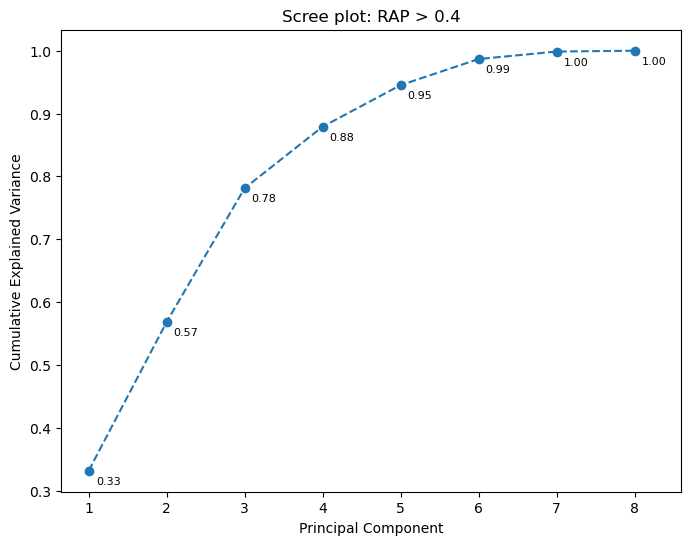

Explained Variance Ratio: [0.24429925 0.22328674 0.17613937 0.10126912 0.05764793 0.05595937
 0.04875374 0.03967423 0.02260468 0.01510578 0.01169181 0.0019859
 0.00126545 0.00031665]
Cumulative Explained Variance: [0.24429925 0.46758599 0.64372536 0.74499448 0.80264241 0.85860177
 0.90735551 0.94702974 0.96963442 0.98474019 0.996432   0.9984179
 0.99968335 1.        ]


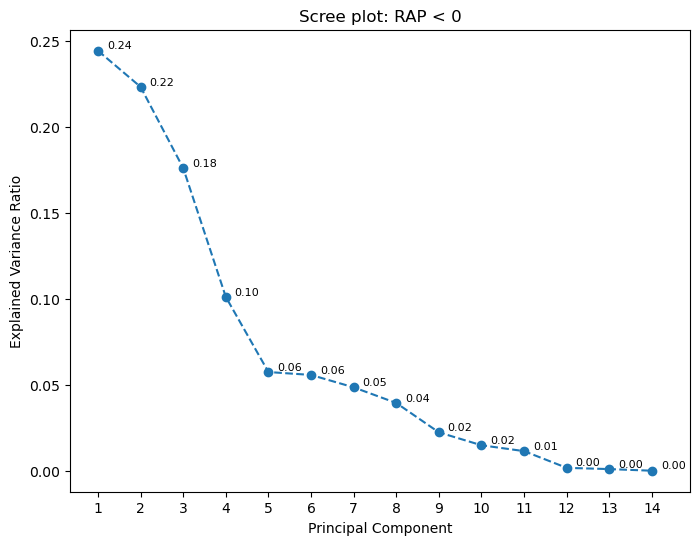

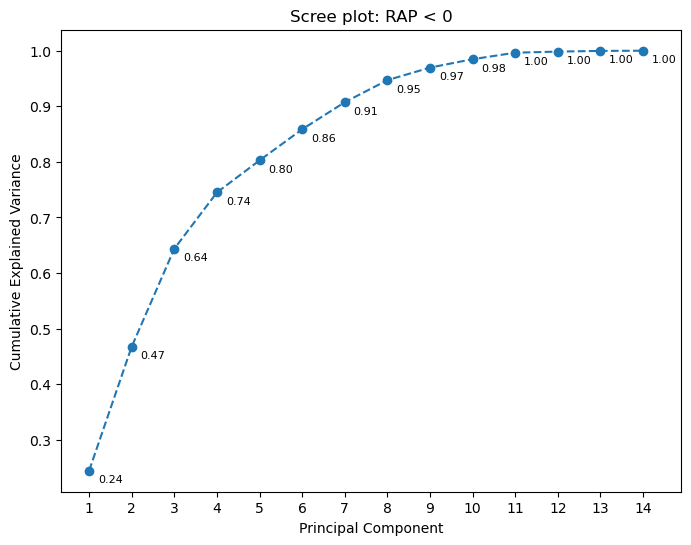

Explained Variance Ratio: [0.22763979 0.17216124 0.14660213 0.11272786 0.10046727 0.07433185
 0.05357587 0.04713292 0.03083484 0.01986765 0.00927703 0.00301663
 0.00191914 0.0004458 ]
Cumulative Explained Variance: [0.22763979 0.39980103 0.54640316 0.65913102 0.75959829 0.83393013
 0.887506   0.93463891 0.96547376 0.98534141 0.99461843 0.99763506
 0.9995542  1.        ]


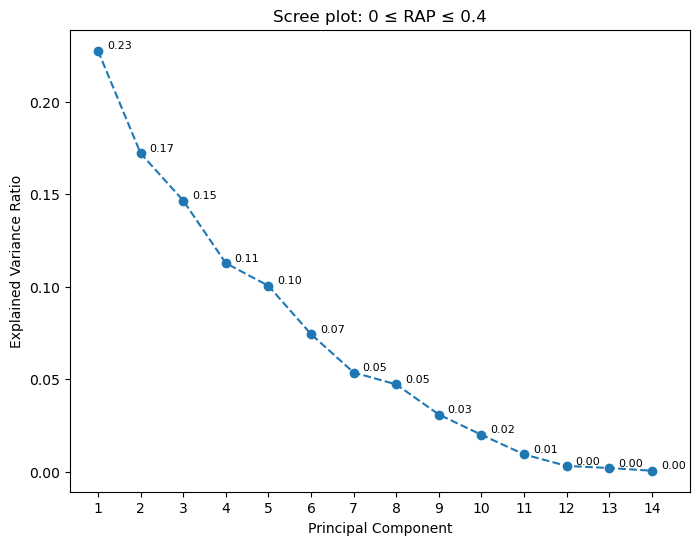

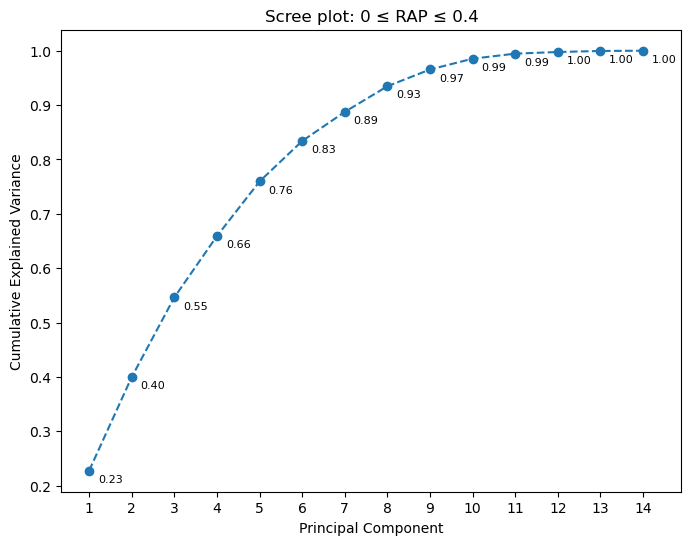

Explained Variance Ratio: [0.23293345 0.1801695  0.14363624 0.1245288  0.10563108 0.05548021
 0.04413892 0.03239276 0.03051364 0.02302161 0.01676694 0.00513511
 0.00457955 0.00107219]
Cumulative Explained Variance: [0.23293345 0.41310295 0.55673919 0.68126799 0.78689907 0.84237928
 0.8865182  0.91891096 0.9494246  0.97244621 0.98921315 0.99434826
 0.99892781 1.        ]


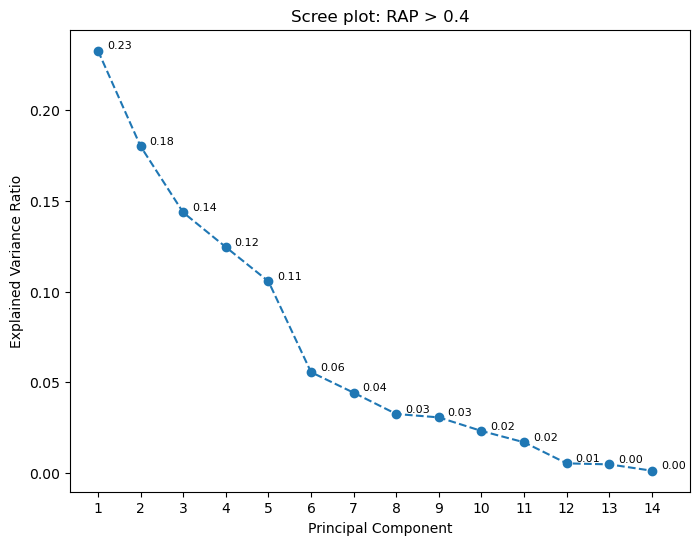

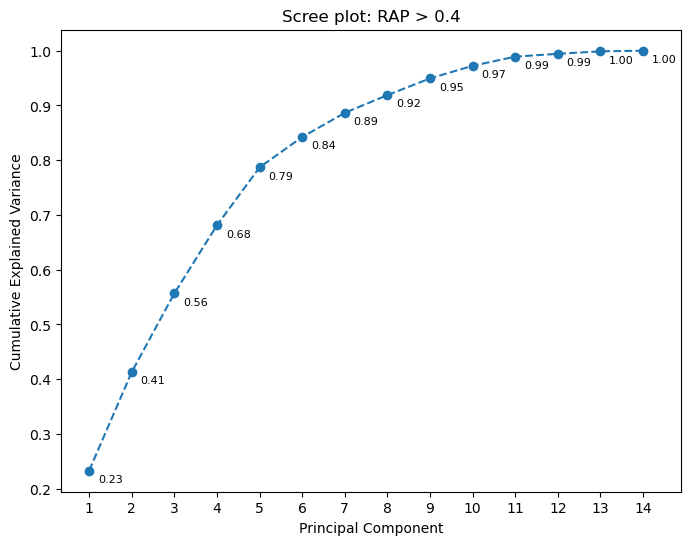

Explained Variance Ratio: [0.32268125 0.20699408 0.14058745 0.11018951 0.09055227 0.06145036
 0.05488365 0.01124777 0.00141366]
Cumulative Explained Variance: [0.32268125 0.52967533 0.67026278 0.78045229 0.87100456 0.93245492
 0.98733857 0.99858634 1.        ]


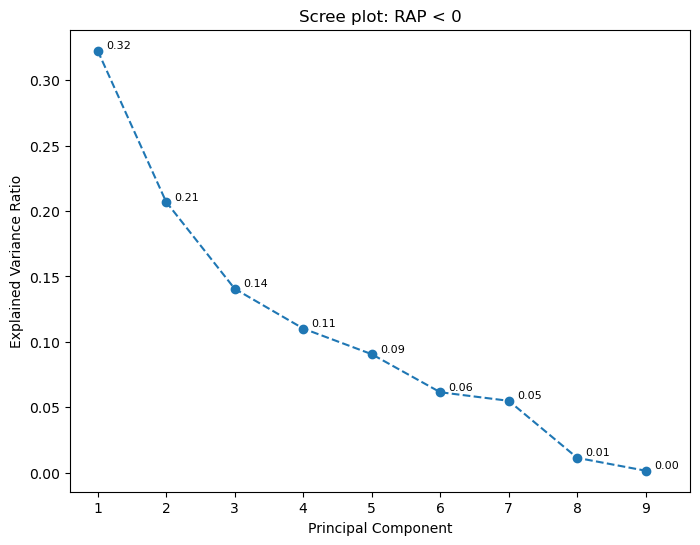

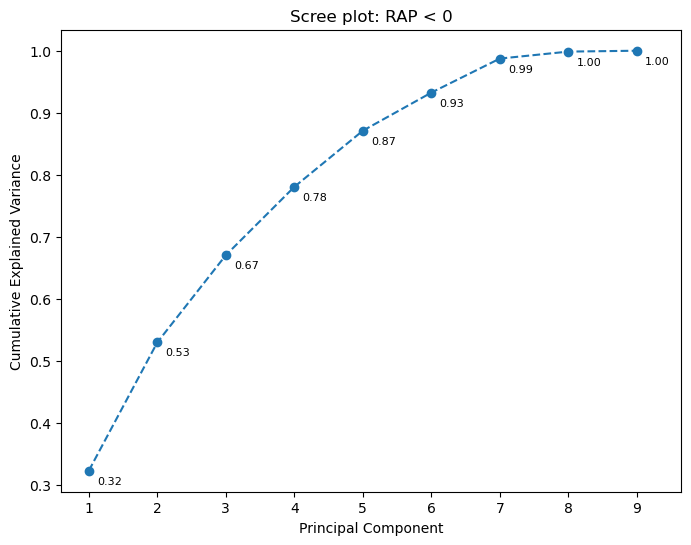

Explained Variance Ratio: [0.26112851 0.22526532 0.15636385 0.11555996 0.10285585 0.07218772
 0.05917501 0.00644572 0.00101805]
Cumulative Explained Variance: [0.26112851 0.48639383 0.64275769 0.75831765 0.8611735  0.93336122
 0.99253623 0.99898195 1.        ]


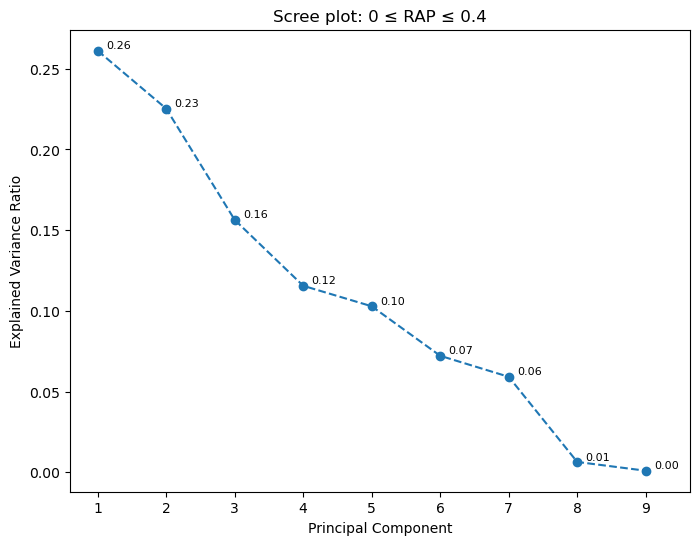

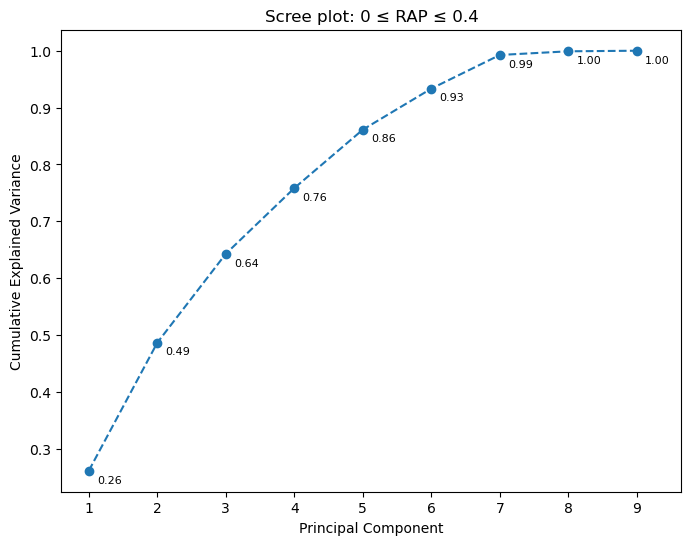

Explained Variance Ratio: [0.29729001 0.20532042 0.18123265 0.11035605 0.1033096  0.05968609
 0.03201185 0.01020025 0.00059308]
Cumulative Explained Variance: [0.29729001 0.50261044 0.68384308 0.79419913 0.89750873 0.95719482
 0.98920666 0.99940692 1.        ]


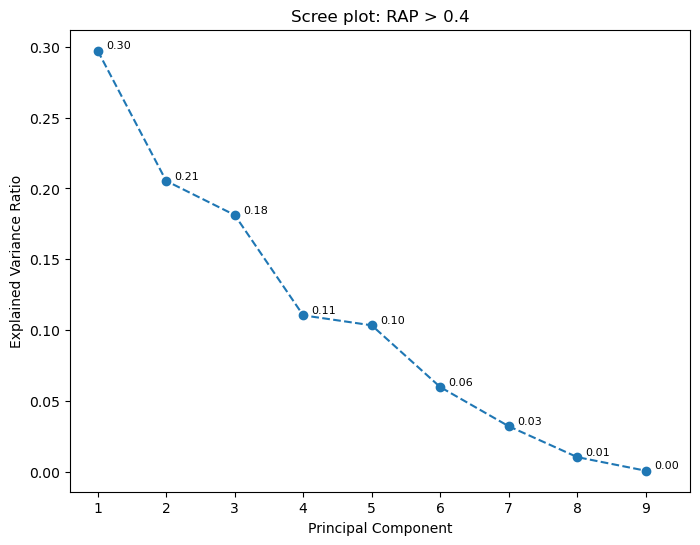

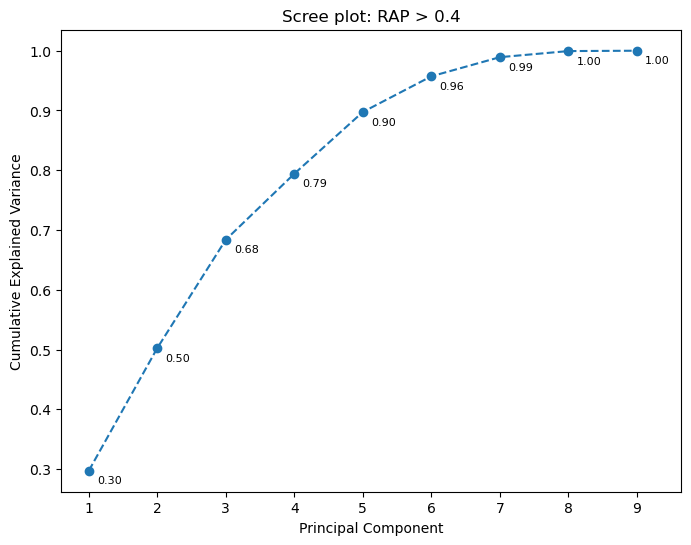

Execution time:  158.72732140000153 seconds


In [21]:
tic = timer()

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

for resolution_index, resolution in enumerate(resolutions):
    print("Resolution in progress: ", resolution)
    print("---------------------------------------------------------------------")
    print("\n")

    for index, file_segment in enumerate(df_all):

        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)

        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        # Scaling the data
        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Splitting data into three segments
        breakpoints = [0, 0.4]

        segment1 = file_segment_edited[file_segment_edited['RAP'] < breakpoints[0]]
        segment2 = file_segment_edited[(file_segment_edited['RAP'] >= breakpoints[0]) & (file_segment_edited['RAP'] <= breakpoints[1])]
        segment3 = file_segment_edited[file_segment_edited['RAP'] > breakpoints[1]]

        segments = [segment1, segment2, segment3]

        for segment_no, segment in enumerate(segments):
            visualizing_scree_plots_using_PCA(segment, segment_no, resolution, file_labels[index], labels)
            
tac = timer()
print("Execution time: ",tac-tic, "seconds")

In [12]:
def visualizing_biplots_using_PCA(segment, segment_no, resolution, file_label, labels):

    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment)

    # Applying PCA
    pca = PCA()
    pca.fit(data_scaled)
    pca_components = pca.transform(data_scaled)

    loading_vectors = pca.components_.T

    plt.figure(figsize=(8, 6))

    # Plot the scores (first two principal components)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plot_title = 'PCA biplot: ' + labels[segment_no]
    plt.title(plot_title)
    
    for i, var in enumerate(segment.columns):  
        scale_factor = 0.05
        # Plot the arrow (loading vector)
        plt.arrow(0, 0, loading_vectors[i, 2], loading_vectors[i, 3], 
                  color='black', head_width=0.015)
        angle_rad = np.arctan2(loading_vectors[i, 2], loading_vectors[i, 3])
        vector_length = np.linalg.norm(loading_vectors[i])

        x_add = (0.05 + 0.04 * vector_length) * np.cos(angle_rad)  # Offset in x-direction
        y_add = (0.05 + 0.04 * vector_length) * np.sin(angle_rad)  # Offset in y-direction

        if index == 1:
            if var == 'RSO2_R':
                scale_factor = 0.1

            if var == 'COxA_L' or  var == 'COxA_R':
                scale_factor = 0.2

            if var == 'COx_L' or  var == 'COx_R':
                scale_factor = 0.1

        if index == 2:
            if var == 'RAP':
                x_add += 0.1 

    # Extend the label position further away
        label_x = loading_vectors[i, 2] + scale_factor + x_add
        label_y = loading_vectors[i, 3] + scale_factor + y_add

        # Draw a dashed line from arrowhead to text label position
        plt.plot([loading_vectors[i, 2], label_x], [loading_vectors[i, 3], label_y], 
                 linestyle="dashed", color="gray", linewidth=0.8)

        # Annotate text at the end of the dashed line
        plt.text(label_x, label_y, var, fontsize=10, color='black')


    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\PCA_3_4\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_biplot_of_' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()


Resolution in progress:  M
---------------------------------------------------------------------




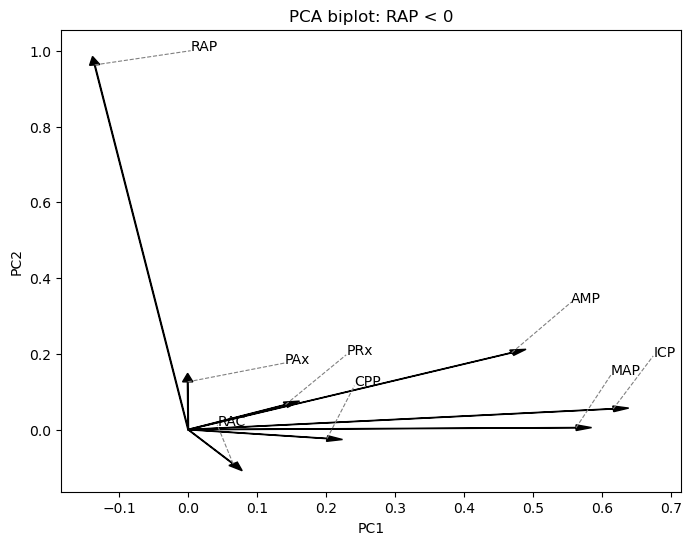

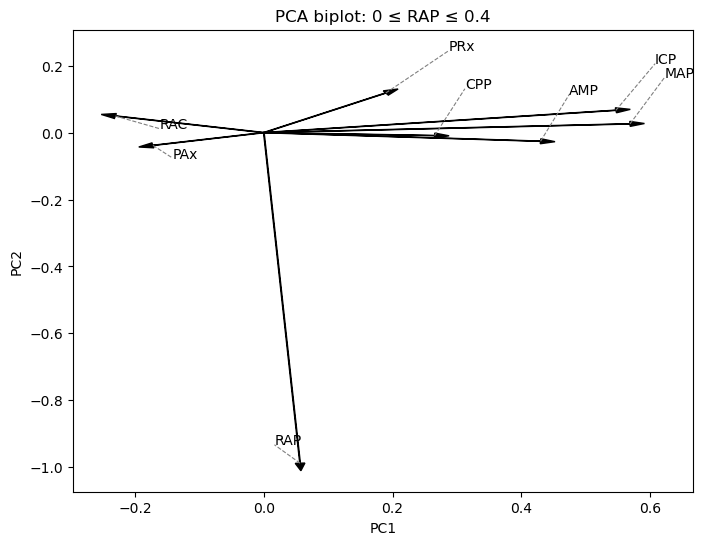

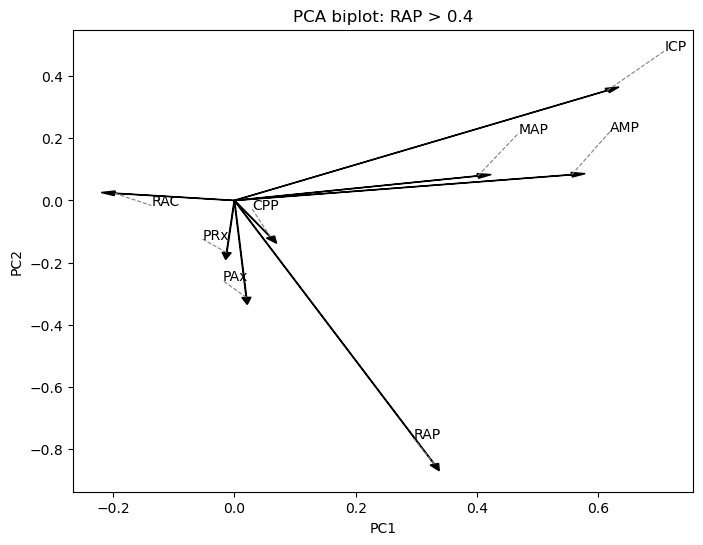

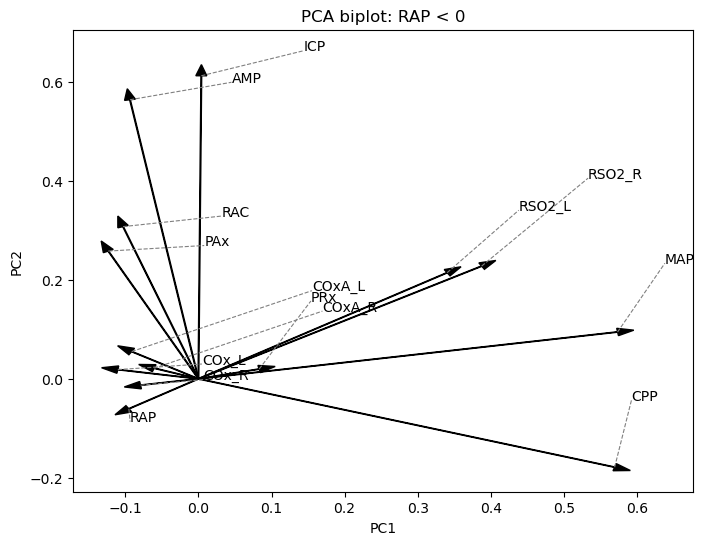

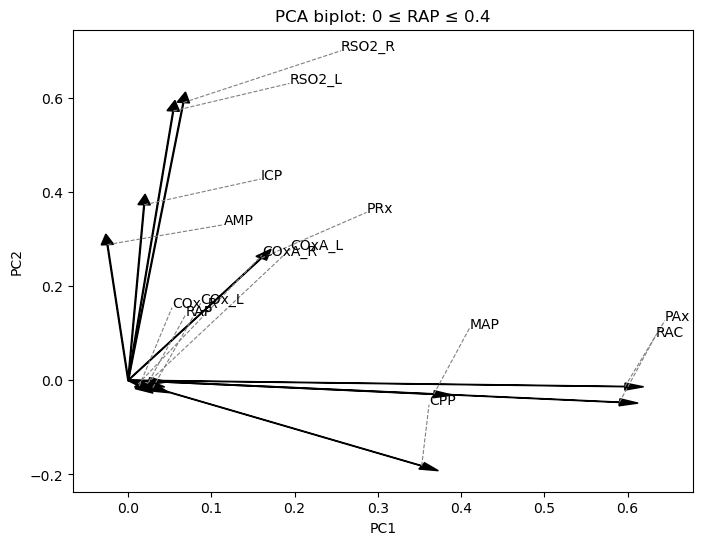

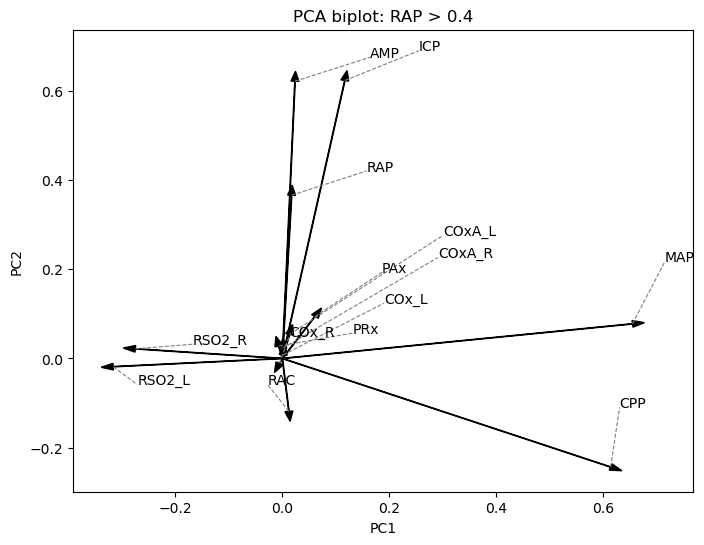

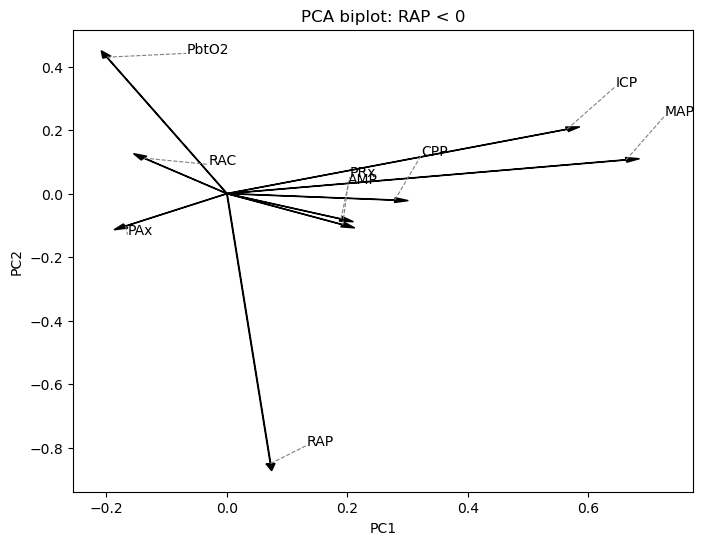

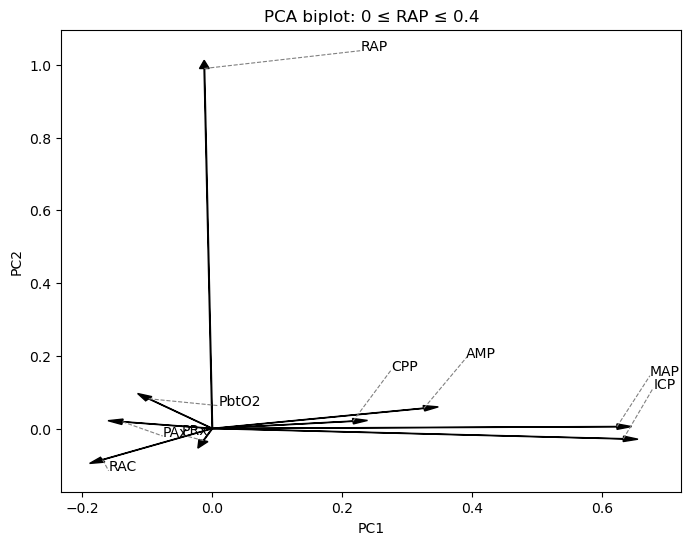

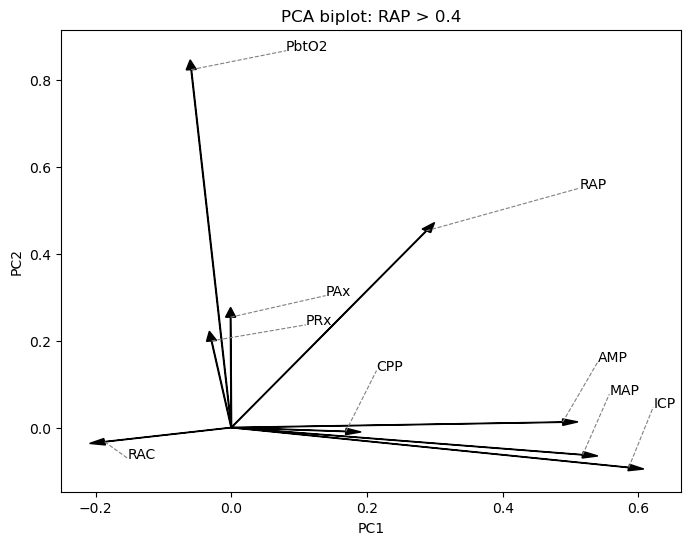

Resolution in progress:  5T
---------------------------------------------------------------------




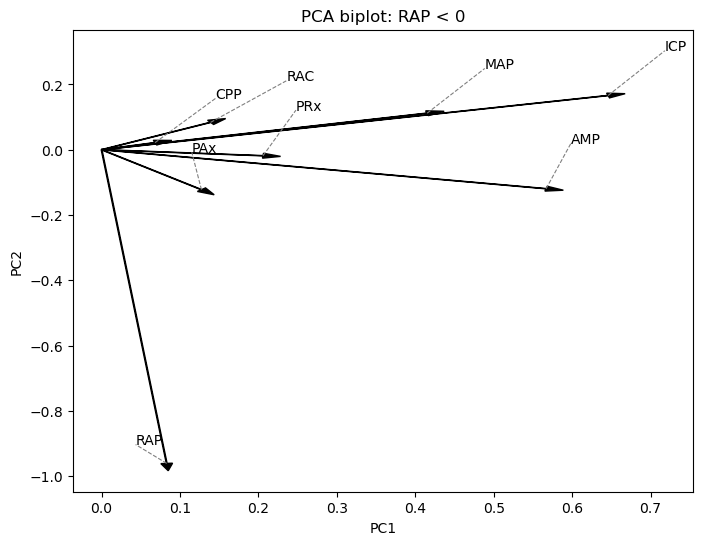

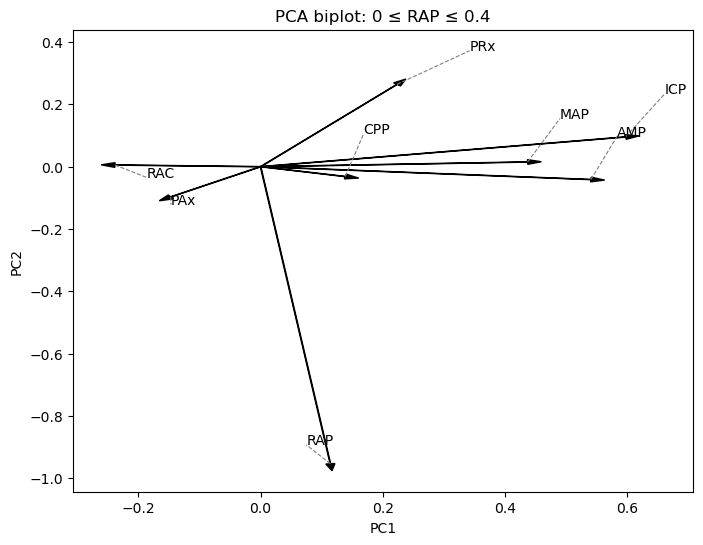

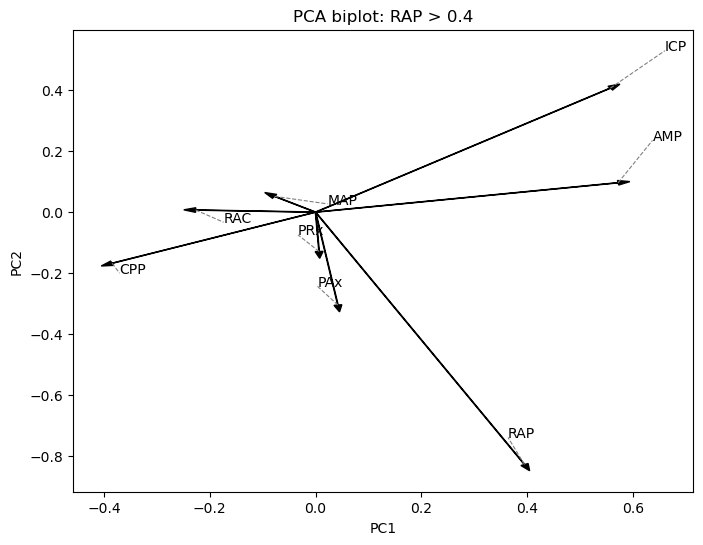

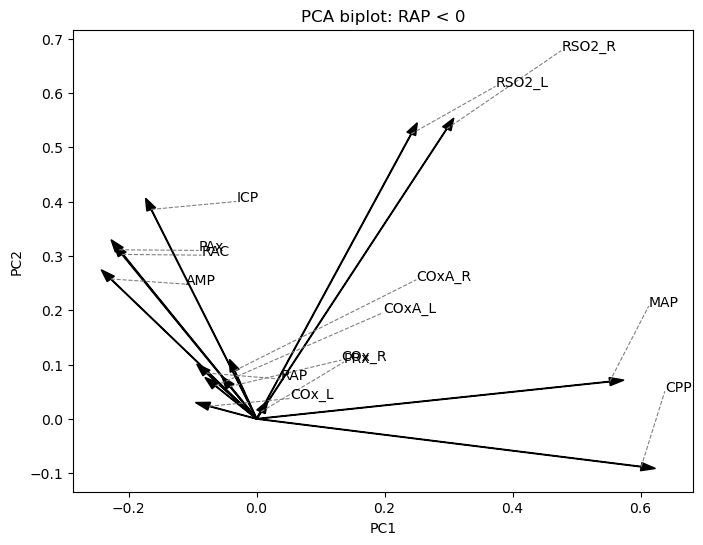

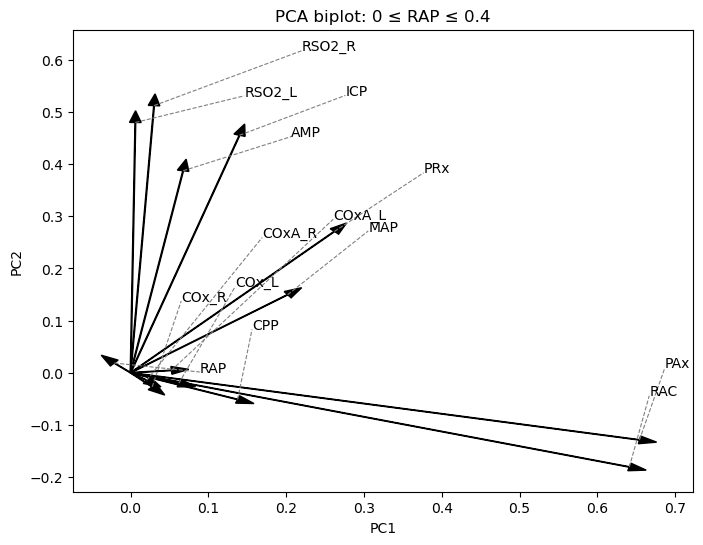

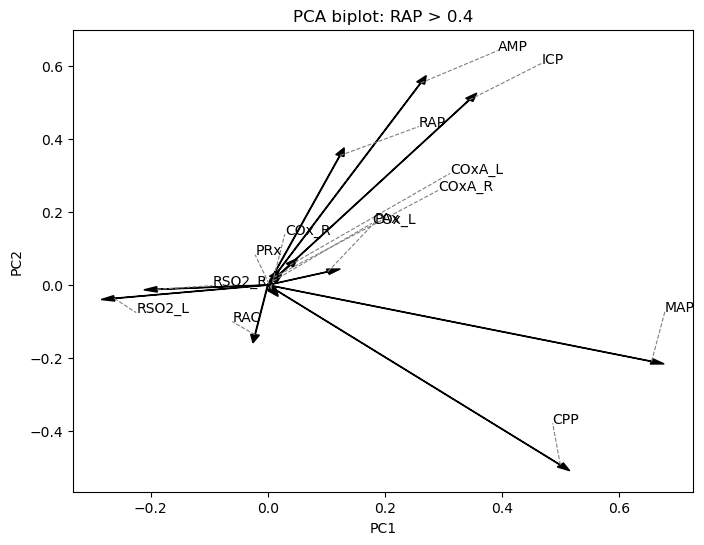

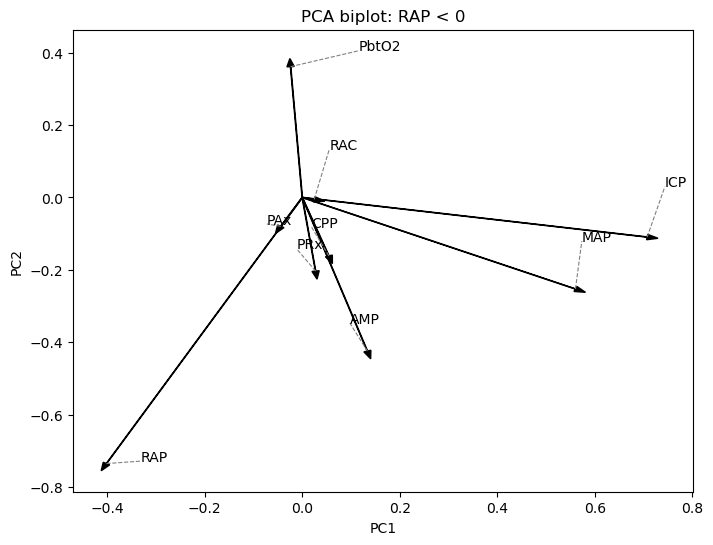

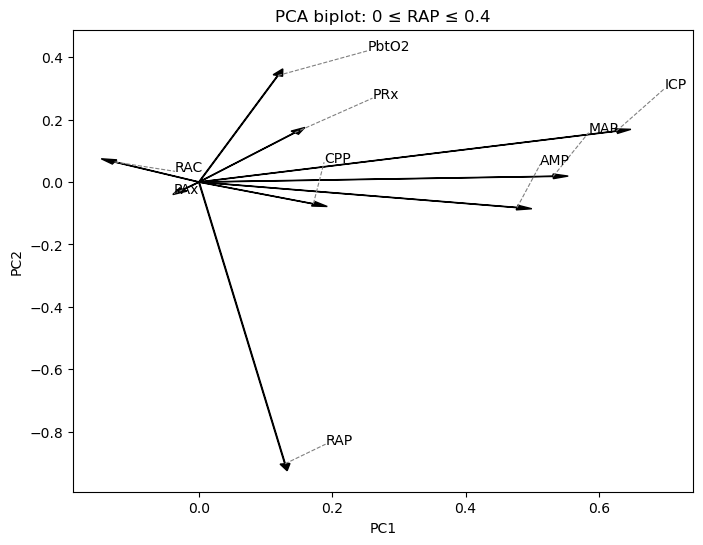

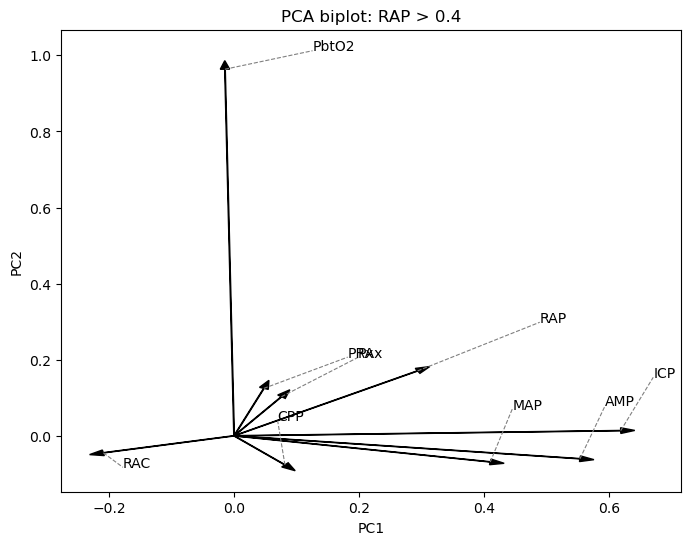

Resolution in progress:  10T
---------------------------------------------------------------------




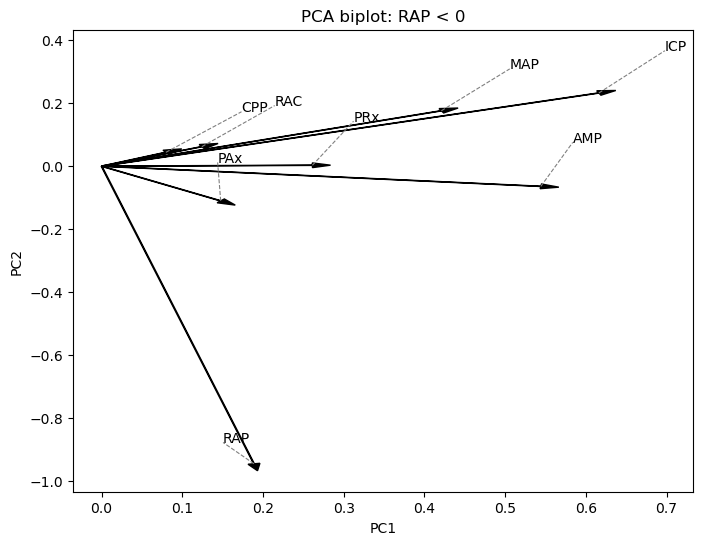

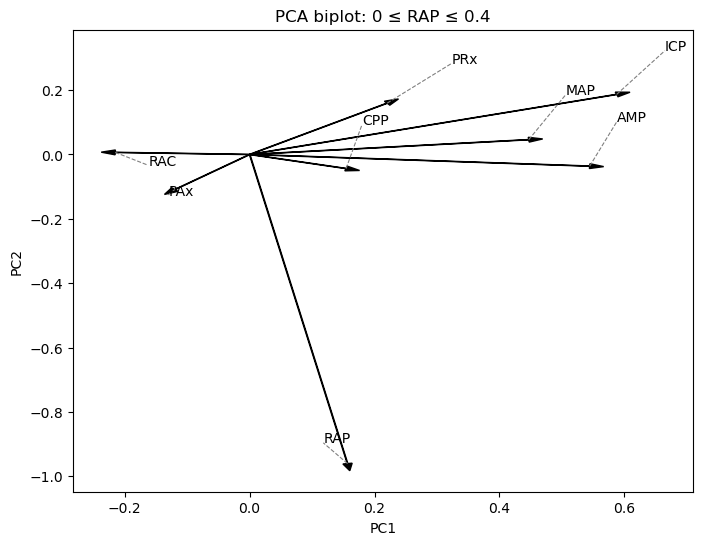

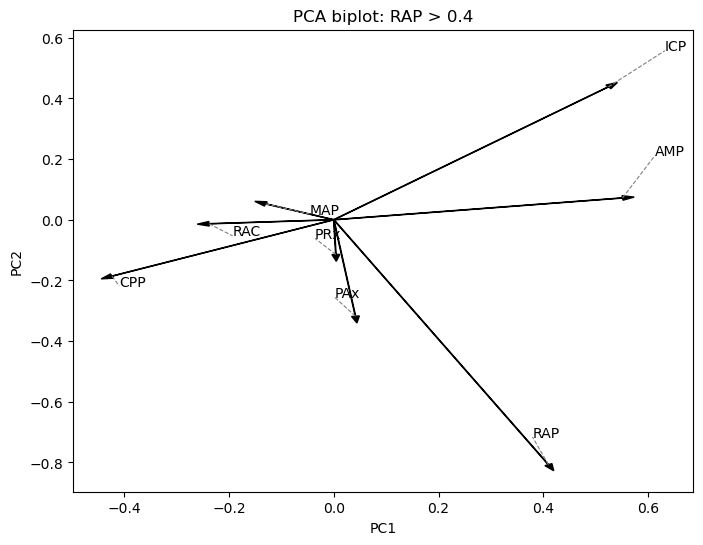

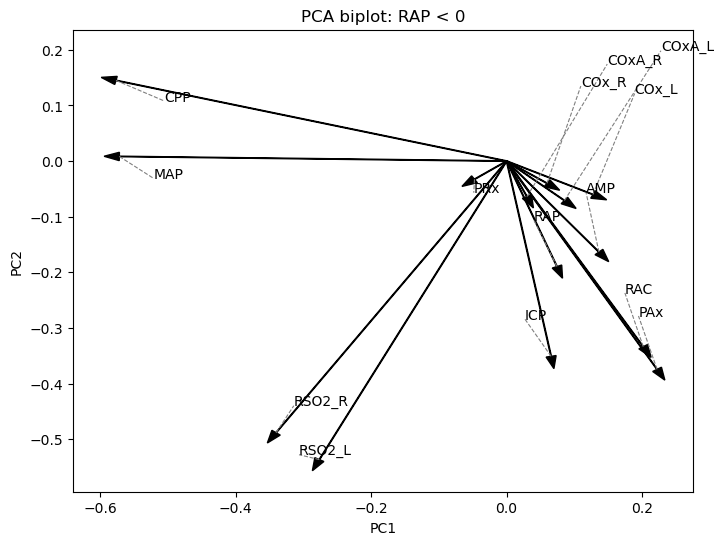

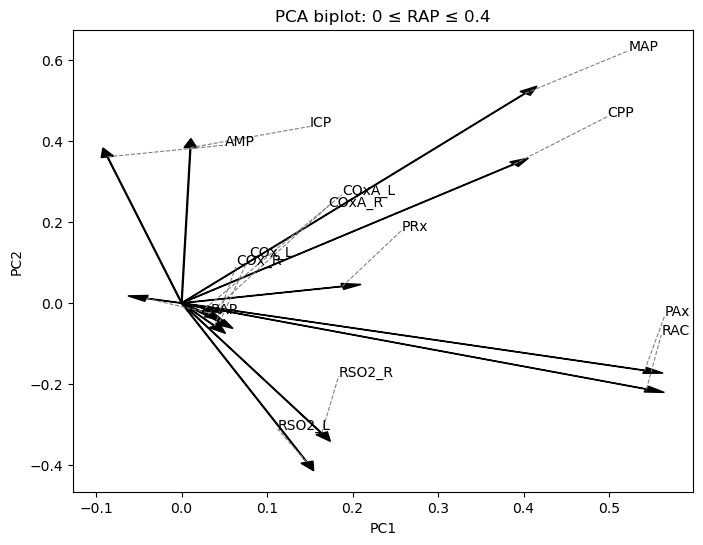

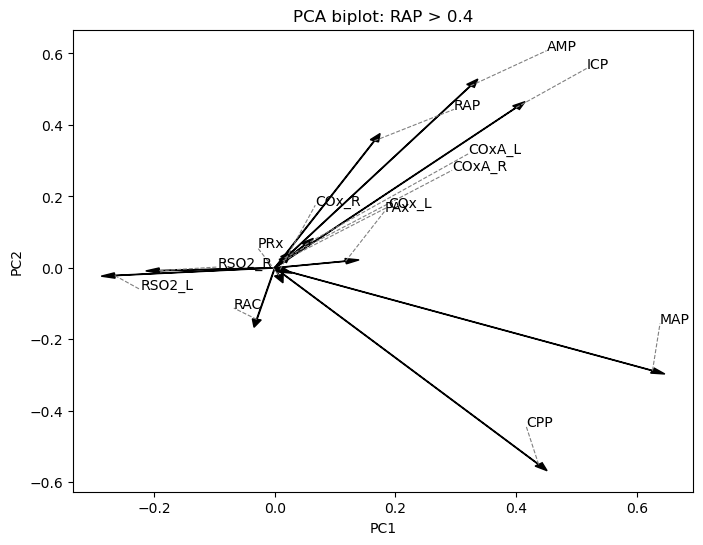

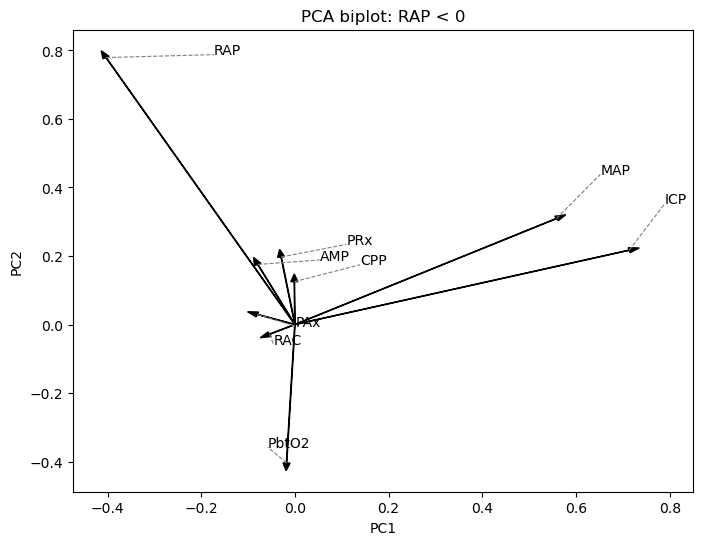

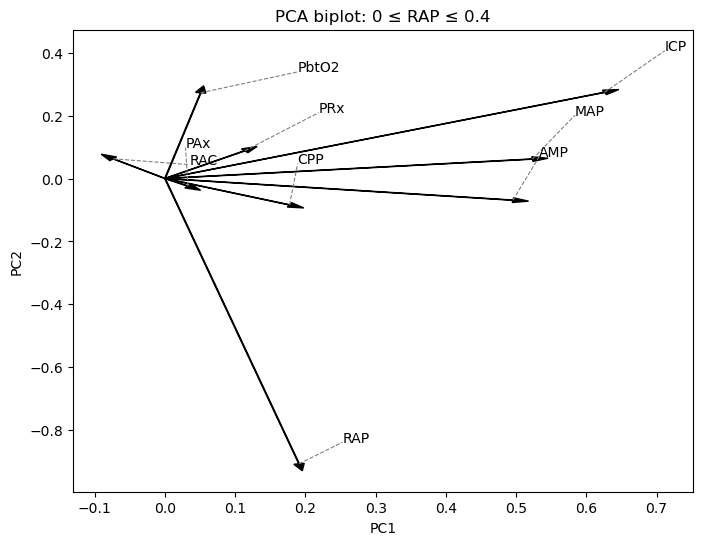

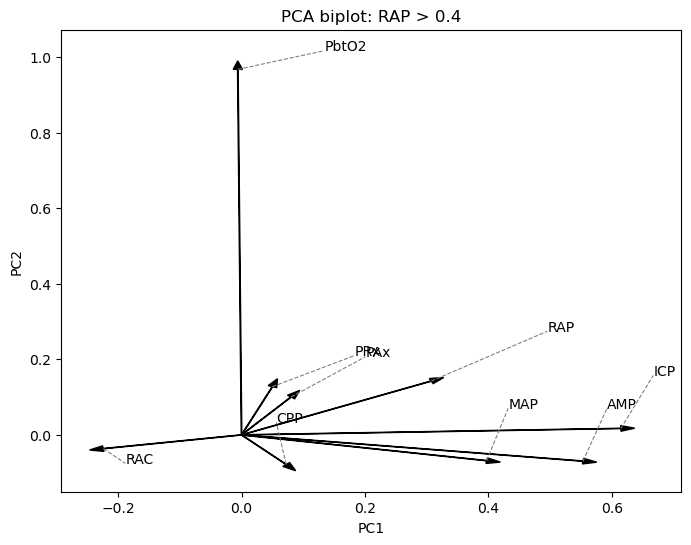

Resolution in progress:  30T
---------------------------------------------------------------------




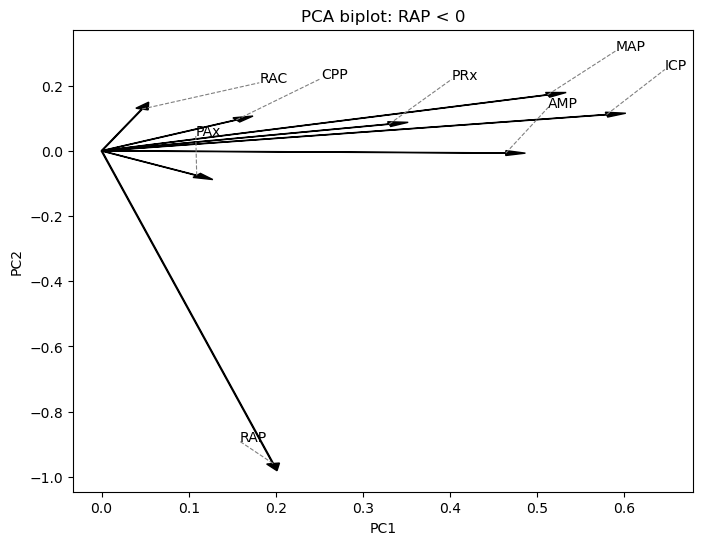

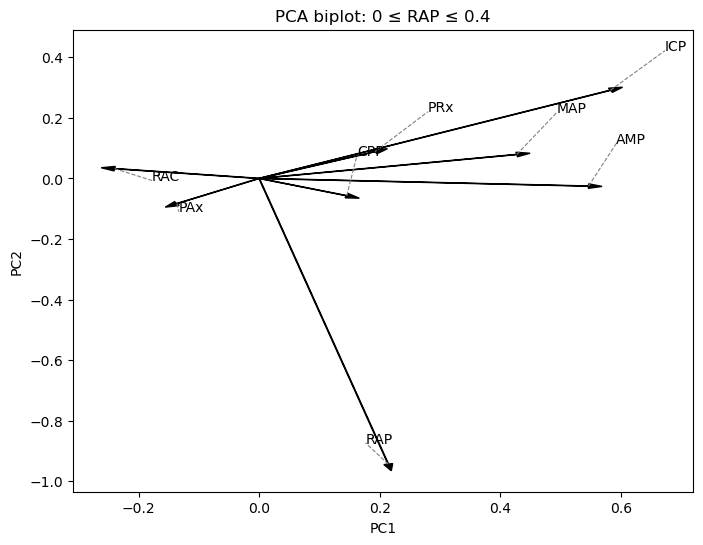

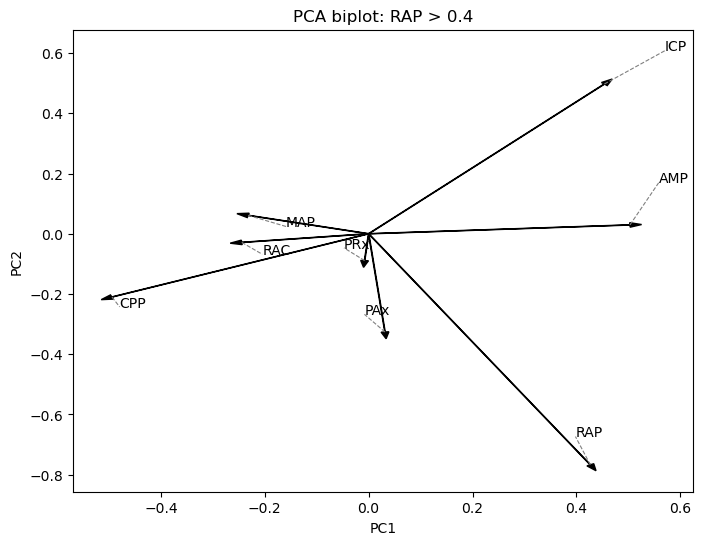

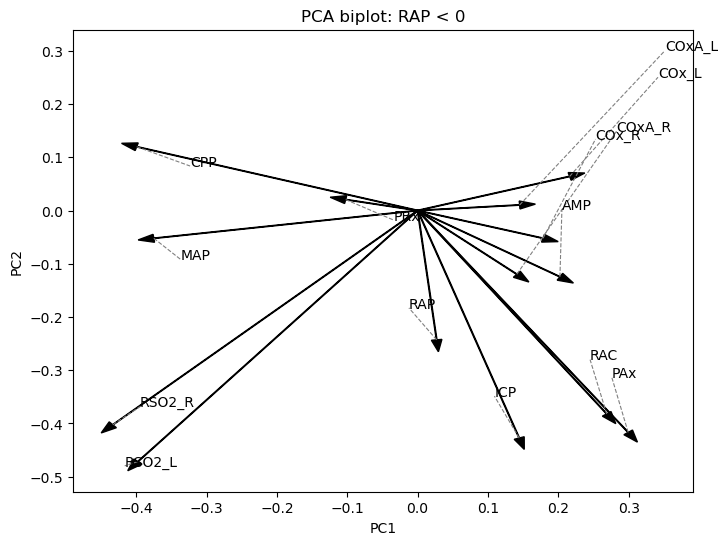

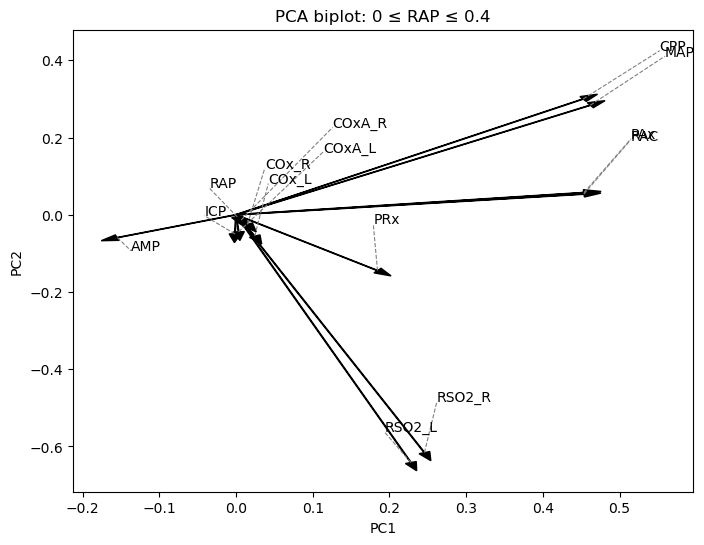

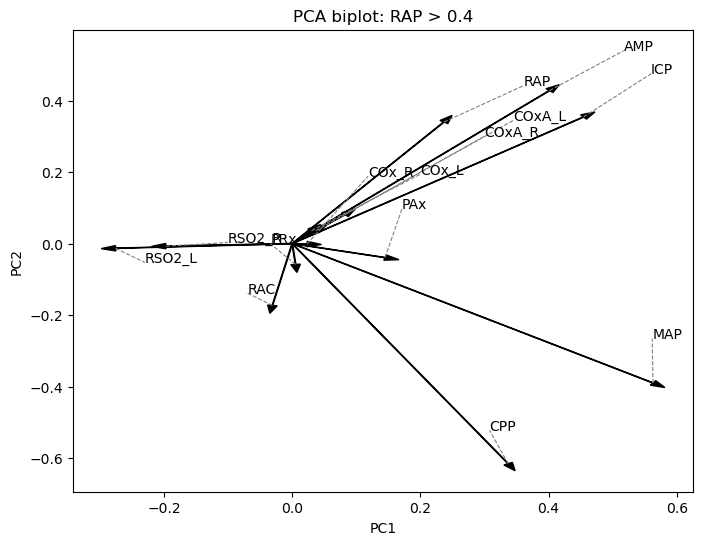

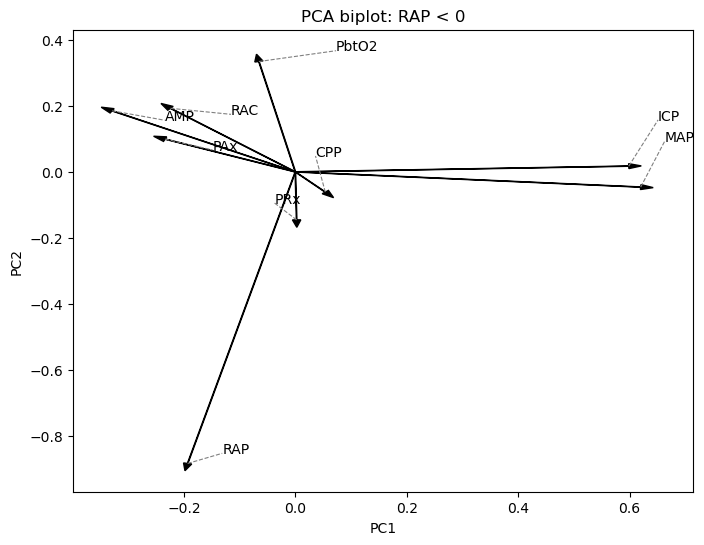

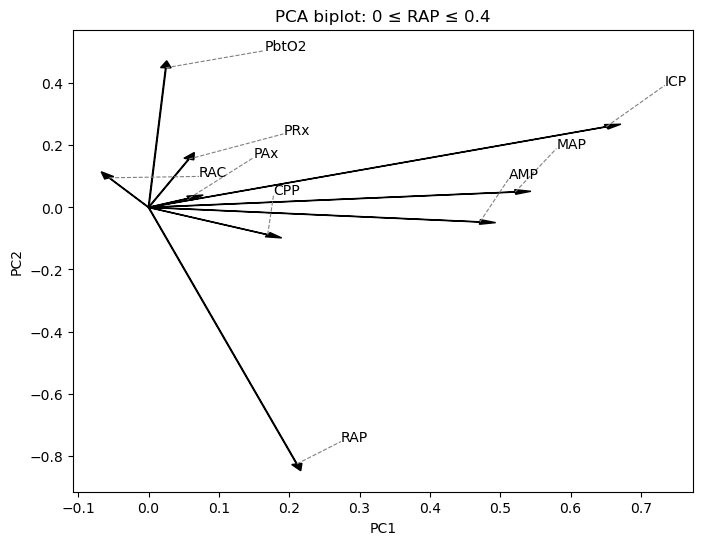

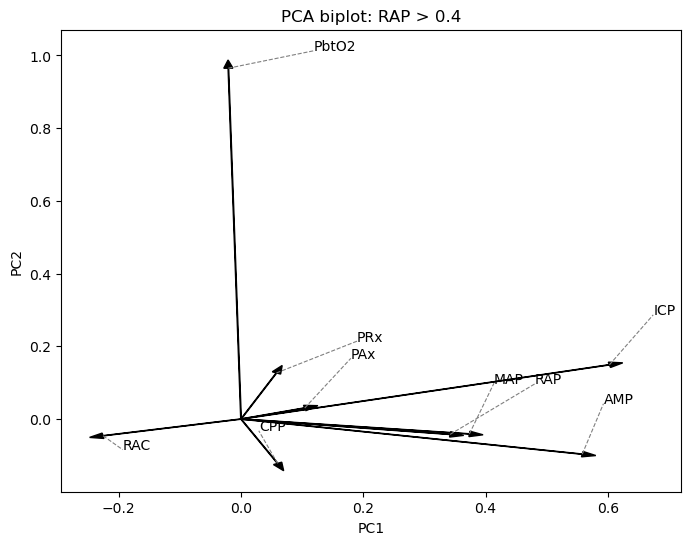

Resolution in progress:  H
---------------------------------------------------------------------




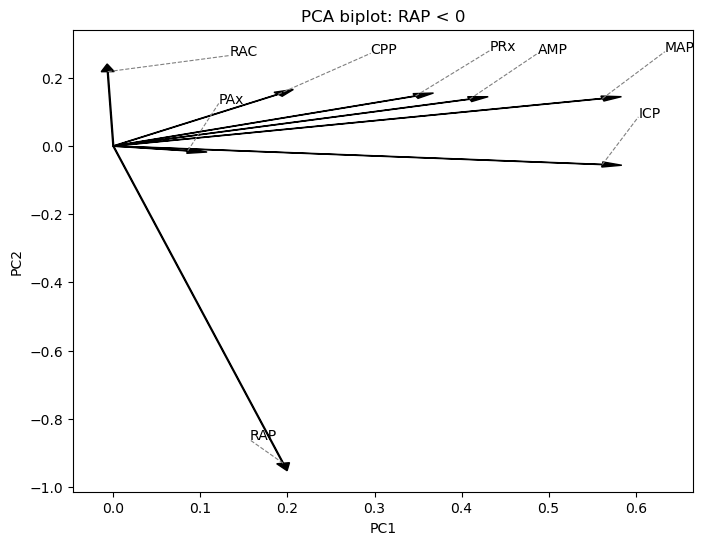

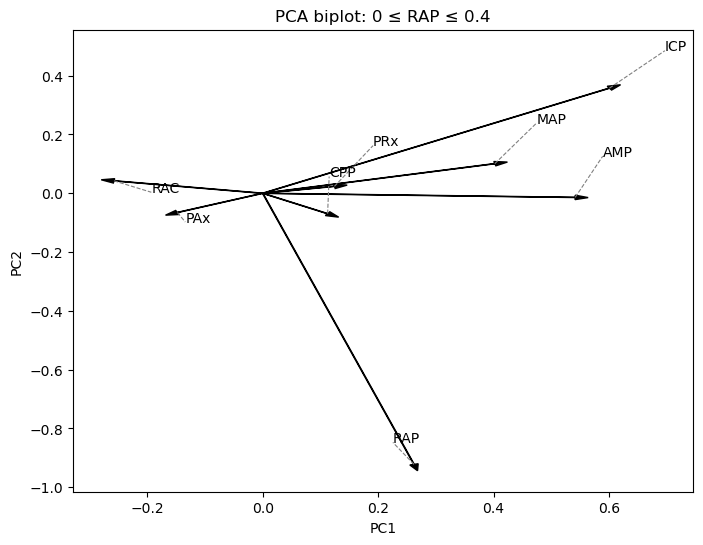

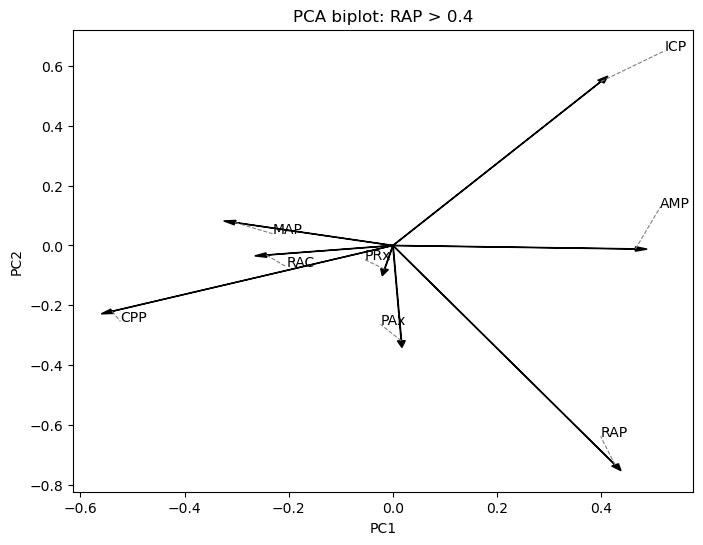

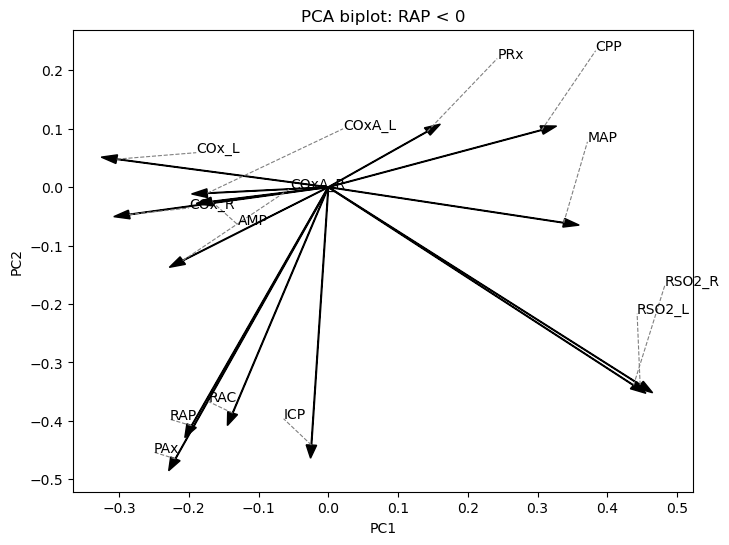

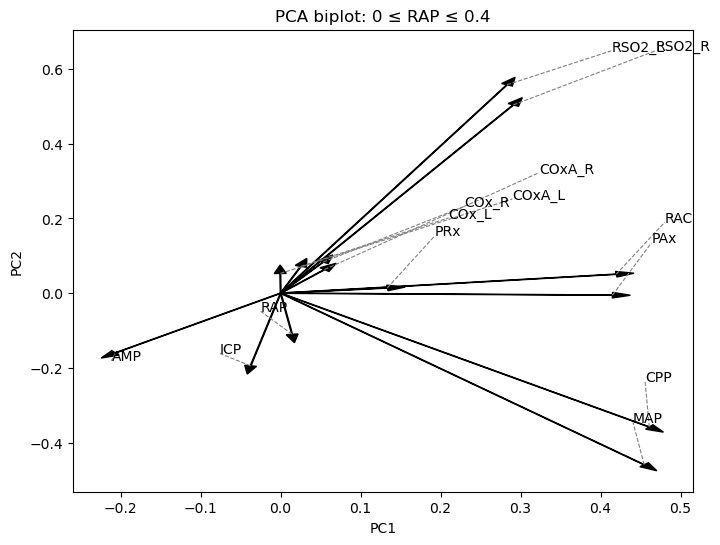

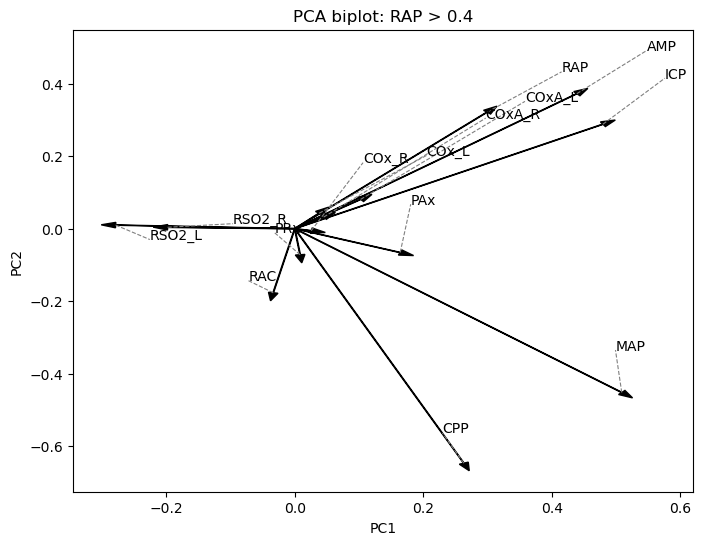

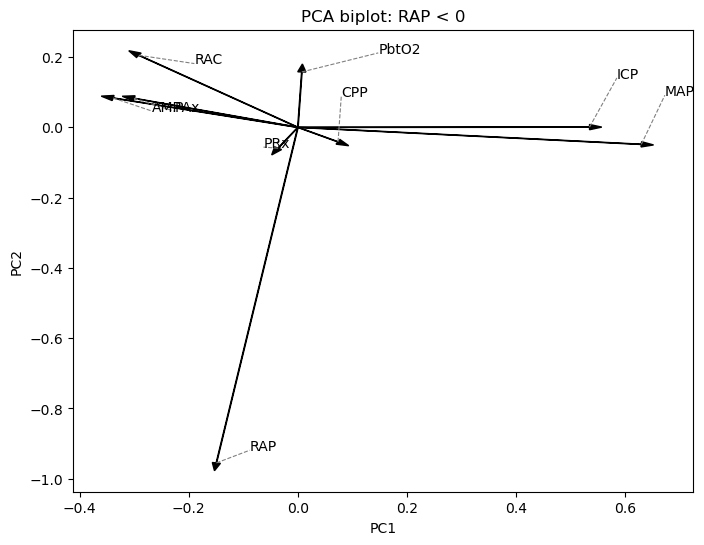

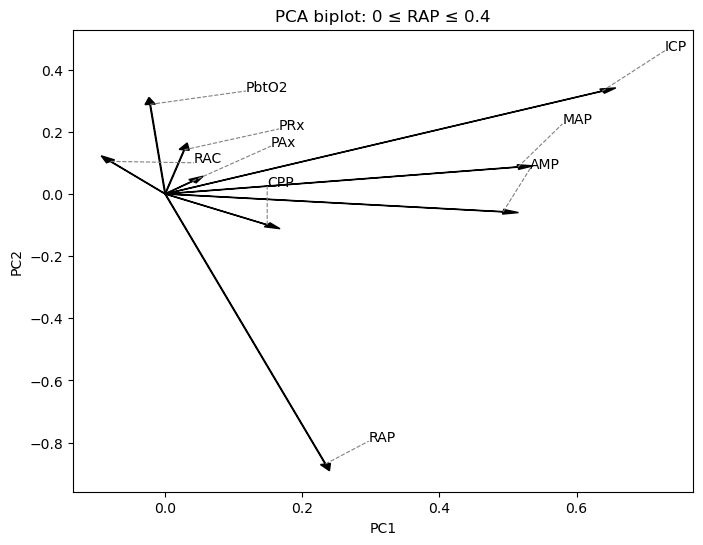

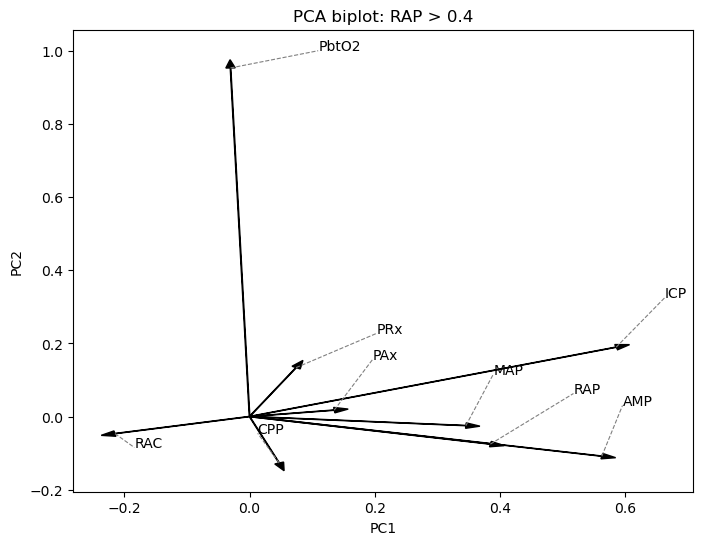

Execution time:  133.38631750000002 seconds


In [13]:
tic = timer()

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

for resolution_index, resolution in enumerate(resolutions):
    print("Resolution in progress: ", resolution)
    print("---------------------------------------------------------------------")
    print("\n")

    for index, file_segment in enumerate(df_all):

        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)

        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        # Scaling the data
        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Splitting data into three segments
        breakpoints = [0, 0.4]

        segment1 = file_segment_edited[file_segment_edited['RAP'] < breakpoints[0]]
        segment2 = file_segment_edited[(file_segment_edited['RAP'] >= breakpoints[0]) & (file_segment_edited['RAP'] <= breakpoints[1])]
        segment3 = file_segment_edited[file_segment_edited['RAP'] > breakpoints[1]]

        segments = [segment1, segment2, segment3]

        for segment_no, segment in enumerate(segments):
            visualizing_biplots_using_PCA(segment, segment_no, resolution, file_labels[index], labels)
            
tac = timer()
print("Execution time: ",tac-tic, "seconds")

## K-means clustering analysis

In [557]:
for index, file_segment in enumerate(df_all):
    print(df_all[index].shape[1])

8
14
9


In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


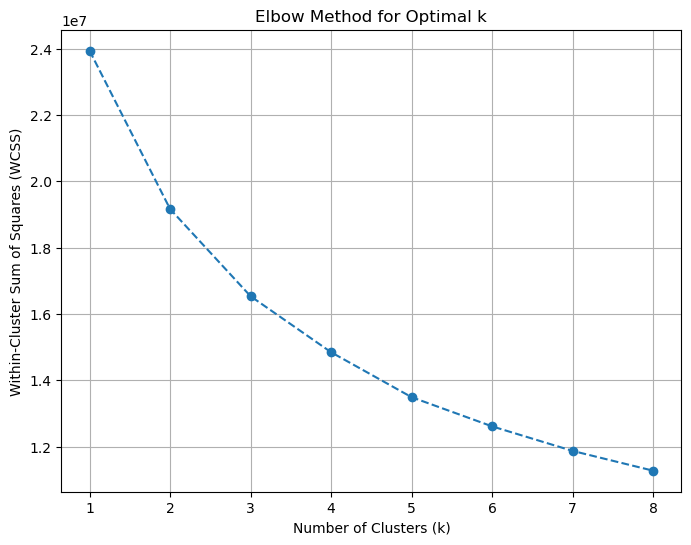

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


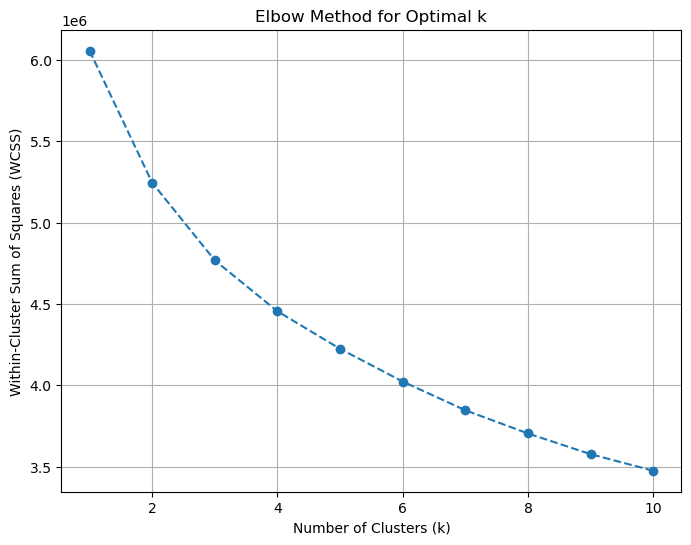

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


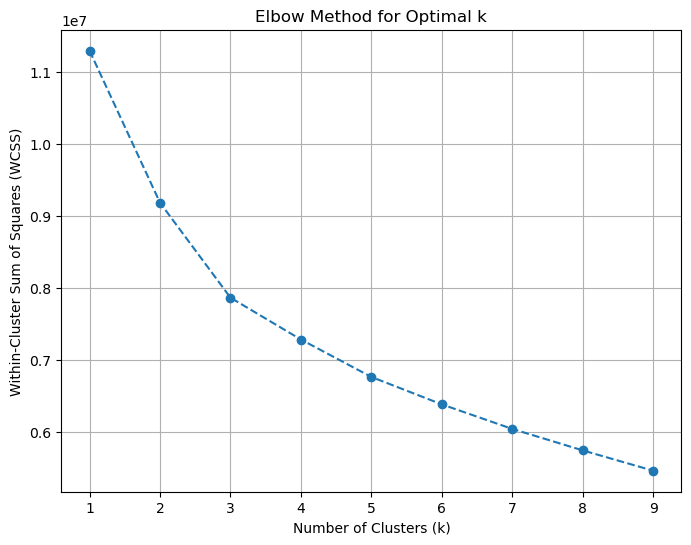

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


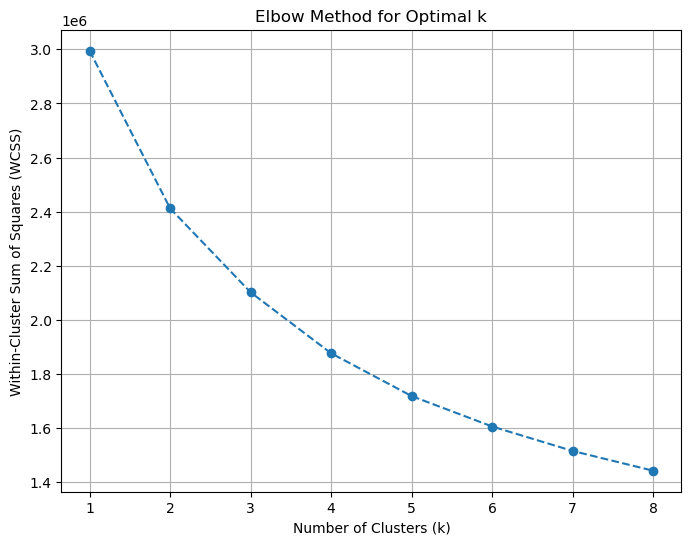

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


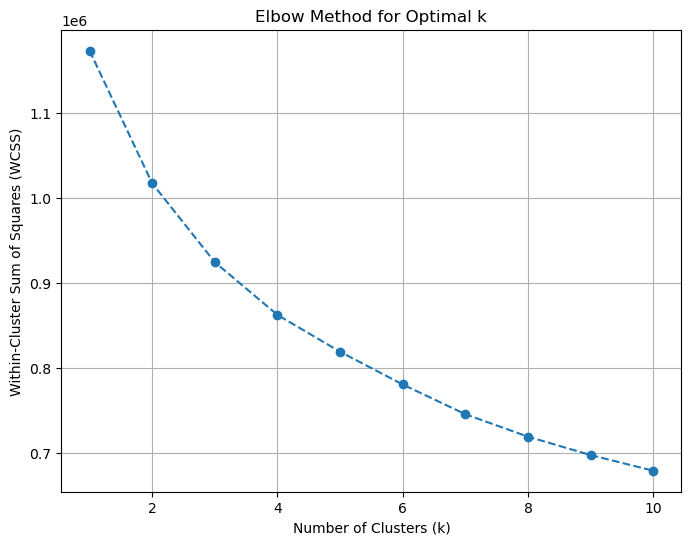

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


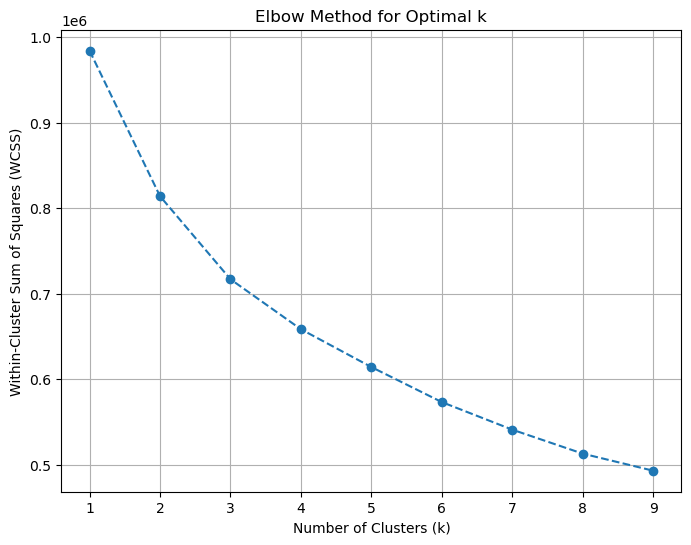

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


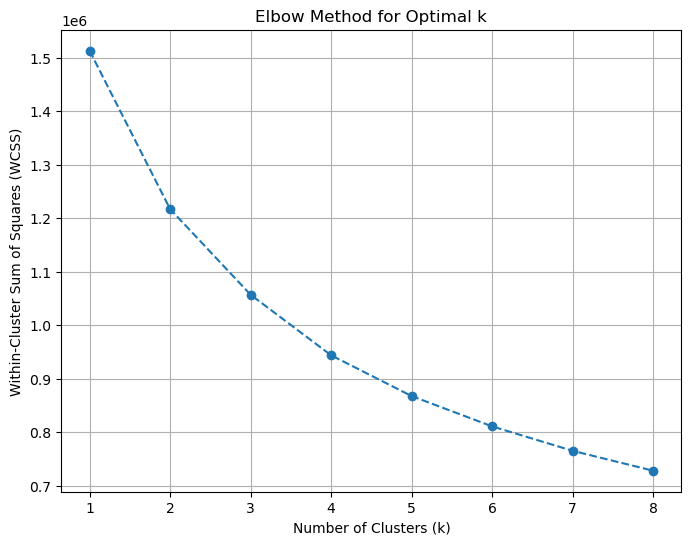

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


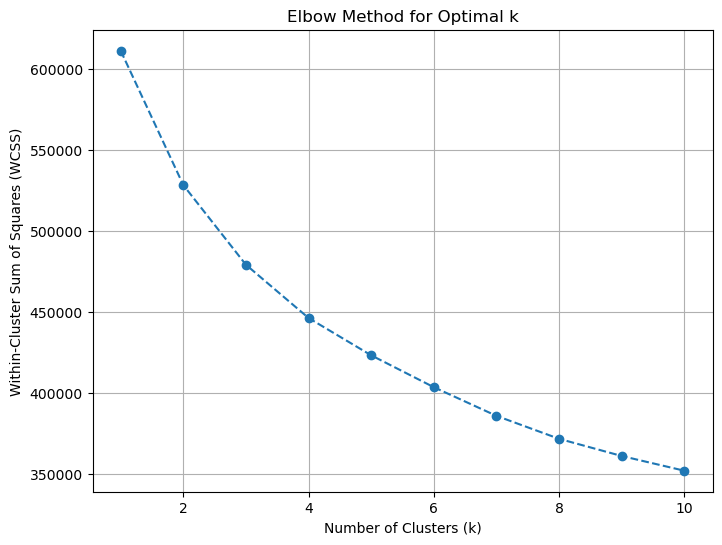

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


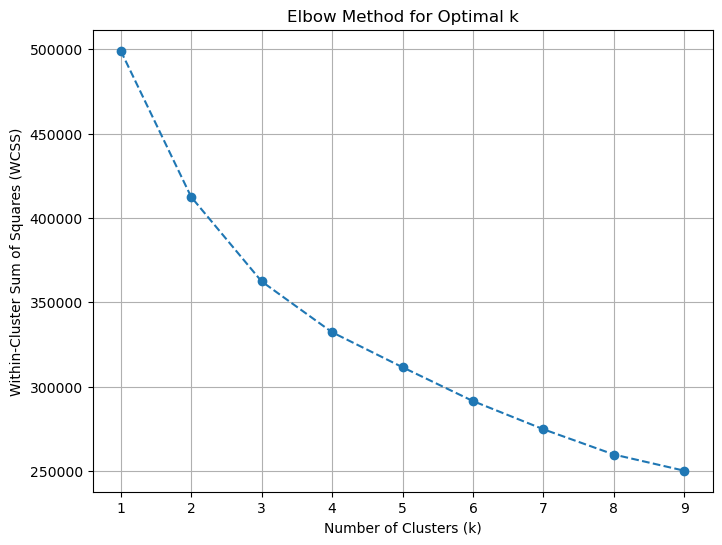

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


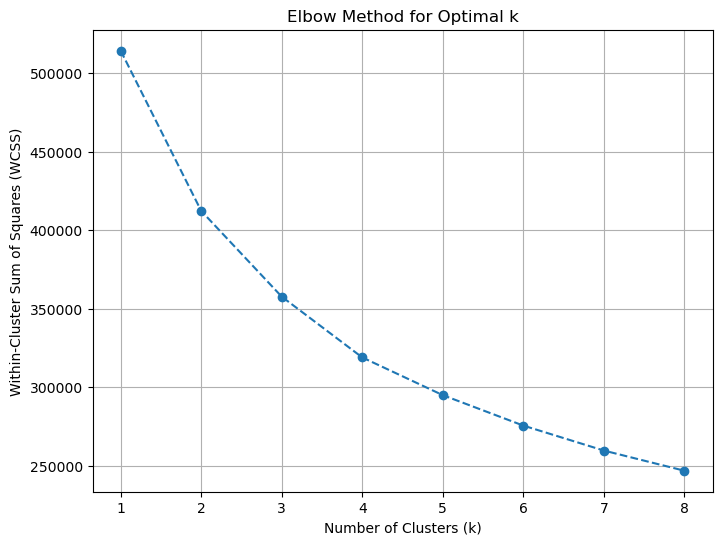

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


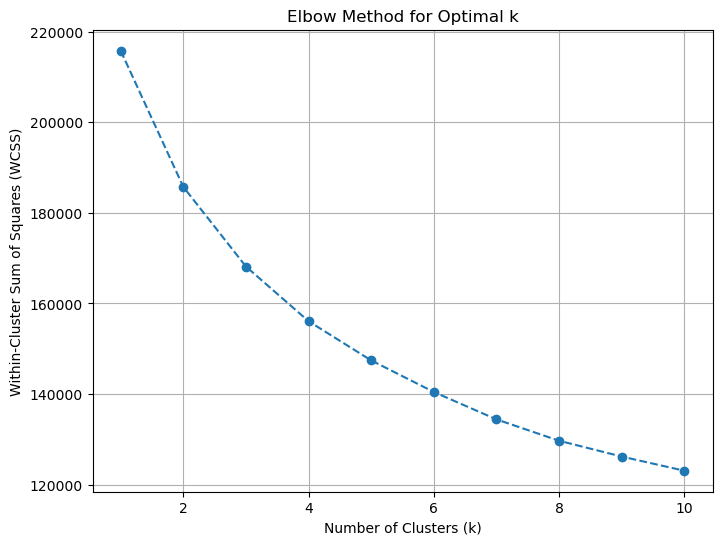

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


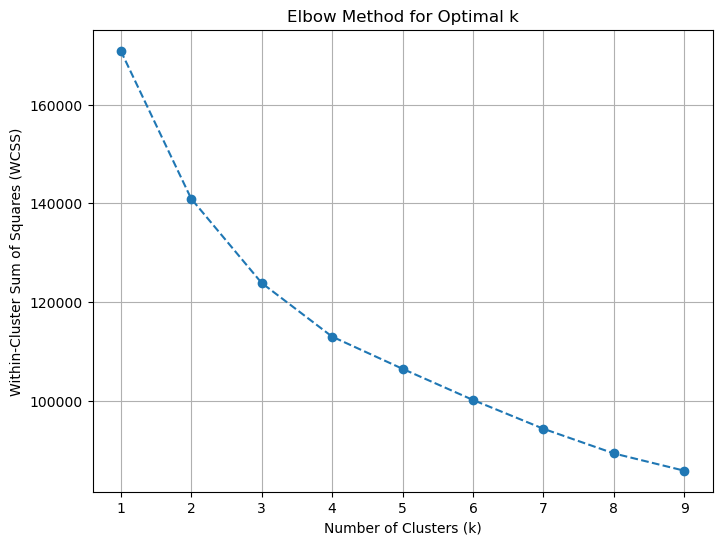

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


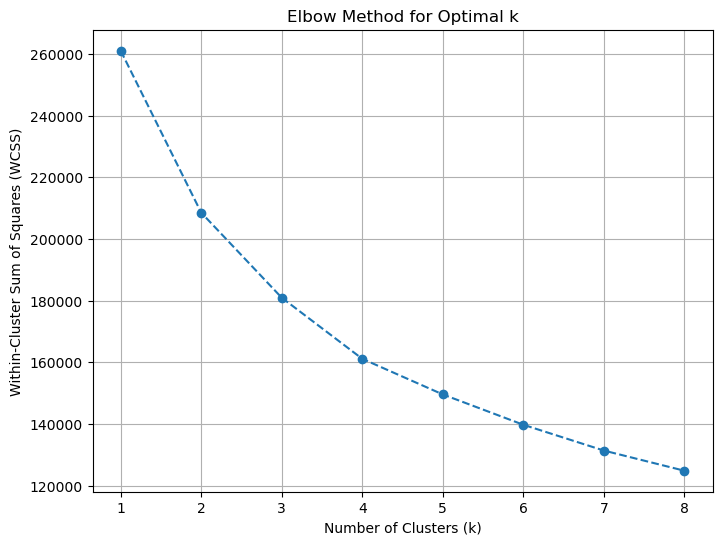

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


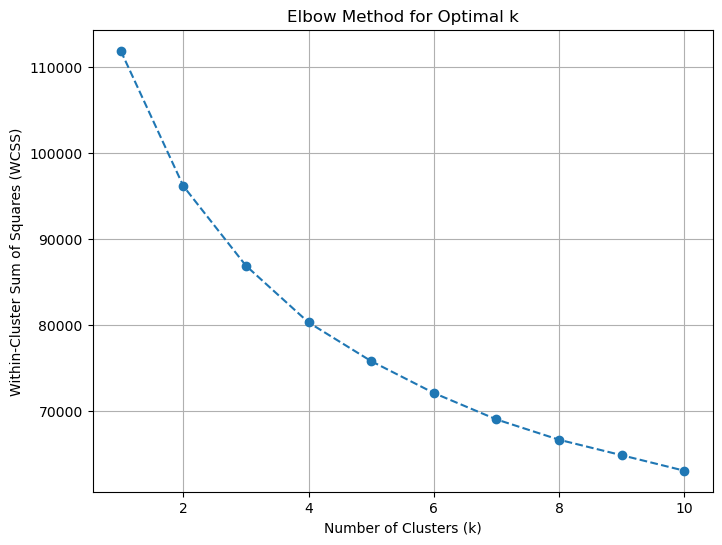

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


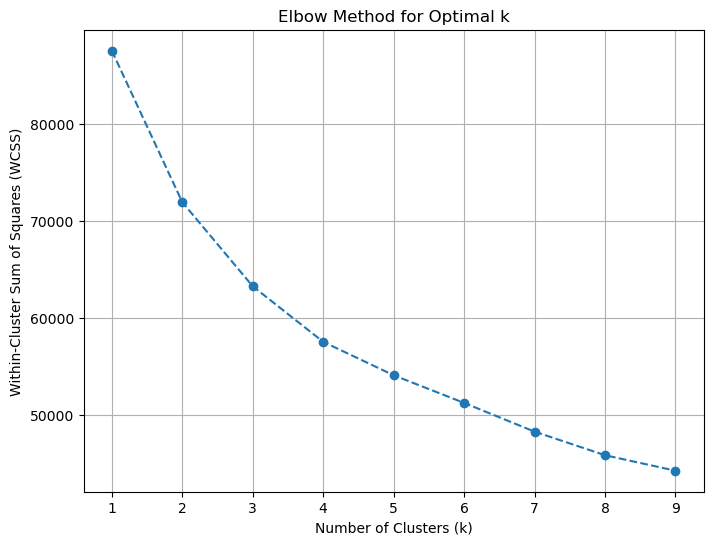

-------------------------------------------------------------------------
Execution time:  1906.1867601999984 seconds


In [30]:
tic = timer()

resolutions = ['M', '5T', '10T', '30T', 'H']
column_list = ['File labels', 'One-minute', '5-minute', '10--minute', '30-minute', '1-hour']
               
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']

for resolution_index, resolution in enumerate(resolutions):
    
    for index, file_segment in enumerate(df_all):
        
        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)
            
        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Scaling the data
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(file_segment_edited)

        # Applying elbow method to find optimal k
        wcss = []

        k_value_end = file_segment_edited.columns.shape[0] + 1
        if file_segment_edited.columns.shape[0] > 10:
            k_value_end = 11
        k_values = range(1, k_value_end)

        print("In progress:", file_labels[index])
        for k in k_values:
            print("Cluster value:", k)
            kmeans = KMeans(n_clusters=k, random_state=42)
            kmeans.fit(data_scaled)
            wcss.append(kmeans.inertia_)  # WCSS for each k

        # Plot the Elbow Curve
        plt.figure(figsize=(8, 6))
        plt.plot(k_values, wcss, marker='o', linestyle='--')
        plt.title('Elbow Method for Optimal k')
        plt.xlabel('Number of Clusters (k)')
        plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
        plt.grid()

        save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\KMCA"
        save_image_name = resolution + '_Elbow_method' + file_labels[index]
        plt.savefig(os.path.join(save_image_directory, save_image_name))

        plt.show()
        print("-------------------------------------------------------------------------")
    
tac = timer()
print("Execution time: ",tac-tic, "seconds")

In [53]:
tic = timer()

resolutions = ['M', '5T', '10T', '30T', 'H']
               
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']
optimal_k = [3, 3 ,3]

warnings.filterwarnings('ignore')

for resolution_index, resolution in enumerate(resolutions):
    print("Resolution in progress: ", resolution)
    
    for index, file_segment in enumerate(df_all):
        print("Data segment in progress: ", file_labels[index])
        
        if resolution == 'M':
            pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)
            
        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Scaling the data
        scaler = StandardScaler()
        data_scaled = scaler.fit_transform(file_segment_edited.T)
        
         # Apply k-means clustering
        kmeans = KMeans(n_clusters=optimal_k[index], random_state=42)
        kmeans.fit(data_scaled)

        df_clusters = pd.DataFrame({'Variable': file_segment_edited.columns, 'Cluster': kmeans.labels_})
        df_clusters_sorted = df_clusters.sort_values(by='Cluster').reset_index(drop=True)

        # Group by Cluster and create the dictionary
        cluster_dict = df_clusters.groupby('Cluster')['Variable'].apply(list).to_dict()
        cluster_dict = dict(sorted(cluster_dict.items()))
        
#         distances = kmeans.transform(data_scaled)
#         assigned_distances = np.array([distances[i, label] for i, label in enumerate(kmeans.labels_)])

        print(cluster_dict)
        #print(assigned_distances)
        print("---------------------------------------------------------------------------")
        print("\n")
    
tac = timer()
print("Execution time: ",round((tac-tic)/60, 2), "minutes")

Resolution in progress:  M
Data segment in progress:  ICP_ABP_measures
{0: ['ICP'], 1: ['MAP', 'CPP'], 2: ['RAP', 'AMP', 'PRx', 'PAx', 'RAC']}
---------------------------------------------------------------------------


Data segment in progress:  NIRS_measures
{0: ['RSO2_L', 'RSO2_R'], 1: ['RAP', 'ICP', 'AMP', 'PRx', 'PAx', 'RAC', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R'], 2: ['MAP', 'CPP']}
---------------------------------------------------------------------------


Data segment in progress:  PbtO2_measures
{0: ['ICP', 'PbtO2'], 1: ['MAP', 'CPP'], 2: ['RAP', 'AMP', 'PRx', 'PAx', 'RAC']}
---------------------------------------------------------------------------


Resolution in progress:  5T
Data segment in progress:  ICP_ABP_measures
{0: ['ICP'], 1: ['MAP', 'CPP'], 2: ['RAP', 'AMP', 'PRx', 'PAx', 'RAC']}
---------------------------------------------------------------------------


Data segment in progress:  NIRS_measures
{0: ['RSO2_L', 'RSO2_R'], 1: ['RAP', 'ICP', 'AMP', 'PRx', 'PAx', '

Execution time:  3.91 minutes


## Sub-group analysis

### Elbow method plot

In [63]:
def visualizing_plot_from_elbow_method(segment, segment_no, resolution, file_label, labels):
    
    # Scaling the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment)

    # Applying elbow method to find optimal k
    wcss = []

    k_value_end = segment.columns.shape[0] + 1
    if segment.columns.shape[0] > 10:
        k_value_end = 11
    k_values = range(1, k_value_end)

    print("In progress:", file_labels[index])
    for k in k_values:
        print("Cluster value:", k)
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(data_scaled)
        wcss.append(kmeans.inertia_)  # WCSS for each k

    # Plot the Elbow Curve
    plt.figure(figsize=(8, 6))
    plt.plot(k_values, wcss, marker='o', linestyle='--')
    plot_title = 'Elbow Method for Optimal k: ' + labels[segment_no]
    plt.title(plot_title)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
    plt.grid()

    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\KMCA\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_Elbow_method' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))

    plt.show()
    print("-------------------------------------------------------------------------")

Resolution in progress:  M
Data segment in progress:  ICP_ABP_measures
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


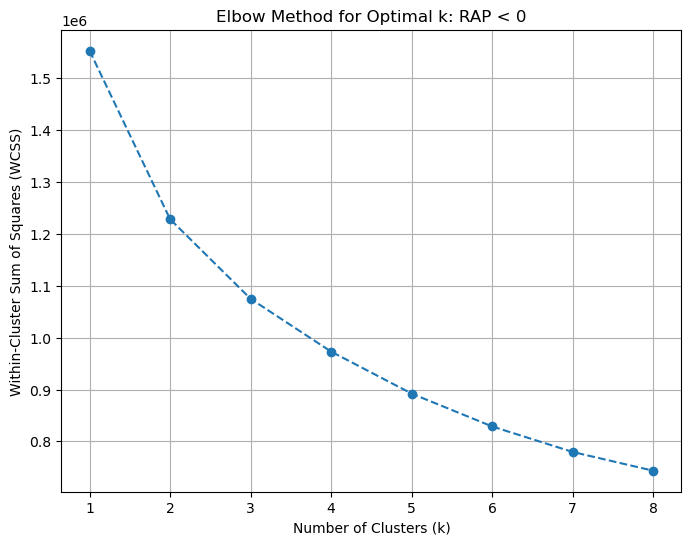

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


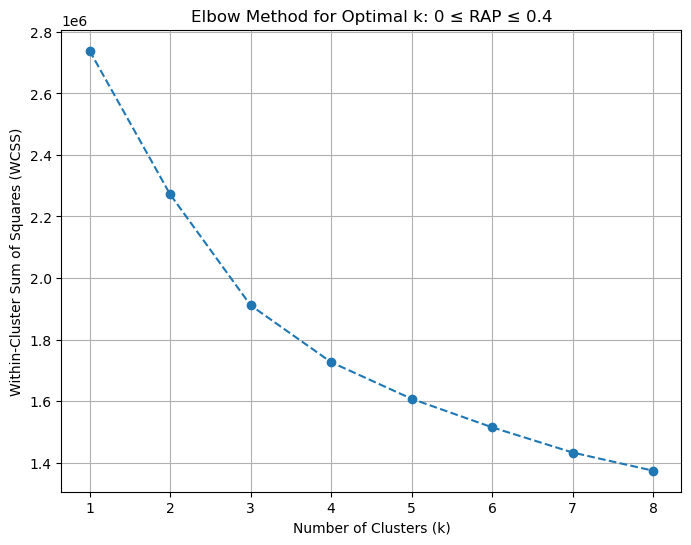

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


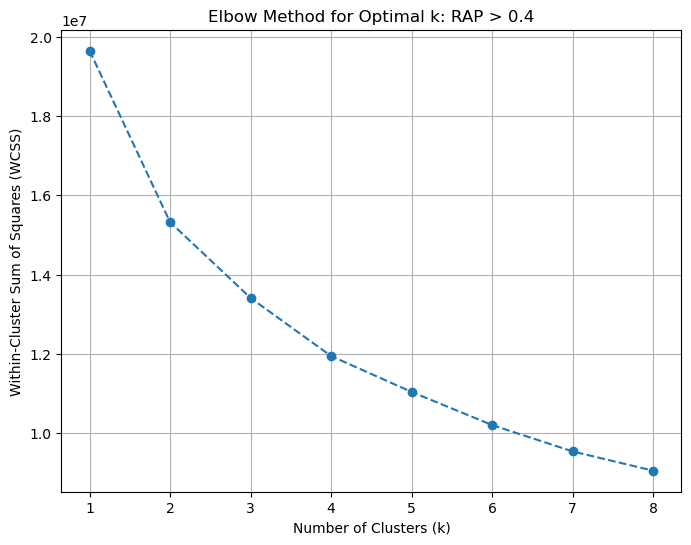

-------------------------------------------------------------------------
Data segment in progress:  NIRS_measures
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


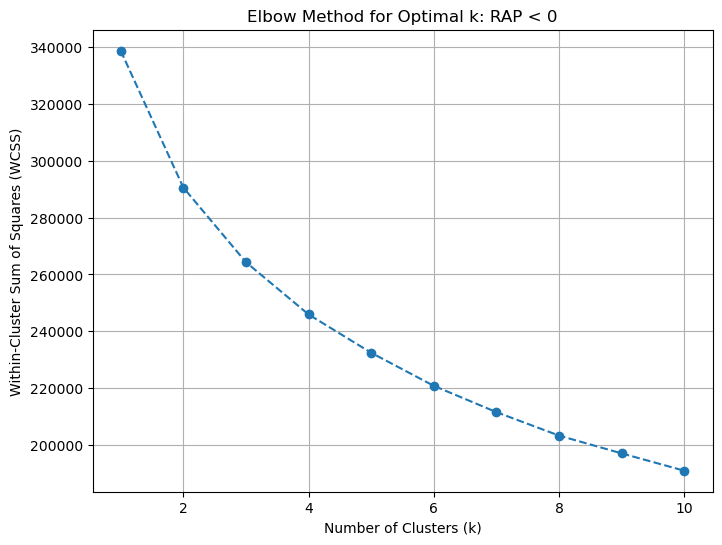

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


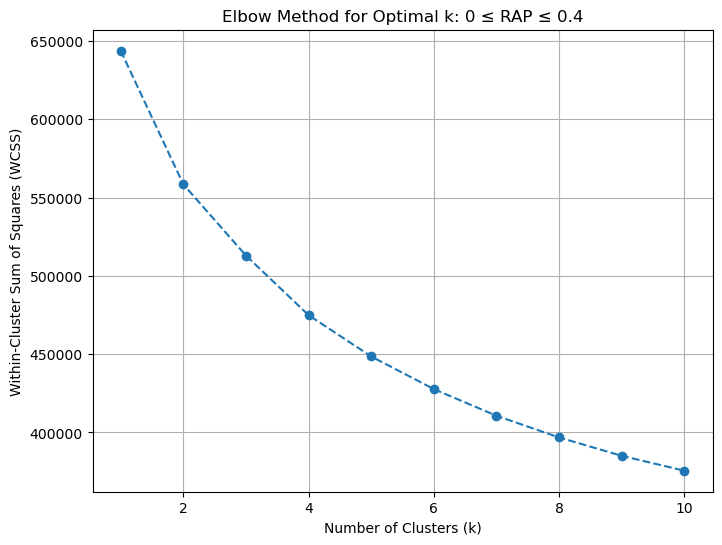

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


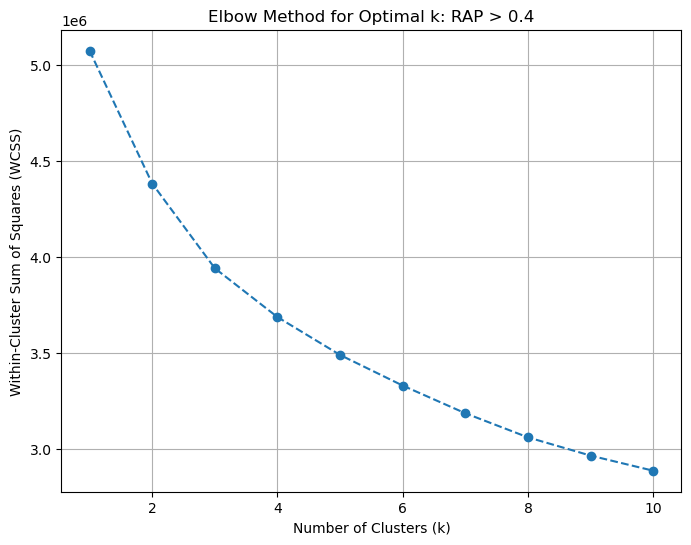

-------------------------------------------------------------------------
Data segment in progress:  PbtO2_measures
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


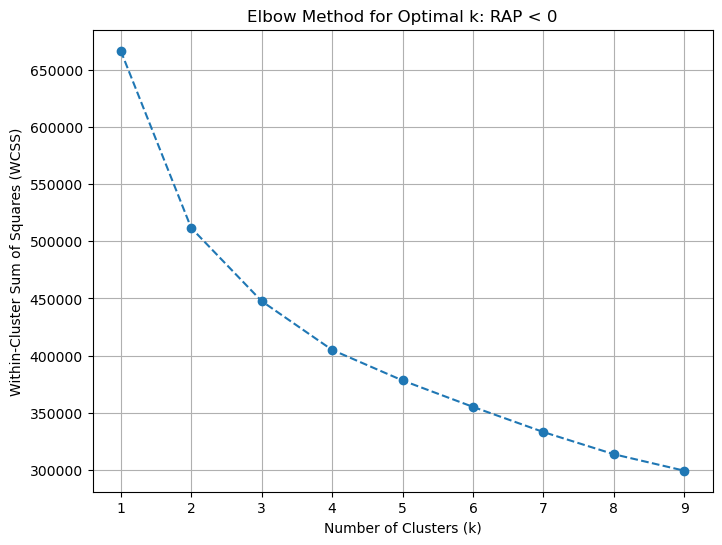

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


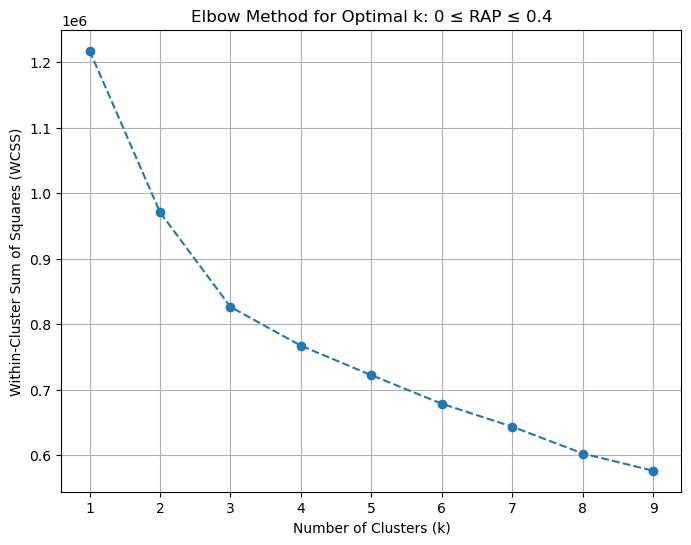

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


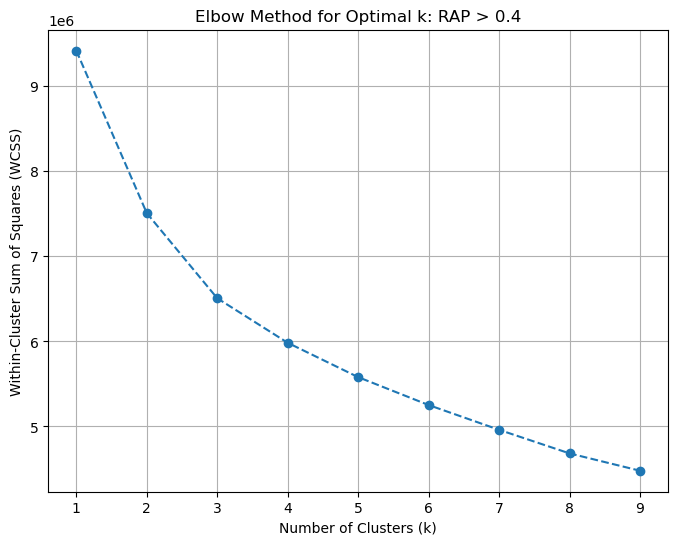

-------------------------------------------------------------------------
---------------------------------------------------------------


Resolution in progress:  5T
Data segment in progress:  ICP_ABP_measures
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


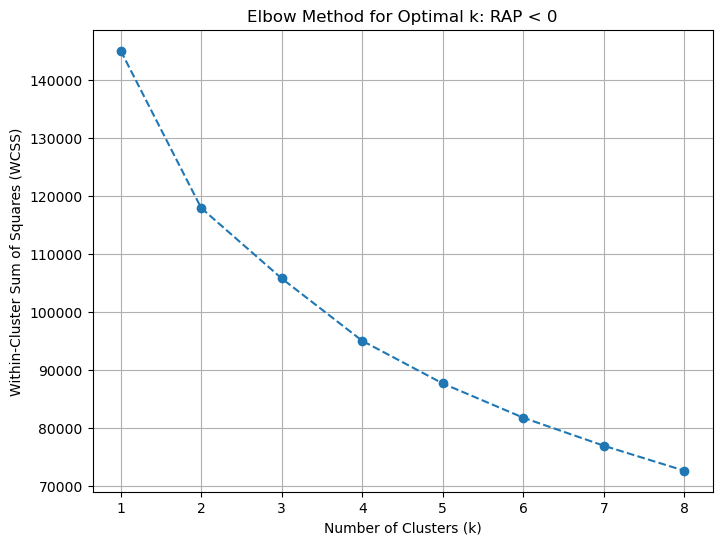

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


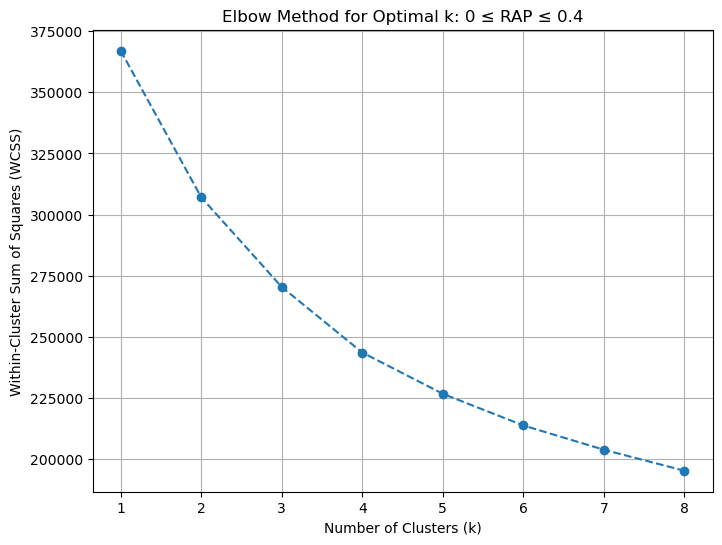

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


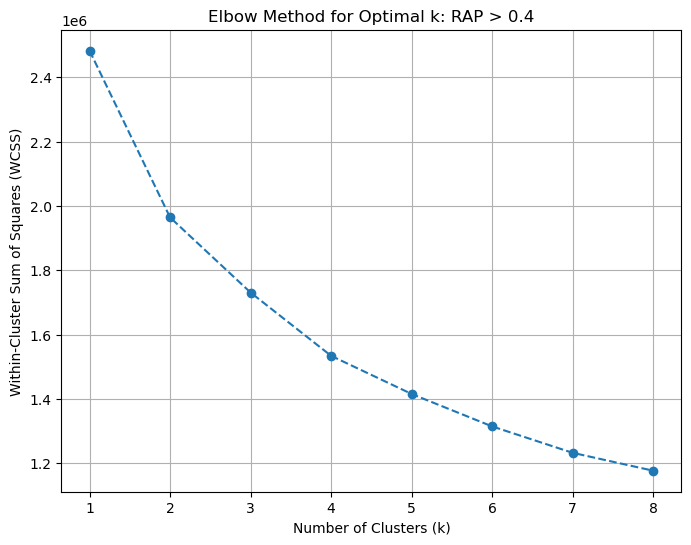

-------------------------------------------------------------------------
Data segment in progress:  NIRS_measures
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


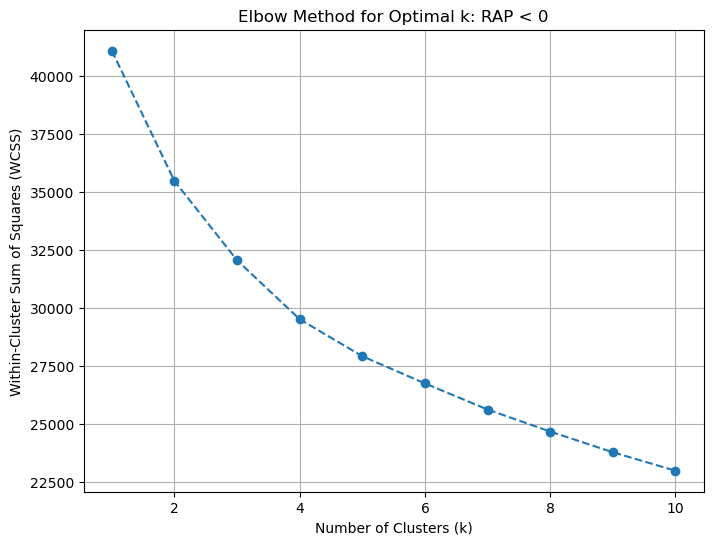

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


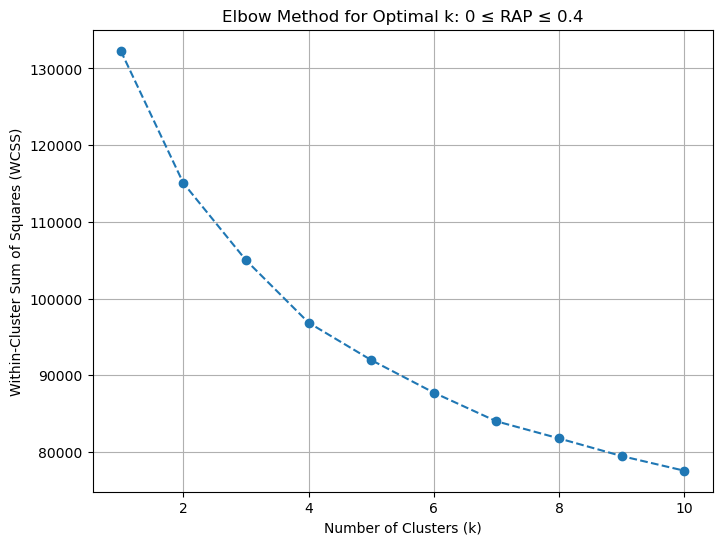

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


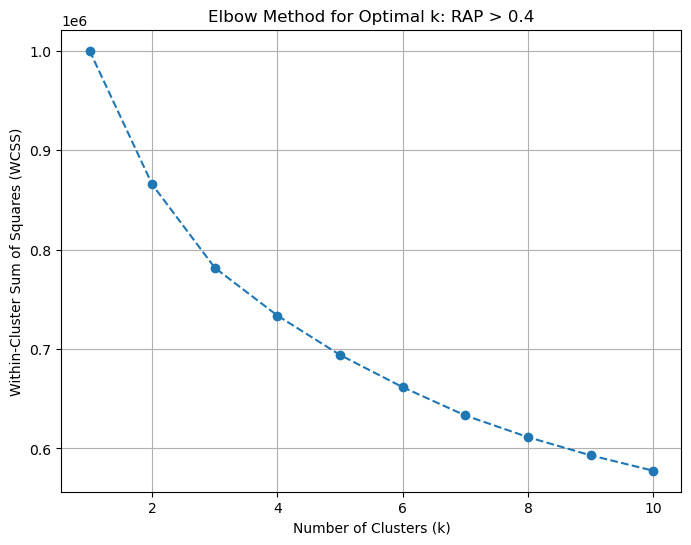

-------------------------------------------------------------------------
Data segment in progress:  PbtO2_measures
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


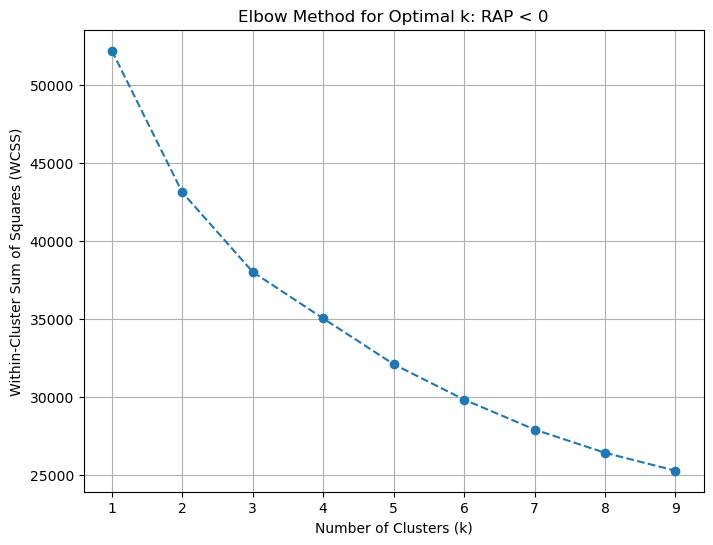

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


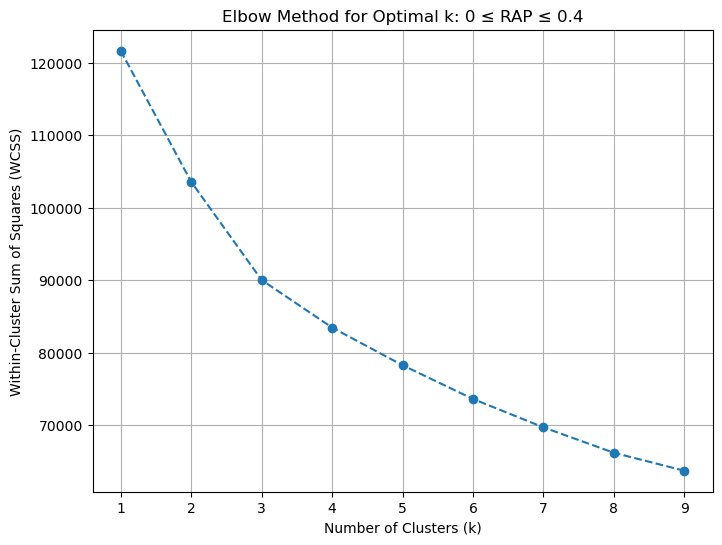

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


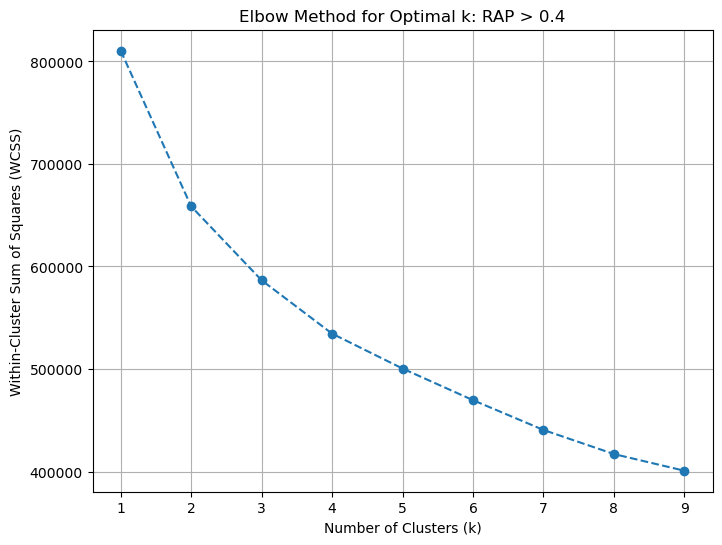

-------------------------------------------------------------------------
---------------------------------------------------------------


Resolution in progress:  10T
Data segment in progress:  ICP_ABP_measures
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


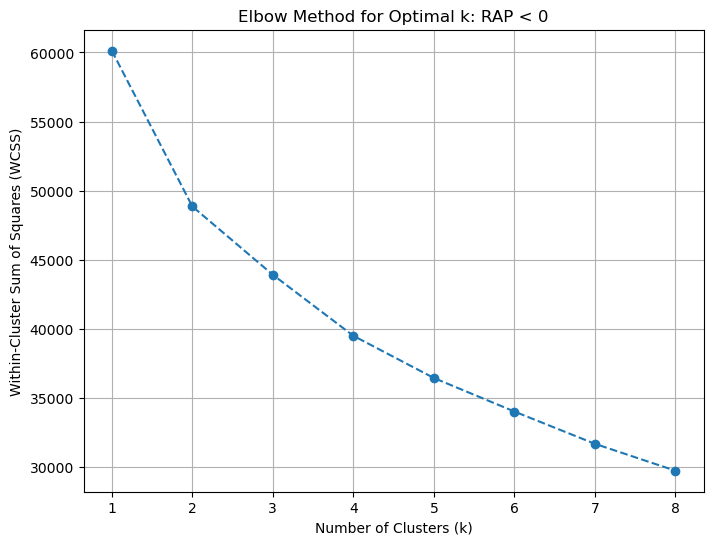

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


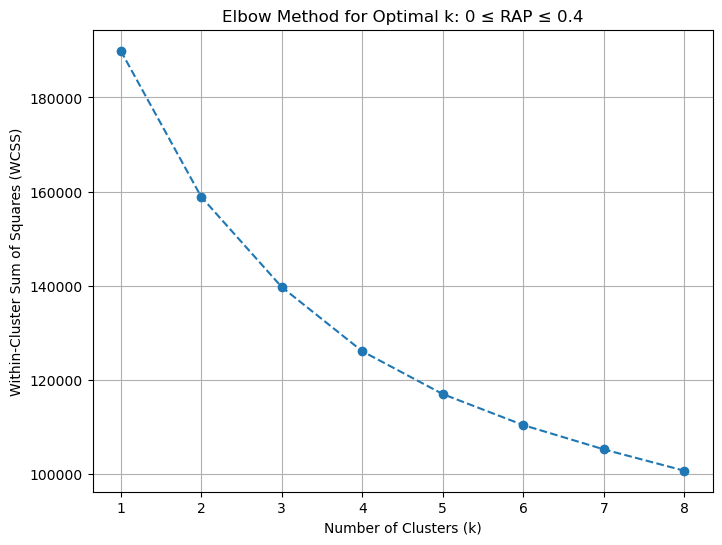

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


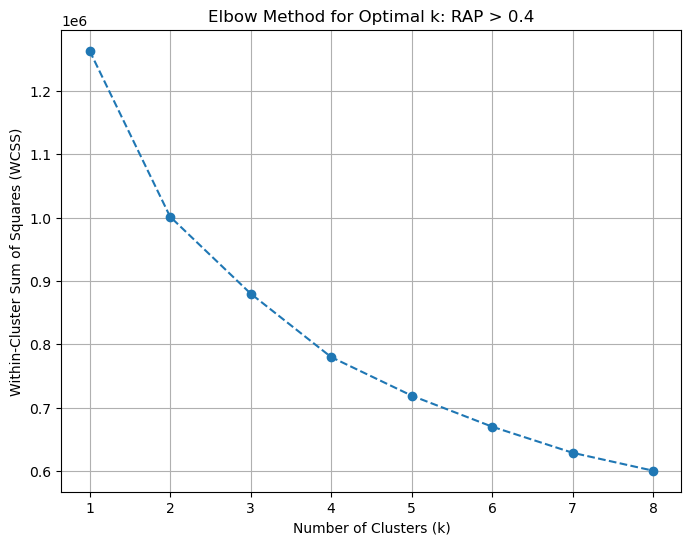

-------------------------------------------------------------------------
Data segment in progress:  NIRS_measures
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


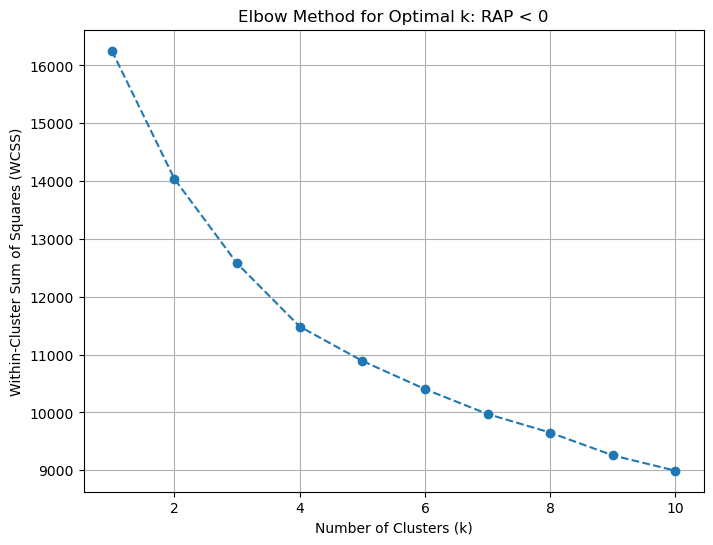

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


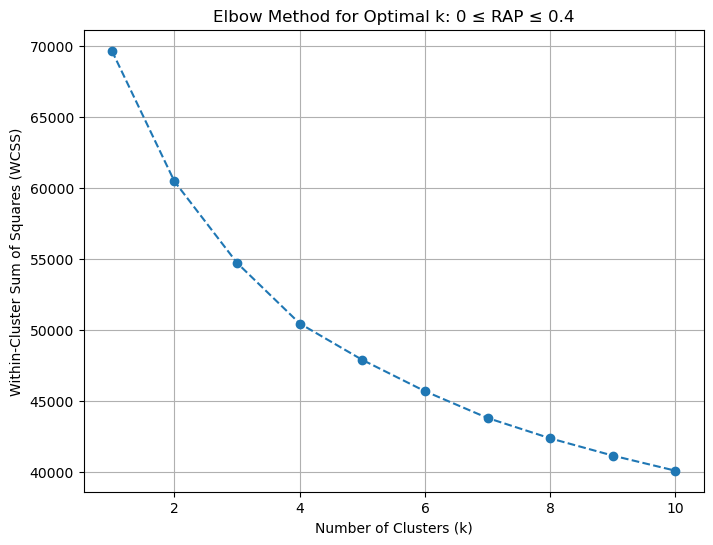

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


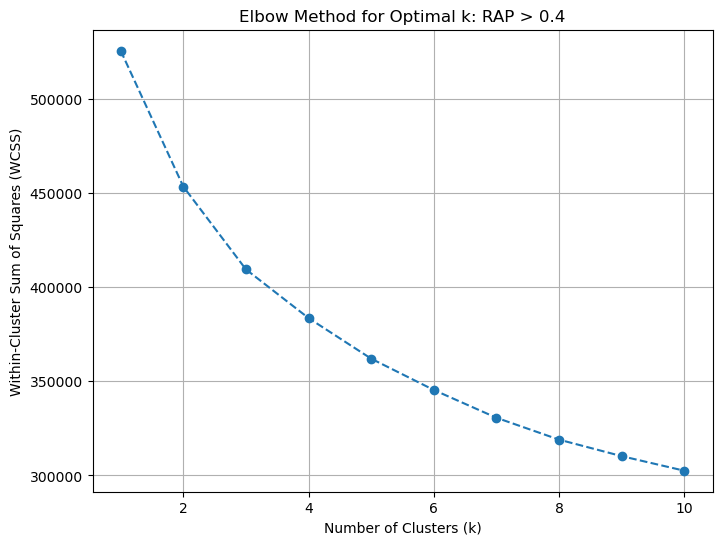

-------------------------------------------------------------------------
Data segment in progress:  PbtO2_measures
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


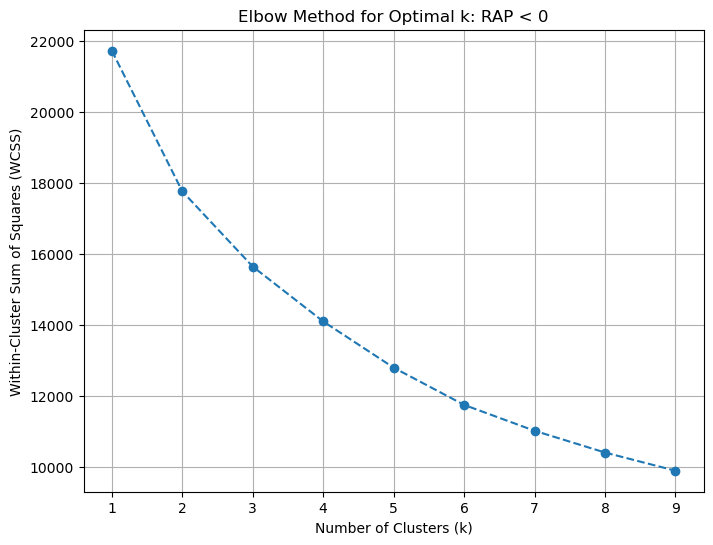

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


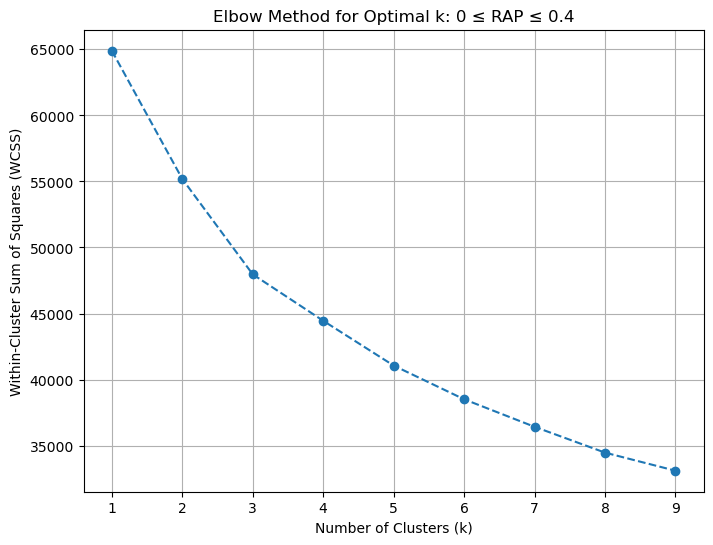

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


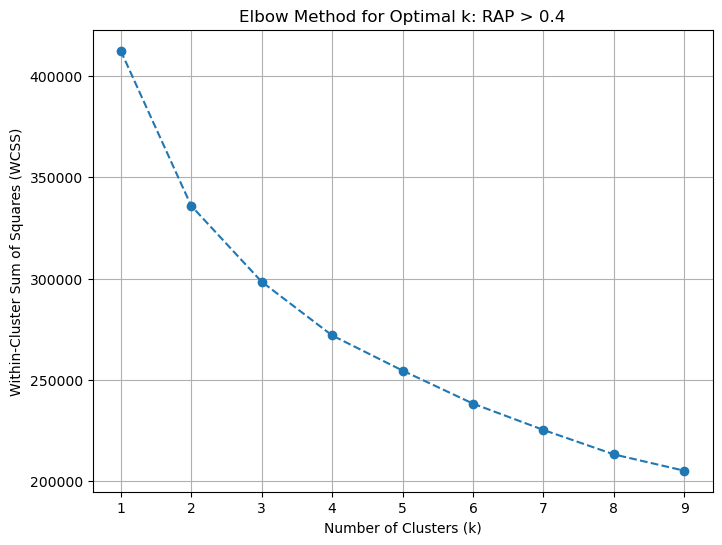

-------------------------------------------------------------------------
---------------------------------------------------------------


Resolution in progress:  30T
Data segment in progress:  ICP_ABP_measures
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


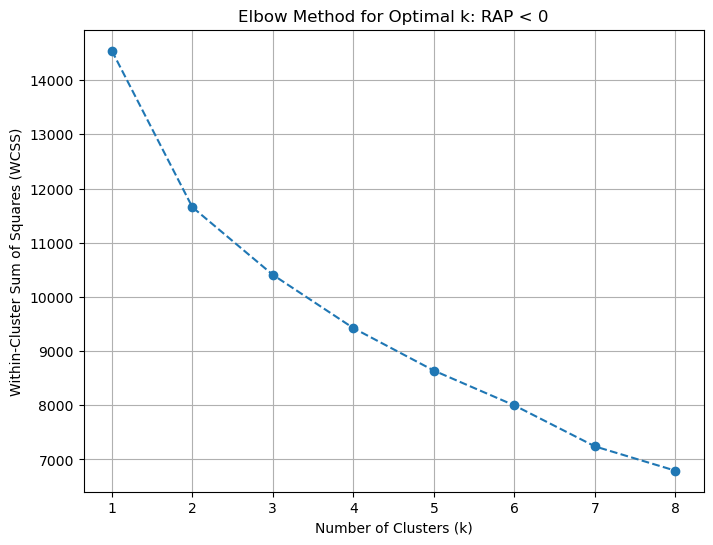

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


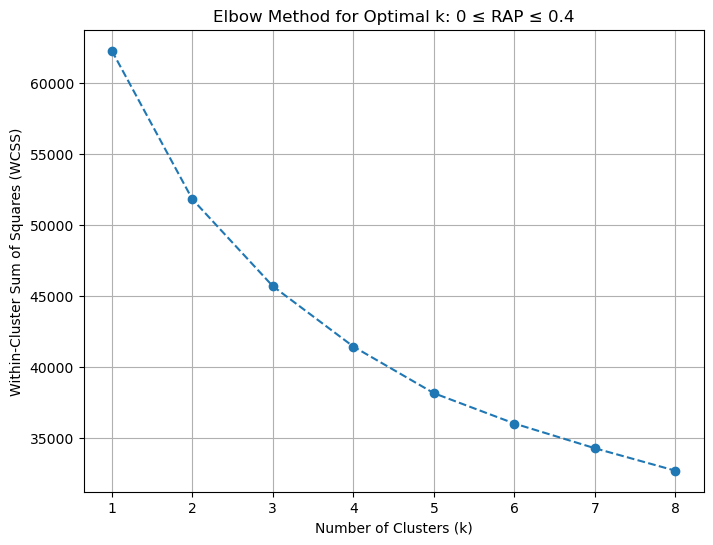

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


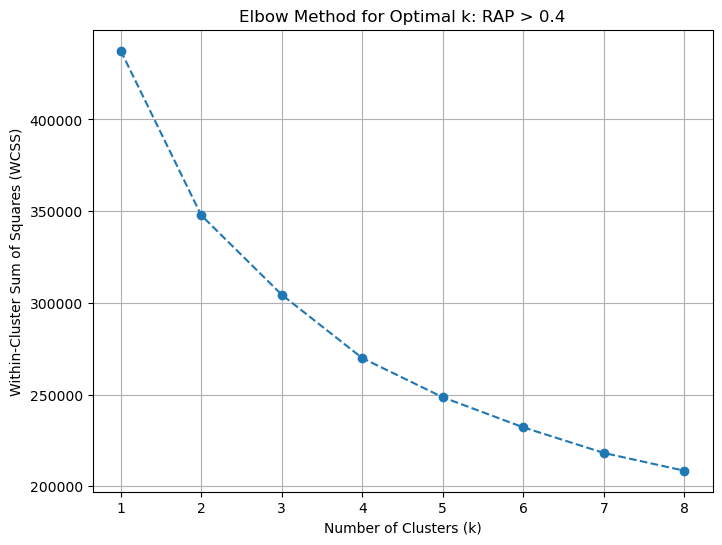

-------------------------------------------------------------------------
Data segment in progress:  NIRS_measures
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


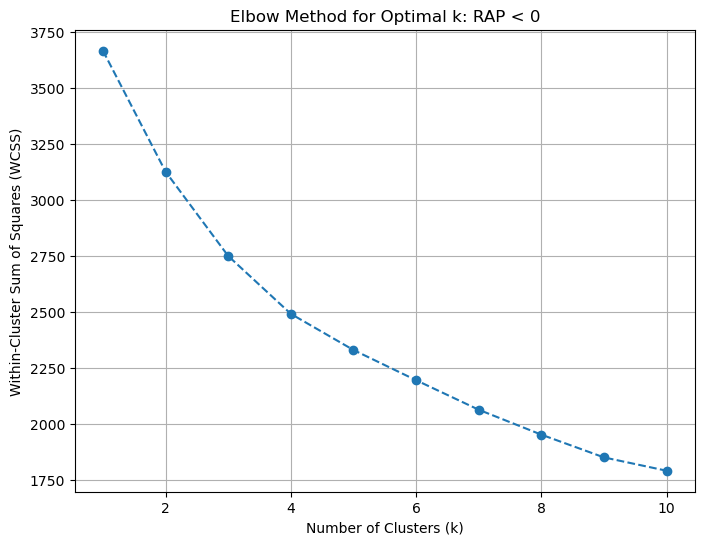

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


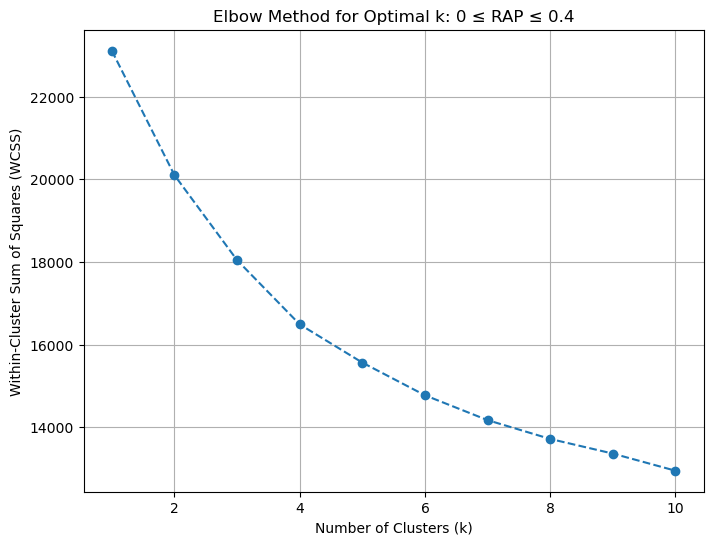

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


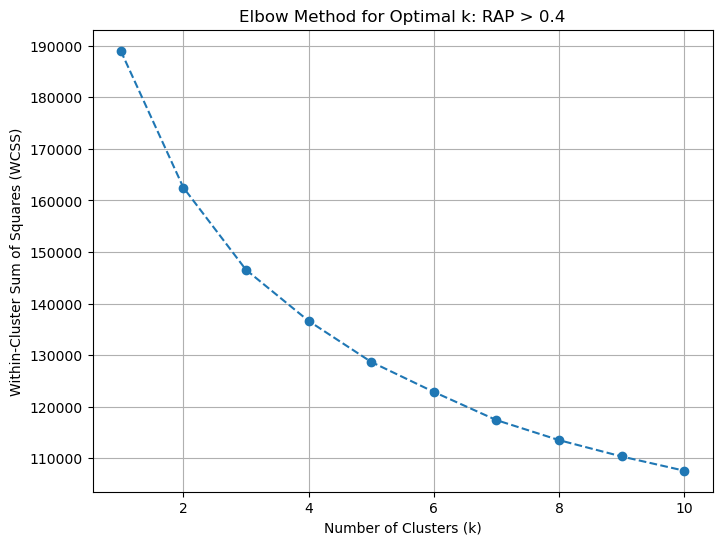

-------------------------------------------------------------------------
Data segment in progress:  PbtO2_measures
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


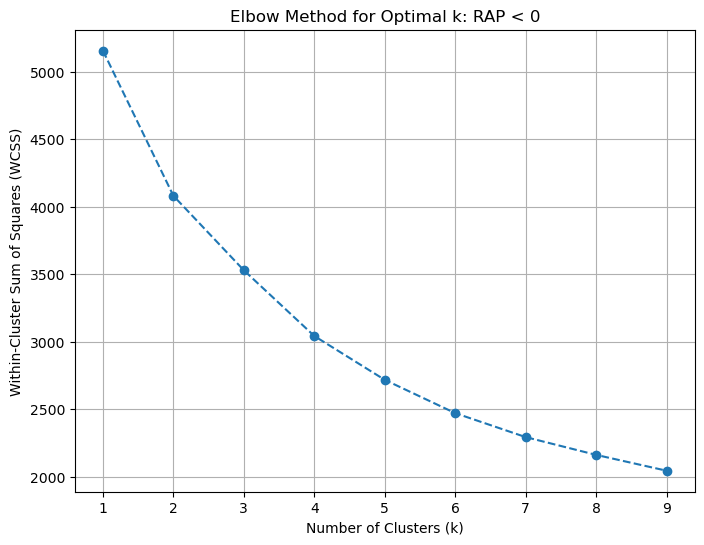

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


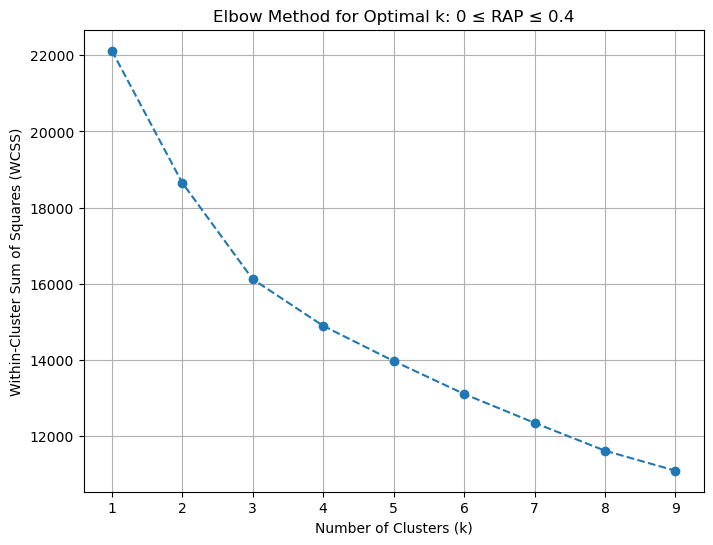

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


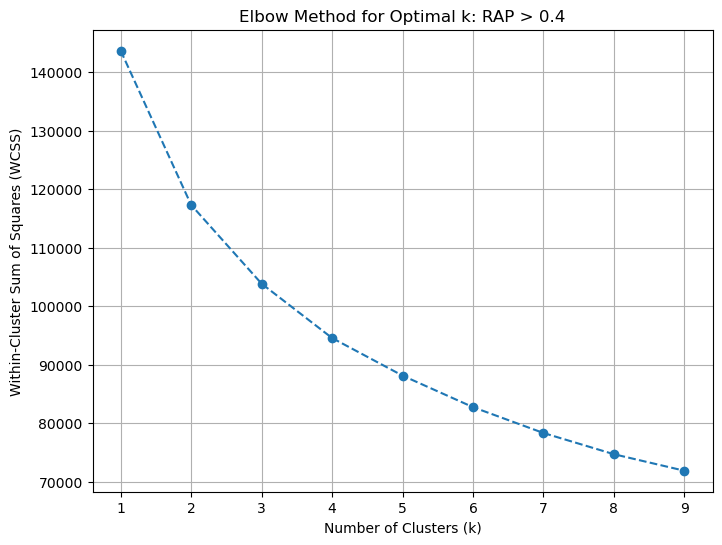

-------------------------------------------------------------------------
---------------------------------------------------------------


Resolution in progress:  H
Data segment in progress:  ICP_ABP_measures
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


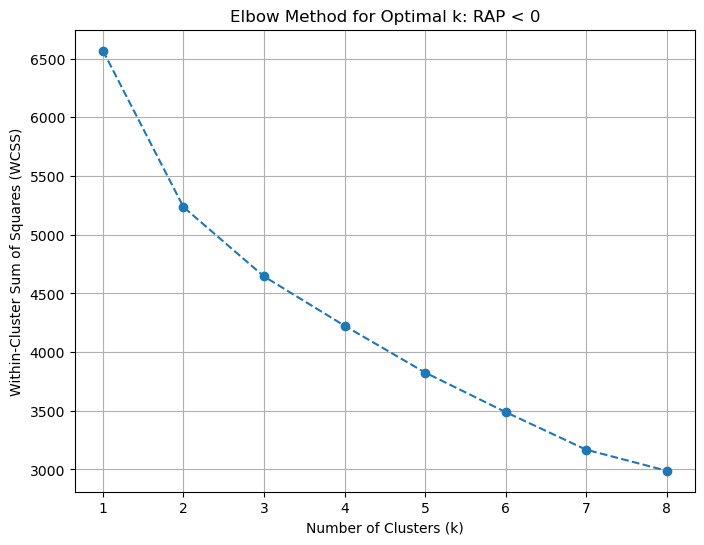

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


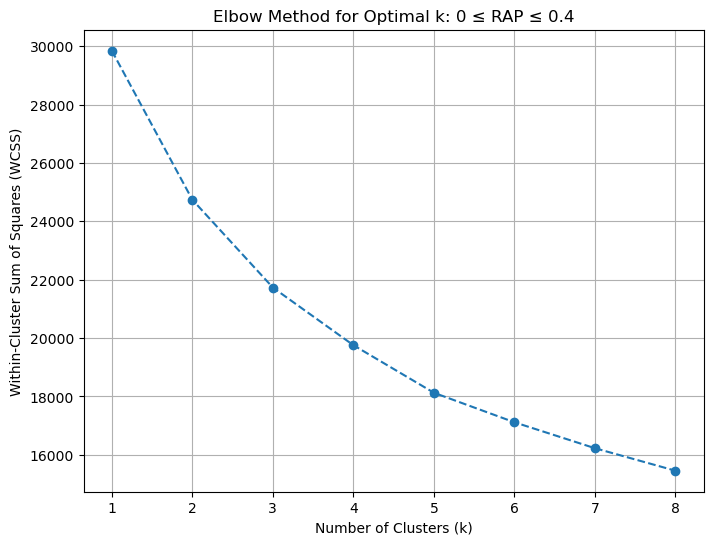

-------------------------------------------------------------------------
In progress: ICP_ABP_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8


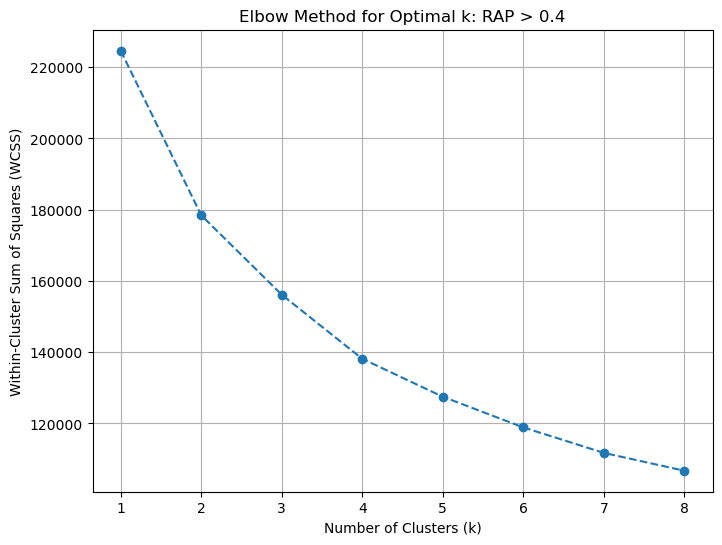

-------------------------------------------------------------------------
Data segment in progress:  NIRS_measures
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


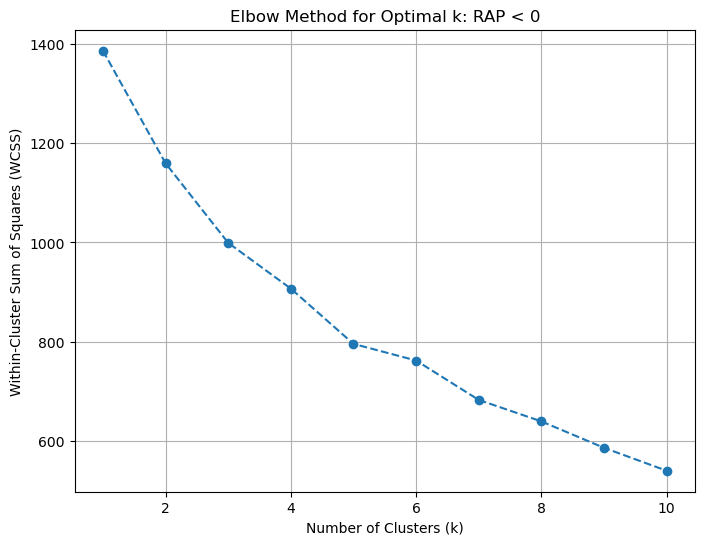

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


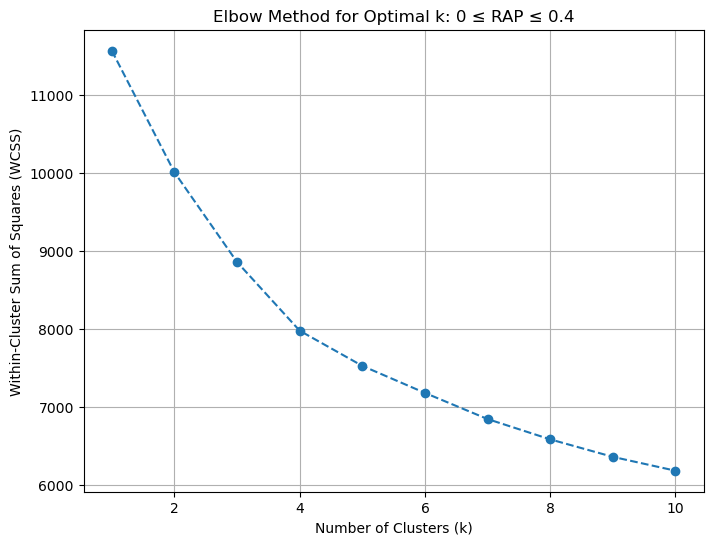

-------------------------------------------------------------------------
In progress: NIRS_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9
Cluster value: 10


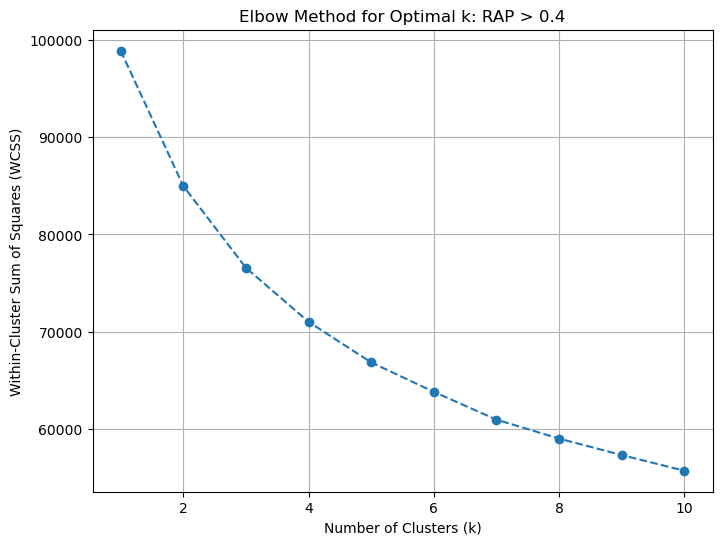

-------------------------------------------------------------------------
Data segment in progress:  PbtO2_measures
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


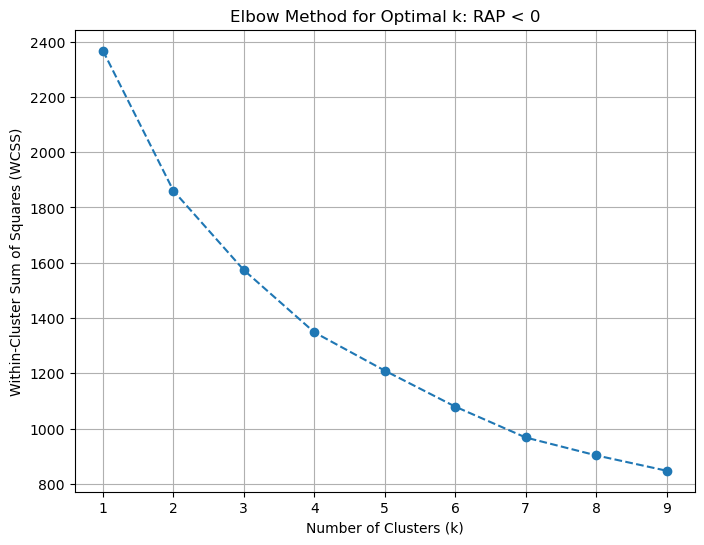

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


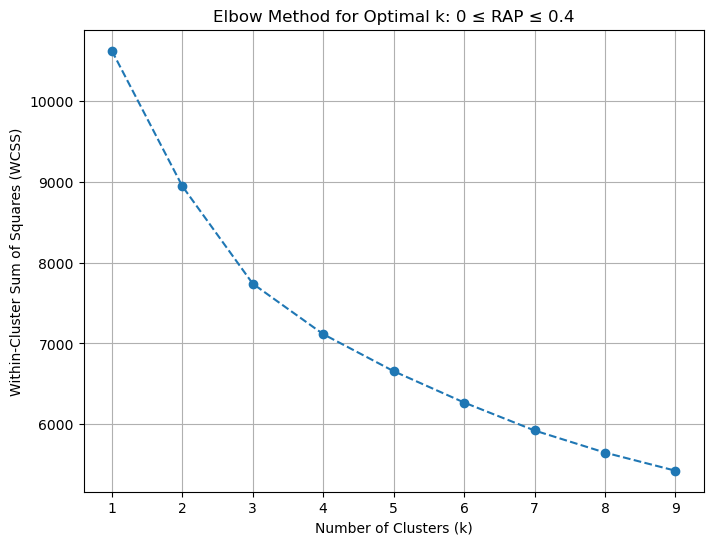

-------------------------------------------------------------------------
In progress: PbtO2_measures
Cluster value: 1
Cluster value: 2
Cluster value: 3
Cluster value: 4
Cluster value: 5
Cluster value: 6
Cluster value: 7
Cluster value: 8
Cluster value: 9


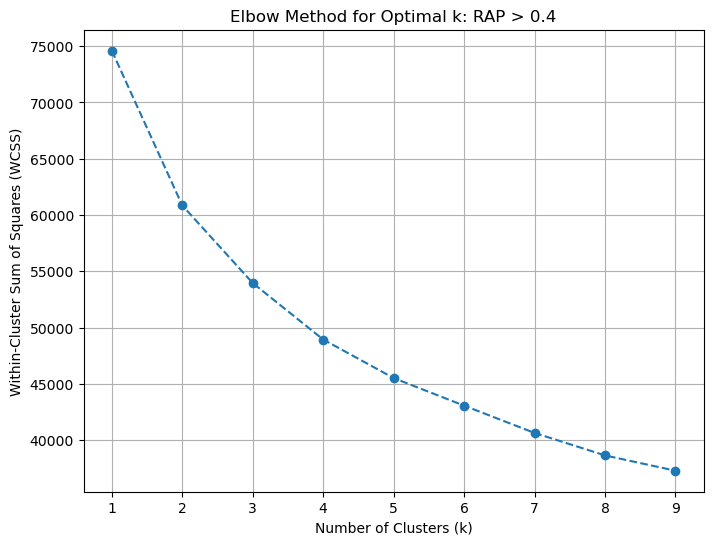

-------------------------------------------------------------------------
---------------------------------------------------------------


Execution time:  33.92 minutes


In [64]:
tic = timer()

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']


for resolution_index, resolution in enumerate(resolutions):
    print("Resolution in progress: ", resolution)
    
    for index, file_segment in enumerate(df_all):
        print("Data segment in progress: ", file_labels[index])

        if resolution == 'M':
                pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)

        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Splitting data into three segments
        breakpoints = [0, 0.4]

        segment1 = file_segment_edited[file_segment_edited['RAP'] < breakpoints[0]]
        segment2 = file_segment_edited[(file_segment_edited['RAP'] >= breakpoints[0]) & (file_segment_edited['RAP'] <= breakpoints[1])]
        segment3 = file_segment_edited[file_segment_edited['RAP'] > breakpoints[1]]

        segments = [segment1, segment2, segment3]

        for segment_no, segment in enumerate(segments):
            visualizing_plot_from_elbow_method(segment, segment_no, resolution, file_labels[index], labels)
            
    print("---------------------------------------------------------------")
    print("\n")
    
tac = timer()
print("Execution time: ",round((tac-tic)/60, 2), "minutes")

### Cluster analysis

In [12]:
def calculating_clusters(segment, segment_no, resolution, file_label, labels):

    # Scaling the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment.T)

     # Apply k-means clustering
    kmeans = KMeans(n_clusters=optimal_k[index], random_state=42)
    kmeans.fit(data_scaled)

    df_clusters = pd.DataFrame({'Variable': segment.columns, 'Cluster': kmeans.labels_})
    df_clusters_sorted = df_clusters.sort_values(by='Cluster').reset_index(drop=True)

    # Group by Cluster and create the dictionary
    cluster_dict = df_clusters.groupby('Cluster')['Variable'].apply(list).to_dict()
    cluster_dict = dict(sorted(cluster_dict.items()))

    print(cluster_dict)

In [17]:
def visualize_clusters_heatmap(segment):
    
    # Scaling the data
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment.T)

     # Apply k-means clustering
    kmeans = KMeans(n_clusters=optimal_k[index], random_state=42)
    kmeans.fit(data_scaled)
    
    # Assign cluster labels
    cluster_labels = kmeans.labels_
    ordered_columns = [col for _, col in sorted(zip(cluster_labels, segment.columns))]
    
    # Reorder data
    data_ordered = segment[ordered_columns].T
    
    # Heatmap
    plt.figure(figsize=(10, 6))
    sns.heatmap(StandardScaler().fit_transform(data_ordered), cmap="viridis", cbar=True)
    plt.title("Clustered Variables (Heatmap)")
    plt.xlabel("Samples")
    plt.ylabel("Variables (clustered)")
    plt.show()

In [117]:
def draw_cluster_boundaries(pcs, labels_clusters):
    for cluster in np.unique(labels_clusters):
        points = pcs[labels_clusters == cluster]
        if len(points) >= 3:  # ConvexHull needs at least 3 points
            hull = ConvexHull(points)
            for simplex in hull.simplices:
                plt.plot(points[simplex, 0], points[simplex, 1], "k--", linewidth=1)

In [116]:
kmeans.labels_

NameError: name 'kmeans' is not defined

In [130]:
def visualize_clusters_pca(segment, segment_no, resolution, file_label):
    
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(segment.T)
    
    # Apply k-means clustering
    kmeans = KMeans(n_clusters=optimal_k[index], random_state=42)
    kmeans.fit(data_scaled)

    pca = PCA(n_components=2)
    pcs = pca.fit_transform(data_scaled)

    
    # Create scatter plot
    plt.figure(figsize=(8, 6))
    for cluster in range(kmeans.n_clusters):
        plt.scatter(
            pcs[kmeans.labels_ == cluster, 0],
            pcs[kmeans.labels_ == cluster, 1],
            label=f"Cluster {cluster}"
        )
    
    n_clusters = len(np.unique(labels))
    cmap = plt.get_cmap('tab10')  # Can also use 'tab20', 'Set1', etc.
    colors = [cmap(i) for i in range(n_clusters)]
    for cluster, color in zip(np.unique(kmeans.labels_), colors):
        points = X_pca[labels == cluster]
        sns.kdeplot(x=points[:, 0], y=points[:, 1], levels=5, color=color, fill=True, alpha=0.2)
        plt.scatter(points[:, 0], points[:, 1], label=f"Cluster {cluster}", color=color)

    # Add variable labels with arrows
    x_add = 0
    y_add = 0
    mult = -1
    rand_x = [random.randint(20, 70) for _ in range(len(segment.columns))]
    rand_y = [random.randint(20, 70) for _ in range(len(segment.columns))]
    for i, var in enumerate(segment.columns):
        mult = mult*-1
        plt.annotate(var,
                     (pcs[i, 0], pcs[i, 1]),      # point location
                     xytext=(mult*(20+rand_x[i]), mult*(20+rand_y[i])),
                     #xytext=(mult*(20+x_add), mult*(20+y_add)),# text offset
                     textcoords='offset points',
                     arrowprops=dict(arrowstyle="->", 
                                     color='gray', 
                                     lw=0.8, 
                                     linestyle="dashed"))
        x_add += 10
        y_add += 5
        
#         if x_add > 50:
#             x_add = 0
#         if y_add > 30:
#             y_add = 0
    title = "PCA Projection of KMCA Clusters: " + labels[segment_no] 
    plt.title(title)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.gca().set_xticklabels([])
    plt.gca().set_yticklabels([])
    save_image_directory = r"D:\Thesis Project\Thesis Project 2\Research Phase 4\Plots\KMCA_PCA\Sub_group"
    save_image_name = resolution + '_' + str(segment_no) + '_KMCA_PCA_' + file_label
    plt.savefig(os.path.join(save_image_directory, save_image_name))
    
    plt.show()

Resolution in progress:  M
Data segment in progress:  ICP_ABP_measures
194159
RAP segment in progress:  RAP < 0


NameError: name 'X_pca' is not defined

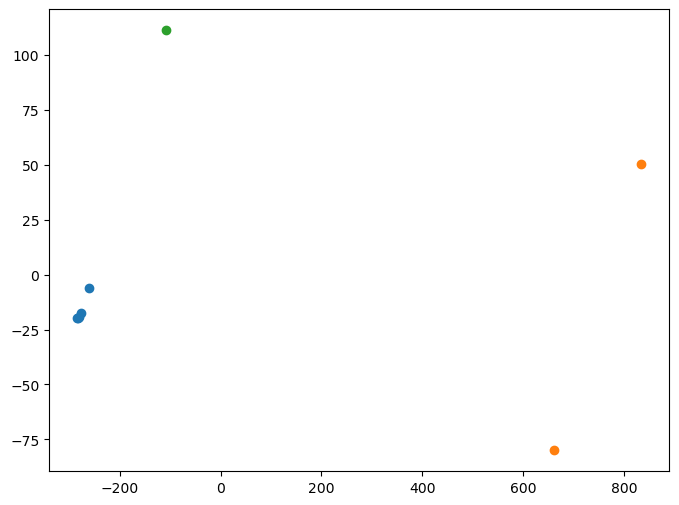

In [131]:
tic = timer()

labels = ['RAP < 0', '0 ≤ RAP ≤ 0.4', 'RAP > 0.4']
file_labels = ['ICP_ABP_measures', 'NIRS_measures', 'PbtO2_measures']
optimal_k = [3, 3 ,3]
resolutions = ['M', '5T', '10T', '30T', 'H']

warnings.filterwarnings('ignore')

for resolution_index, resolution in enumerate(resolutions):
#     if not resolution == '10T':
#         continue
    print("Resolution in progress: ", resolution)
    
    for index, file_segment in enumerate(df_all):
        print("Data segment in progress: ", file_labels[index])

        if resolution == 'M':
                pass
        else:   
            file_segment = convert_parameter_resolution(file_segment, resolution)

        if index == 1:
            file_segment = cleaning_NIRS_measures_parameters(file_segment)

        file_segment_edited = file_segment.dropna()
        file_segment_edited = file_segment_edited.drop(columns=['DateTime'])
        
        # Splitting data into three segments
        breakpoints = [0, 0.4]

        segment1 = file_segment_edited[file_segment_edited['RAP'] < breakpoints[0]]
        segment2 = file_segment_edited[(file_segment_edited['RAP'] >= breakpoints[0]) & (file_segment_edited['RAP'] <= breakpoints[1])]
        segment3 = file_segment_edited[file_segment_edited['RAP'] > breakpoints[1]]

        segments = [segment1, segment2, segment3]

        for segment_no, segment in enumerate(segments):
            print(len(segment))
            print("RAP segment in progress: ", labels[segment_no])
            #calculating_clusters(segment, segment_no, resolution, file_labels[index], labels)
            visualize_clusters_pca(segment, segment_no, resolution, file_labels[index])
            
            print("---------------------------------------------------------------------------")
            print("\n")
            break
        break
    break
            
    
tac = timer()
print("Execution time: ",round((tac-tic)/60, 2), "minutes")

In [101]:
for index, file_segment in enumerate(df_all):
    print(len(file_segment))

3621537
812525
1701675


In [15]:
parameter_list_modified = ['ICP', 'AMP', 'MAP', 'CPP', 'PRx', 'PAx', 'RAC', \
                              'RSO2_L', 'RSO2_R', 'COx_L', 'COx_R', 'COxA_L', 'COxA_R', 'PbtO2']

parameter_list_w_patient = parameter_list_modified + ['Patient']


df_responsiveness = pd.DataFrame(index=range(len(files)), columns=parameter_list_w_patient)
value = 0
count = 0
for file_index, file in enumerate(files):
    patient = file.replace('.csv', '')
    for parameter in parameter_list_modified:
        if file_index>50:
            value = 1
        df_responsiveness.at[file_index, parameter] = value
        df_responsiveness.at[file_index, 'Patient'] = patient

In [16]:
df_responsiveness

,ICP,AMP,MAP,CPP,PRx,PAx,RAC,RSO2_L,RSO2_R,COx_L,COx_R,COxA_L,COxA_R,PbtO2,Patient
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CAHR-1
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CAHR-10
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CAHR-100
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CAHR-101
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,CAHR-102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
374,1,1,1,1,1,1,1,1,1,1,1,1,1,1,UBC_84
375,1,1,1,1,1,1,1,1,1,1,1,1,1,1,UBC_85
376,1,1,1,1,1,1,1,1,1,1,1,1,1,1,UBC_86
377,1,1,1,1,1,1,1,1,1,1,1,1,1,1,UBC_87
